# (OUTDATED AS OF SEPT 7 2025) Transcription Factor Project - Differential Expression Analysis and Minimum Distortion Embedding
**Robin Anwyl, UCSD Subramaniam Lab**

**Project Goal:** Analyze the hiPSC Perturb-seq dataset from the Mali lab (Nourreddine et al preprint) to investigate the effects of transcription factor knockouts (TF KOs)

**Notebook Description:** 
-  Dataset: QC'd TF KO (and NTC) dataset
-  Analysis: pseudobulk differential expression analysis (DEA), pairwise Pearson correlation matrix, minimum distortion embedding (MDE)
***

# Import statements

In [1]:
# import muon as mu
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import gc
#from plotnine import ggplot, aes, geom_bar, ggtitle, xlab, ylab, scale_fill_manual, geom_histogram, labs, theme, element_text, scale_y_continuous
#from sklearn.ensemble import IsolationForest
#from sklearn.svm import OneClassSVM
from tqdm.auto import tqdm
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy.stats import ks_2samp
from scipy.stats import gamma
from scipy.stats import spearmanr
import seaborn as sns
#import dcor
from joblib import Parallel, delayed
from tqdm import tqdm
from tqdm_joblib import tqdm_joblib
# import networkx as nx
# from pydeseq2.dds import DeseqDataSet
# from pydeseq2.ds import DeseqStats
# from pydeseq2.default_inference import DefaultInference
import pickle as pkl
#import openpyxl
from IPython.display import display  #type: ignore
from scipy.spatial.distance import pdist, squareform #type: ignore
import plotly.express as px #type: ignore
import plotly.graph_objects as go #type: ignore
import pymde #type: ignore
import plotly.io as pio #type: ignore
from sklearn.preprocessing import StandardScaler #type: ignore
from sklearn.neighbors import kneighbors_graph #type: ignore
from sklearn.manifold import SpectralEmbedding
import igraph as ig #type: ignore
import leidenalg #type: ignore
from biothings_client import get_client
import decoupler as dc
import sys
import os
sys.path.insert(0, "/home/ranwyl/data_tf_project/")
import perturb_seq_heuristic_pipeline as qc
import pan_genome_analysis_functions as qc2

Note: use terminal command " watch -n 0.1 free -h " to watch how much memory is being used

# Filtering lowly expressed genes (copy pasted from feature selection tests notebook)

In [ ]:
# DE results
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/old_TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl")
de_results.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.93709,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.93709,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.93709,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.93709,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485


In [ ]:
def filter_low_cell_number_genes(adata, min_percent_cells, layer="pre_z_normalization"):
    n_genes_before = adata.shape[1]
    data_matrix = adata.layers[layer] if layer in adata.layers else adata.layers["counts"]
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()
    
    # Determine how many cells express each gene and remove bottom percentile
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    threshold = np.percentile(gene_detected_counts, min_percent_cells)
    genes_to_keep = gene_detected_counts > threshold
    adata = adata[:,genes_to_keep].copy()
    
    print(f"Removed {n_genes_before - adata.shape[1]} genes (bottom {min_percent_cells}%)")
    print(f"{adata.shape[1]} genes remaining")

    # Calculate mean gene expression
    print(f"Mean gene expression after removal: ")

    # Determine how many cells have minimum number of genes expressed
    genes_expr_per_cell = (data_matrix > 0).sum(axis=1)
    min_genes_expr_per_cell = np.min(genes_expr_per_cell)
    n_cells_with_min_genes_expr = \
        np.count_nonzero(genes_expr_per_cell == min_genes_expr_per_cell)
    print(f"Minimum number of genes expressed per cell: {min_genes_expr_per_cell} genes")
    print(f"Number of cells with minimum number of genes expressed: {n_cells_with_min_genes_expr} cells")
    return adata

def filter_low_expressed_genes(adata, layer="counts", percent_threshold=None, min_n_cells=None):
    n_genes_before = adata.shape[1]
    data_matrix = adata.layers[layer] if layer in adata.layers else adata.layers["counts"]
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()
    
    # Filter genes expressed in fewer than min_n_cells cells
    if min_n_cells:
        gene_detected_counts = (data_matrix > 0).sum(axis=0)
        genes_pass_cell_thr = gene_detected_counts >= min_n_cells
        data_matrix = data_matrix[:, genes_pass_cell_thr].copy()
        adata = adata[:,genes_pass_cell_thr].copy()

    if percent_threshold:
        if layer == "counts":
            # Take column sums
            col_values = data_matrix.sum(axis=0)
        elif layer == "pre_z_normalization":
            # Calculate mean per-gene expression
            col_values = data_matrix.mean(axis=0)
        # Set percent threshold and filter genes
        threshold = np.percentile(col_values, percent_threshold)
        genes_to_keep = col_values > threshold
        adata = adata[:,genes_to_keep].copy()
    
    print(f"Removed {n_genes_before - adata.shape[1]} genes")
    return adata

def hvg_selection(adata, method="seurat_v3"):
    adata_copy = adata.copy()
    if method == "seurat_v3":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="counts")
    elif method == "cell_ranger":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="pre_z_normalization")
    hvg_set = set(adata_copy.var.index.tolist())
    return hvg_set

def filter_degs_padj(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold and p-adj < threshold
    lfc_degs_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs_set

def filter_degs_pval(de_df, lfc_threshold=0.25, pval_threshold=0.05, tf_ko_list=None):
    if not tf_ko_list:
        # Get list of perturbations from column labels
        perts = {col.split("_")[0] for col in de_df.columns}
    else:
        perts = tf_ko_list
    # Get genes where |L2FC| > threshold and p-adj < threshold
    deg_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        pval_col = f"{pert}_pvalue"
        deg_set.update(de_df.loc[(abs(de_df[l2fc_col]) > lfc_threshold) 
                                   & (de_df[pval_col] < pval_threshold)].index)
    return deg_set

degs_padj = filter_degs_padj(de_results, padj_threshold=0.05)
degs_pval = filter_degs_pval(de_results, pval_threshold=0.0005)

def get_degs_hvgs(adata, filt_layer=None, percent_thr=None, n_cells_thr=None, 
                  hvg_method="seurat_v3", padj_or_pval="padj",
                  degs_padj_set=None, degs_pval_set=None):
    # Filter genes
    if filt_layer:
        genes_before = set(adata.var.index.tolist())
        adata = filter_low_expressed_genes(adata, filt_layer, 
                                           percent_threshold=percent_thr, 
                                           min_n_cells=n_cells_thr)
        genes_rm = genes_before - set(adata.var.index.tolist())
    
    # HVGs
    hvg_set = hvg_selection(adata, hvg_method)
    # DEGs
    if padj_or_pval == "padj":
        if not degs_padj_set:
            deg_set = filter_degs_padj(de_results, padj_threshold=0.05)
        else:
            deg_set = degs_padj_set
    elif padj_or_pval == "pval":
        if not degs_pval_set:
            deg_set = filter_degs_pval(de_results, pval_threshold=0.0005)
        else:
            deg_set = degs_pval_set
    if filt_layer:
        deg_set = deg_set - genes_rm
    
    n_shared_genes = len([g for g in hvg_set if g in deg_set])
    print(f"{len(deg_set)} DEGs, {len(hvg_set)} HVGs, {n_shared_genes} shared genes")
    return deg_set, hvg_set, adata

In [ ]:
def hvg_selection(adata, method="seurat_v3"):
    adata_copy = adata.copy()
    if method == "seurat_v3":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="counts")
    elif method == "cell_ranger":
        sc.pp.highly_variable_genes(adata_copy, n_top_genes=2000, subset=True, 
                                    flavor=method, layer="pre_z_normalization")
    hvg_set = set(adata_copy.var.index.tolist())
    return hvg_set

def filter_degs_padj(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold and p-adj < threshold
    lfc_degs_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs_set

def get_degs_hvgs(adata, filt_layer=None, percent_thr=None, n_cells_thr=None, 
                  hvg_method="seurat_v3", padj_or_pval="padj",
                  degs_padj_set=None, degs_pval_set=None):
    # Filter genes
    if filt_layer:
        genes_before = set(adata.var.index.tolist())
        adata = filter_low_expressed_genes(adata, filt_layer, 
                                           percent_threshold=percent_thr, 
                                           min_n_cells=n_cells_thr)
        genes_rm = genes_before - set(adata.var.index.tolist())
    
    # HVGs
    hvg_set = hvg_selection(adata, hvg_method)
    # DEGs
    if padj_or_pval == "padj":
        if not degs_padj_set:
            deg_set = filter_degs_padj(de_results, padj_threshold=0.05)
        else:
            deg_set = degs_padj_set
    elif padj_or_pval == "pval":
        if not degs_pval_set:
            deg_set = filter_degs_pval(de_results, pval_threshold=0.0005)
        else:
            deg_set = degs_pval_set
    if filt_layer:
        deg_set = deg_set - genes_rm
    
    n_shared_genes = len([g for g in hvg_set if g in deg_set])
    print(f"{len(deg_set)} DEGs, {len(hvg_set)} HVGs, {n_shared_genes} shared genes")
    return deg_set, hvg_set, adata

In [ ]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [ ]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/old_TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl")

Remove 30% of genes with lowest expression and genes expressed in <100 cells

In [ ]:
res_norm_30pct_100cells_seurat_pval = \
    get_degs_hvgs(adata_tfs, filt_layer="pre_z_normalization", percent_thr=30, n_cells_thr=100, 
                  hvg_method="seurat_v3", padj_or_pval="pval",
                  degs_padj_set=degs_padj, degs_pval_set=degs_pval)

Removed 23775 genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
5435 DEGs, 2000 HVGs, 1419 shared genes


In [ ]:
_, hvgs_30_100, adata_norm_30pct_100cells_seurat_pval = res_norm_30pct_100cells_seurat_pval
adata_norm_30pct_100cells_seurat_pval

AnnData object with n_obs × n_vars = 31808 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [ ]:
adata_norm_30pct_100cells_seurat_pval.write_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_filtered_genes.h5ad")

In [ ]:
filt_genes = pd.DataFrame(adata_norm_30pct_100cells_seurat_pval.var.index)
filt_genes.head()

,0
0,ENSG00000241860
1,ENSG00000290385
2,ENSG00000291215
3,LINC01409
4,LINC01128


In [ ]:
filt_genes.to_pickle("/home/ranwyl/data_tf_project/genes_filt_30pct_100cells.pkl")

# DE analysis testing

In [2]:
adata_counts = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
adata_counts.X = adata_counts.layers["counts"].copy()
adata_counts

AnnData object with n_obs × n_vars = 31808 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [3]:
adata_norm = adata_counts.copy()
adata_norm.X = adata_norm.layers["pre_z_normalization"].copy()
adata_norm

AnnData object with n_obs × n_vars = 31808 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [5]:
genes_to_keep = pd.read_pickle("/home/ranwyl/data_tf_project/genes_filt_30pct_100cells.pkl")
genes_to_keep = genes_to_keep[0].tolist()
adata_counts = adata_counts[:,adata_counts.var.index.isin(genes_to_keep)].copy()
adata_norm = adata_norm[:,adata_norm.var.index.isin(genes_to_keep)].copy()

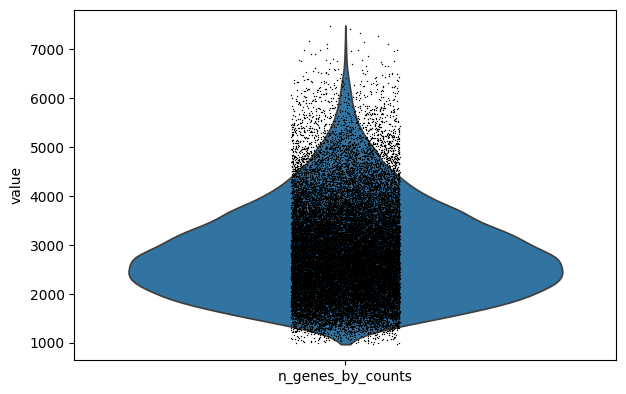

In [9]:
sc.pl.violin(adata_norm, "n_genes_by_counts")

In [6]:
def partition_test(adata, tf_ko):
    total_n_genes = adata.shape[1]
    # Partition two replicates
    target_indices = np.where(adata.obs['gene_target'] == tf_ko)[0]
    rep_size = len(target_indices) // 2
    sample_size = rep_size * 2
    np.random.seed(42)
    sampled_target_indices = np.random.choice(target_indices, sample_size, replace=False)

    # Total number of expressed genes
    all_gene_col_sums = (adata[sampled_target_indices].X > 0).sum(axis=0)
    total_n_expressed_genes = np.count_nonzero(all_gene_col_sums)

    # Number and percent of expressed genes
    rep1_indices = sampled_target_indices[:rep_size]
    rep1_gene_col_sums = (adata[rep1_indices, :].X > 0).sum(axis=0)
    rep1_n_expressed_genes = np.count_nonzero(rep1_gene_col_sums)
    rep1_pct_genes = round((rep1_n_expressed_genes / total_n_genes) * 100)

    rep2_indices = sampled_target_indices[rep_size:]
    rep2_gene_col_sums = (adata[rep2_indices, :].X > 0).sum(axis=0)
    rep2_n_expressed_genes = np.count_nonzero(rep2_gene_col_sums)
    rep2_pct_genes = round((rep2_n_expressed_genes / total_n_genes) * 100)

    print(f"TF KO {tf_ko} has {len(target_indices)} cells and {total_n_expressed_genes} total expressed genes")
    print(f"Rep 1 = {rep1_n_expressed_genes} expressed genes ({rep1_pct_genes}% of {total_n_genes})")
    print(f"Rep 2 = {rep2_n_expressed_genes} expressed genes ({rep2_pct_genes}% of {total_n_genes})")
    
def display_partition_test_results(adata, tf_ko_list):
    for tf_ko in tf_ko_list:
        partition_test(adata, tf_ko)
        print()

In [7]:
partition_test_tf_kos = ["EMX1", "ONECUT2", "NEUROD2", "SOX13", "FOXQ1", "PGR"]
display_partition_test_results(adata_counts, partition_test_tf_kos)

TF KO EMX1 has 25 cells and 11953 total expressed genes
Rep 1 = 9972 expressed genes (72% of 13792)
Rep 2 = 10502 expressed genes (76% of 13792)

TF KO ONECUT2 has 30 cells and 12073 total expressed genes
Rep 1 = 10575 expressed genes (77% of 13792)
Rep 2 = 10414 expressed genes (76% of 13792)

TF KO NEUROD2 has 35 cells and 12473 total expressed genes
Rep 1 = 11209 expressed genes (81% of 13792)
Rep 2 = 10645 expressed genes (77% of 13792)

TF KO SOX13 has 40 cells and 12638 total expressed genes
Rep 1 = 11252 expressed genes (82% of 13792)
Rep 2 = 11248 expressed genes (82% of 13792)

TF KO FOXQ1 has 45 cells and 13019 total expressed genes
Rep 1 = 11999 expressed genes (87% of 13792)
Rep 2 = 11690 expressed genes (85% of 13792)

TF KO PGR has 50 cells and 13061 total expressed genes
Rep 1 = 11942 expressed genes (87% of 13792)
Rep 2 = 11857 expressed genes (86% of 13792)



# Differential expression analysis (DEA) on TF KO and NTC dataset (with lowly expressed genes filtered out) for downstream analysis

The DE results will be used for pre-ranked GSEA, so DEA must be run with LFC shrinkage and with all results saved (not just DEGs with p-adj > 0.05). The following DEA code (modified from Mali lab code) was tested in the `tf_project_testing` notebook. 

We will also remove lowly expressed genes: 30% of genes with lowest expression (normalized and log1p-transformed) in TF KO cells and genes expressed in fewer than 100 TF KO cells. This was tested in the `tf_project_mde_tests` notebook.

In [2]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

# Genes that passed filtering out lowly expressed genes
genes_to_keep = pd.read_pickle("/home/ranwyl/data_tf_project/genes_filt_30pct_100cells.pkl")
genes_to_keep = genes_to_keep[0].tolist()

In [3]:
# Function to filter TF KO and NTC cells
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

def pre_DE_analysis(adata, genes_to_keep_list):
    """
    Prepare dataset for differential expression analysis using PyDESeq2.
    """
    # Filter TF KO and NTC cells
    adata = filter_tf_ko_and_ntc(adata)
    # Reset adata.X to raw counts
    adata.X = adata.layers["counts"].copy()
    # Remove lowly expressed genes
    adata = adata[:,adata.var.index.isin(genes_to_keep_list)].copy()
    return adata

Run DEA with lfc_shrink(adapt=False)

In [4]:
def tf_pseudo_bulk_replicates_for_DE(adata, gene_target, ntc_cells, n_replicates=3, sample_fraction=0.85, layer=None):
    """
    Generate pseudo-bulk replicates for a given gene target and matched NTC cells. 
    Modified to manually set NTC as reference for differential expression analysis.
    """
    data_matrix = adata.layers[layer] if layer else adata.X
    target_indices = np.where(adata.obs['gene_target'] == gene_target)[0]
    n_target = len(target_indices)
    target_bulk = []
    ntc_bulk = []
    sample_names = []
    control_names = []

    for i in range(n_replicates):
        # Sample from gene_target
        sampled_target_indices = np.random.choice(target_indices, int(n_target * sample_fraction), replace=False)
        target_profile = data_matrix[sampled_target_indices].sum(axis=0)
        target_bulk.append(target_profile)
        sample_names.append(f"{gene_target}_rep_{i+1}")

        # Sample from NTC
        sampled_ntc_indices = np.random.choice(ntc_cells, int(n_target * sample_fraction), replace=False)
        ntc_profile = data_matrix[sampled_ntc_indices].sum(axis=0)
        ntc_bulk.append(ntc_profile)
        control_names.append(f"NTC_rep_{i+1}")
    
    # Convert to DataFrame
    sample_names.extend(control_names)
    # Build counts DataFrame
    pseudo_bulk_df = pd.DataFrame(np.vstack(target_bulk + ntc_bulk), index=sample_names, columns=adata.var_names)
    pseudo_bulk_df = pseudo_bulk_df[pseudo_bulk_df.columns[pseudo_bulk_df.sum(axis=0)>=1]] #Remove any samples with 0s in both NTC and Perturbed Sample
    # Build metadata DataFrame
    metadata_records = [{'condition': sample.split('_')[0]} for sample in sample_names]
    metadata_df = pd.DataFrame(metadata_records, index=sample_names)
    # Set NTC as reference
    metadata_df["condition"] = pd.Categorical(
        metadata_df["condition"],
        categories=["NTC", gene_target],
        ordered=True
        )

    return pseudo_bulk_df, metadata_df


def tf_deseq2(data, metadata, contrast, alpha=0.05, n_cpus=8):
    """
    Run differential expression analysis on a single gene target using PyDESeq2.
    """
    inference = DefaultInference(n_cpus=n_cpus) # Only use n_cpus CPUs
    
    # Read counts modeling and fitting dispersions
    dds = DeseqDataSet(
        counts = data, 
        metadata = metadata, 
        design="~condition",
        refit_cooks=True,
        inference=inference,
        quiet=True
        )
    dds.deseq2()
    
    # Statistical testing
    stat_res = DeseqStats(
        dds, 
        contrast=contrast, 
        alpha=alpha,
        inference=inference,
        quiet=True)
    stat_res.summary()
    # Shrink LFCs for downstream analysis
    stat_res.lfc_shrink(coeff=f"condition[T.{contrast[1]}]", adapt=False) 
    results = stat_res.results_df
    return results


def tf_run_deseq2_analysis(adata, n_cpus=8, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                            n_replicates=3, sample_fraction=0.85, layer=None, alpha=0.05):
    """
    Run differential expression analysis on each gene target in the dataset.
    """
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = tf_pseudo_bulk_replicates_for_DE(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, 
            sample_fraction=sample_fraction, layer=layer
        )
        return tf_deseq2(
            pseudo_bulk_df, 
            metadata_df, 
            contrast=["condition", gene_target, ntc_cells_delimiter], 
            alpha=alpha,
            n_cpus=n_cpus)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_cpus)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DE_df(results_dict):
    df_list = list()
    for gene_target, df in results_dict.items():
        df = df.sort_index() # Sort genes alphabetically
        # Prepend TF KO name to each column label
        new_col_names = {col: f"{gene_target}_{col}" for col in df}
        df = df.rename(columns=new_col_names)
        df_list.append(df)
    # Concatenate all DE result DataFrames (using intersection of genes)
    de_df = pd.concat(df_list, axis=1)
    de_df = de_df.sort_index() # Sort genes alphabetically
    return de_df

In [7]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_alpha

AnnData object with n_obs × n_vars = 84485 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

In [8]:
adata_alpha = pre_DE_analysis(adata_alpha, genes_to_keep)
adata_alpha.shape

(45429, 13792)

In [9]:
results_dict_alpha = tf_run_deseq2_analysis(adata_alpha, n_cpus=25)

Running DE analysis:   0%|          | 0/643 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserW

In [10]:
alpha_DE_df = tf_save_DE_df(results_dict_alpha)

In [11]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_beta = pre_DE_analysis(adata_beta, genes_to_keep)
results_dict_beta = tf_run_deseq2_analysis(adata_beta, n_cpus=25)
beta_DE_df = tf_save_DE_df(results_dict_beta)

Running DE analysis:   0%|          | 0/8 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)


In [12]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")
adata_gamma = pre_DE_analysis(adata_gamma, genes_to_keep)
results_dict_gamma = tf_run_deseq2_analysis(adata_gamma, n_cpus=25)
gamma_DE_df = tf_save_DE_df(results_dict_gamma)

Running DE analysis:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
aggregate_DE_df = pd.concat([alpha_DE_df, beta_DE_df, gamma_DE_df], axis=1)
aggregate_DE_df = aggregate_DE_df.sort_index()

In [14]:
aggregate_DE_df.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.285500,0.609960,0.619478,1.250948,0.210953,NaN,3.123957,-0.372431,0.747259,-0.721735,...,0.991264,-0.500306,0.616860,NaN,2.614595,-0.388893,0.816637,-0.736728,0.461288,0.937480
A2ML1,2.606644,0.100952,0.769812,0.197628,0.843336,NaN,1.550960,-0.509398,0.982173,-0.941713,...,1.138998,-0.221171,0.824959,NaN,2.470636,-0.309124,0.809974,-0.593803,0.552644,0.950115
A2ML1-AS1,8.352237,0.077233,0.476058,0.189240,0.849904,NaN,4.474111,-0.086464,0.641921,-0.181294,...,0.902441,-1.561968,0.118296,NaN,11.032901,0.407476,0.450120,1.039717,0.298471,0.916599
AAAS,7.516582,0.150004,0.507604,0.353576,0.723657,NaN,6.140222,-0.182040,0.560998,-0.406698,...,0.736081,0.548093,0.583628,NaN,6.569917,-0.557903,0.565281,-1.206801,0.227509,0.894912
AACS,13.652746,-0.607225,0.388791,-1.720363,0.085366,NaN,11.690521,0.006217,0.417831,0.015168,...,0.694740,0.985767,0.324247,NaN,9.678652,-0.525741,0.473100,-1.283670,0.199258,0.893908


In [15]:
filepath_pkl = "/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl"
aggregate_DE_df.to_pickle(filepath_pkl)

In [4]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")
de_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.285500,0.609960,0.619478,1.250948,0.210953,NaN,3.123957,-0.372431,0.747259,-0.721735,...,0.991264,-0.500306,0.616860,NaN,2.614595,-0.388893,0.816637,-0.736728,0.461288,0.937480
A2ML1,2.606644,0.100952,0.769812,0.197628,0.843336,NaN,1.550960,-0.509398,0.982173,-0.941713,...,1.138998,-0.221171,0.824959,NaN,2.470636,-0.309124,0.809974,-0.593803,0.552644,0.950115
A2ML1-AS1,8.352237,0.077233,0.476058,0.189240,0.849904,NaN,4.474111,-0.086464,0.641921,-0.181294,...,0.902441,-1.561968,0.118296,NaN,11.032901,0.407476,0.450120,1.039717,0.298471,0.916599
AAAS,7.516582,0.150004,0.507604,0.353576,0.723657,NaN,6.140222,-0.182040,0.560998,-0.406698,...,0.736081,0.548093,0.583628,NaN,6.569917,-0.557903,0.565281,-1.206801,0.227509,0.894912
AACS,13.652746,-0.607225,0.388791,-1.720363,0.085366,NaN,11.690521,0.006217,0.417831,0.015168,...,0.694740,0.985767,0.324247,NaN,9.678652,-0.525741,0.473100,-1.283670,0.199258,0.893908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,1.936280,0.399434,0.914994,0.746997,0.455065,NaN,0.847039,-1.352335,1.868836,-1.441918,...,1.138496,0.365796,0.714517,NaN,0.821237,-0.151334,1.085225,-0.333261,0.738938,0.977516
ZYG11B,18.247310,0.038689,0.334166,0.123994,0.901320,NaN,12.379707,-0.510436,0.415147,-1.377508,...,0.500329,-0.321024,0.748192,NaN,15.932747,-0.174367,0.371898,-0.518199,0.604320,0.954821
ZYX,22.916347,0.018090,0.297322,0.063336,0.949499,NaN,15.218808,0.244391,0.373242,0.721548,...,0.688878,0.004616,0.996317,NaN,16.135930,0.426690,0.376842,1.248127,0.211985,0.894912
ZZEF1,5.599009,-0.137232,0.571315,-0.304019,0.761113,NaN,6.190842,0.929886,0.618079,1.848373,...,0.814633,-0.411803,0.680484,NaN,5.908567,-0.227841,0.573063,-0.499849,0.617182,0.957720


### Rename genes by Ensembl ID

In [5]:
all_genes = de_results.index.tolist()
ensg_genes = [g for g in all_genes if g.startswith("ENSG")]
print(len(ensg_genes))
print(ensg_genes[:5])

838
['ENSG00000170846', 'ENSG00000176593', 'ENSG00000179066', 'ENSG00000183308', 'ENSG00000187186']


In [6]:
mg = get_client('gene')

In [7]:
ensembl_results_all = mg.querymany(ensg_genes, fields='symbol', species='human')

Input sequence provided is already in string format. No operation performed
4 input query terms found dup hits:	[('ENSG00000228566', 2), ('ENSG00000234352', 2), ('ENSG00000249738', 2), ('ENSG00000257545', 2)]
66 input query terms found no hit:	['ENSG00000214955', 'ENSG00000228434', 'ENSG00000228648', 'ENSG00000229191', 'ENSG00000234405', 'ENS


Manually search for the 4 genes with duplicate hits on GeneCards. To break ties, use the highest GeneCards Inferred Functionality Score (GIFtS). If there is a tie between highest scoring gene symbols, keep the gene as its Ensembl ID.

In [8]:
dup_hits = {'ENSG00000234352': 'LOC349160', 'ENSG00000249738':'IL12B-AS1', 'ENSG00000257545':'LOC100287944'}

Rename genes

In [9]:
ensembl_to_gene = dict()
for r in ensembl_results_all:
  if r.get('symbol'):
      ensembl_to_gene[r.get('query')] = r.get('symbol')
print(len(ensembl_to_gene))

186


In [10]:
ensembl_to_gene.update(dup_hits)
print(len(ensembl_to_gene))

186


In [13]:
# Rename genes in DataFrame
def rename_ensembl_genes(de_df, ensembl_to_gene_dict):
    de_df_renamed = de_df.rename(index=ensembl_to_gene_dict)
    print(f"Converted {len(ensembl_to_gene_dict)} Ensembl IDs to gene symbols")
    return de_df_renamed

In [14]:
de_results_renamed = rename_ensembl_genes(de_results, ensembl_to_gene)

Converted 186 Ensembl IDs to gene symbols


Write out results

In [15]:
de_results.to_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_gene_symbols.pkl")

# Post-DEA QC/preprocessing

### Normalization, log1p transformation, and batch correction on TF KO & NTC dataset

In [9]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

In [10]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

In [ ]:
# Filter TF KO and NTC cells
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

# Remove lowly expressed genes based on list
def filter_low_expr_genes(adata, genes_to_keep_list):
    return adata[:,adata.var.index.isin(genes_to_keep_list)].copy()

def filter_cells_and_genes(adata, genes_to_keep_list):
    adata = filter_tf_ko_and_ntc(adata)
    return filter_low_expr_genes(adata, genes_to_keep_list)

# Genes that passed filtering out lowly expressed genes
genes_to_keep = pd.read_pickle("/home/ranwyl/data_tf_project/genes_filt_30pct_100cells.pkl")
genes_to_keep = genes_to_keep[0].tolist()

In [15]:
adata_alpha_filtered = filter_cells_and_genes(adata_alpha, genes_to_keep)
adata_beta_filtered = filter_cells_and_genes(adata_beta, genes_to_keep)
adata_gamma_filtered = filter_cells_and_genes(adata_gamma, genes_to_keep)

In [16]:
adata_combined = ad.concat([adata_alpha_filtered, adata_beta_filtered, adata_gamma_filtered])
adata_combined.X = adata_combined.layers["counts"].copy()
adata_combined

AnnData object with n_obs × n_vars = 69241 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts'

Normalization to median UMI count of all NTC cells

In [17]:
median_NTC_UMIs = np.median(qc2._get_ntc_view(adata_combined).obs.n_UMI_counts)
sc.pp.normalize_total(adata_combined, target_sum=median_NTC_UMIs)

normalizing counts per cell
    finished (0:00:00)


Log1p transformation and batch correction

In [18]:
sc.pp.log1p(adata_combined)
a = adata_combined[adata_combined.obs.run == 'ALPHA'].copy()
b = adata_combined[adata_combined.obs.run == 'BETA'].copy()
c = adata_combined[adata_combined.obs.run == 'GAMMA'].copy()

In [19]:
qc2.relative_z_normalization(a)
qc2.relative_z_normalization(b)
qc2.relative_z_normalization(c)
normalized_adata = ad.concat([a,b,c])
normalized_adata

AnnData object with n_obs × n_vars = 69241 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [23]:
normalized_adata.write("/home/ranwyl/data_tf_project/Final_Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")

# Preprocessing

## Data read-in

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Final_Aggregate_TF_KO_Batch_Normalized.h5ad")

In [4]:
adata_tfs

AnnData object with n_obs × n_vars = 31808 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Read in set of TFs

In [3]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

Read in differential expression analysis results from TF KO and NTC dataset (lowly expressed genes from TF KO dataset filtered out, 85% sample fraction, LFC shrinkage performed with adapt=False)

In [3]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

In [27]:
de_results.head()

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.285500,0.609960,0.619478,1.250948,0.210953,NaN,3.123957,-0.372431,0.747259,-0.721735,...,0.991264,-0.500306,0.616860,NaN,2.614595,-0.388893,0.816637,-0.736728,0.461288,0.937480
A2ML1,2.606644,0.100952,0.769812,0.197628,0.843336,NaN,1.550960,-0.509398,0.982173,-0.941713,...,1.138998,-0.221171,0.824959,NaN,2.470636,-0.309124,0.809974,-0.593803,0.552644,0.950115
A2ML1-AS1,8.352237,0.077233,0.476058,0.189240,0.849904,NaN,4.474111,-0.086464,0.641921,-0.181294,...,0.902441,-1.561968,0.118296,NaN,11.032901,0.407476,0.450120,1.039717,0.298471,0.916599
AAAS,7.516582,0.150004,0.507604,0.353576,0.723657,NaN,6.140222,-0.182040,0.560998,-0.406698,...,0.736081,0.548093,0.583628,NaN,6.569917,-0.557903,0.565281,-1.206801,0.227509,0.894912
AACS,13.652746,-0.607225,0.388791,-1.720363,0.085366,NaN,11.690521,0.006217,0.417831,0.015168,...,0.694740,0.985767,0.324247,NaN,9.678652,-0.525741,0.473100,-1.283670,0.199258,0.893908


In [28]:
de_results.shape

(13792, 3912)

## Filter TF KO cells

Read in batch-corrected TF KO and NTC dataset

In [29]:
adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Final_Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")

Filter TF KO cells

In [30]:
print(f"number of cells before filtering: {adata.obs.shape[0]}")
adata_tfs = adata[adata.obs["gene_target"].isin(tfs)].copy()
print(f"number of cells after filtering: {adata_tfs.obs.shape[0]}")

number of cells before filtering: 69241
number of cells after filtering: 31808


In [31]:
adata_tfs

AnnData object with n_obs × n_vars = 31808 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [32]:
adata_tfs.write_h5ad("/home/ranwyl/data_tf_project/Final_Aggregate_TF_KO_Batch_Normalized.h5ad")

### Display TF KO info and plot histogram

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [8]:
adata_tfs

AnnData object with n_obs × n_vars = 31808 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [9]:
adata_counts = adata_tfs.layers["counts"]

Number of unique TF KOs

In [18]:
unique_tfs = adata_tfs.obs["gene_target"].unique().tolist()
print(len(unique_tfs))

652


Save list of unique TF KOs as a .txt file

In [ ]:
with open("/home/ranwyl/results_tf_project/tf_list_652.txt", "w") as f:
    for tf in unique_tfs:
        f.write(f"{tf}\n")

Number of cells per TF KO

In [4]:
cells_per_tf_ko = adata_tfs.obs['gene_target'].value_counts()

In [5]:
cells_per_tf_ko.head(10)

gene_target
ZFP41       209
ARHGAP35    186
DNMT1       150
ZNF354A     139
BHLHE40     139
CHAMP1      135
SMAD9       124
MEIS3       122
FOXH1       116
SHOX2       110
Name: count, dtype: int64

In [35]:
cells_per_tf_ko.iloc[230:250]

gene_target
ZSCAN26    51
HES7       51
ZBTB41     51
ZNF134     51
ZNF32      50
PGR        50
CAMTA2     50
PRDM13     50
ZNF747     50
SALL4      50
ZNF441     50
TIGD4      50
NFE2L1     50
NEUROG1    50
GTF2I      50
VDR        50
GRHL3      50
SP2        49
ZNF621     49
CRX        49
Name: count, dtype: int64

In [ ]:
def plot_cells_per_tf_ko(cells_per_tf_ko_value_counts, n_bins=30, x_label=None):
    ax = sns.histplot(cells_per_tf_ko_value_counts.values, bins=n_bins)
    if x_label == None:
        x_label = "Cells per TF KO"
    ax.set_xlabel(x_label, fontsize=12)
    ax.set_ylabel("Count", fontsize=12)

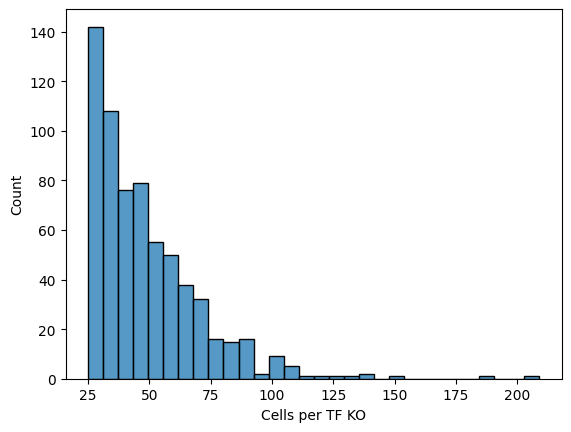

In [21]:
ax = sns.histplot(cells_per_tf_ko.values, bins=30)
p = plt.xlabel("Cells per TF KO")

In [3]:
def cells_per_batch(adata, dataset_name):
    for run in "ALPHA", "BETA", "GAMMA":
        print(f"In {dataset_name}, run {run} has {adata[adata.obs['run'] == run].shape[0]} cells")

# Feature selection

## HVGs

### Filter genes to 2000 HVGs

In [5]:
adata_hvgs = adata_tfs.copy()
sc.pp.highly_variable_genes(adata_hvgs, n_top_genes=2000, subset=True, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [6]:
adata_hvgs

AnnData object with n_obs × n_vars = 31808 × 2000
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [11]:
hvgs_final_list = adata_hvgs.var.index.tolist()
hvgs_final_list.sort()

In [15]:
with open("/home/ranwyl/results_tf_project/hvgs_final.txt", "w") as f:
    for hvg in hvgs_final_list:
        f.write(f"{hvg}\n")

In [12]:
hvgs = set(hvgs_final_list)

## DEGs with p-adj < 0.05

Write function to get set of DEGs that pass given LFC threshold and p-adj threshold based on DE results

In [5]:
def filter_degs_lfc_padj(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold and p-adj < threshold
    lfc_degs_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs_set.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs_set

Generate set of DEGs with |LFC| > 0.25 and p-adj < 0.05

In [6]:
degs_padj = filter_degs_lfc_padj(de_results)
print(len(degs_padj))

4265


In [7]:
adata_tfs_degs = adata_tfs[:, adata_tfs.var.index.isin(degs_padj)].copy()
adata_tfs_degs

AnnData object with n_obs × n_vars = 31808 × 4265
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [10]:
adata_degs_padj = adata_tfs_degs

Save p-adj DEG list

In [50]:
degs_padj_final_list = sorted(list(degs_padj))
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt", "w") as f:
    for deg in degs_padj_final_list:
        f.write(f"{deg}\n")

Sizes of intersection and union with HVGs

In [13]:
print(f"DEG HVG intersection: {len(degs_padj.intersection(hvgs))} genes")
print(f"DEG HVG union: {len(degs_padj.union(hvgs))} genes")

DEG HVG intersection: 1325 genes
DEG HVG union: 4940 genes


### Test different LFC thresholds

In [14]:
def filter_degs_lfc_padj(deg_df, lfc_threshold=0.25, padj_threshold=0.05):
    # Get list of perturbations from column labels
    perts = {col.split("_")[0] for col in deg_df.columns}
    # Get genes where |L2FC| > threshold and p-adj < threshold
    lfc_degs = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        lfc_degs.update(deg_df.loc[(abs(deg_df[l2fc_col]) > lfc_threshold) 
                                   & (deg_df[padj_col] < padj_threshold)].index)
    return lfc_degs

def test_n_degs(de_results, padj_thr):
    n_degs_list = list()
    lfc_thr_list = [0, 0.25, 0.5, 0.75, 1, 1.5, 2]
    for lfc_thr in lfc_thr_list:
        n_degs_list.append(len(filter_degs_lfc_padj(de_results, lfc_thr, padj_thr)))
    return lfc_thr_list, n_degs_list

def plot_n_degs(lfc_thr_list, n_degs_list, title, ymax=None):
    ax = sns.lineplot(x=lfc_thr_list, y=n_degs_list, marker="o")
    plt.xlabel("|LFC| Threshold", fontsize=12)
    plt.ylabel("Number of DEGs", fontsize=12)
    if ymax:
        ax.set_ylim(0, ymax)
    plt.title(title, fontsize=14)
    plt.grid()

For p-adj < 0.05

In [15]:
lfc_thresholds, n_degs_0pt05 = test_n_degs(de_results, 0.05)

In [25]:
print(lfc_thresholds)
print(n_degs_0pt05)

[0, 0.25, 0.5, 0.75, 1, 1.5, 2]
[4265, 4265, 4214, 3647, 2718, 1356, 707]


In [43]:
#plot_n_degs(lfc_thresholds, n_degs_0pt05, "Number of DEGs vs. |LFC| Threshold (p-adj < 0.05)", ymax=5500)

For p-adj < 0.025

In [26]:
lfc_thresholds, n_degs_0pt02 = test_n_degs(de_results, 0.02)
print(n_degs_0pt02)

[2922, 2922, 2881, 2442, 1817, 972, 544]


For p-adj < 0.01

In [27]:
lfc_thresholds, n_degs_0pt01 = test_n_degs(de_results, 0.01)
print(n_degs_0pt01)

[2338, 2338, 2298, 1923, 1474, 825, 474]


In [44]:
#plot_n_degs(lfc_thresholds, n_degs_0pt01, "Number of DEGs vs. |LFC| Threshold (p-adj < 0.01)", ymax=3000)

In [32]:
def plot_n_degs_multi_line(x, y1, y2, y3, label1, label2, label3, title):
    plt.plot(x, y1, label=label1, marker=".", color="tab:red")
    plt.plot(x, y2, label=label2, marker=".", color="tab:green")
    plt.plot(x, y3, label=label3, marker=".", color="tab:blue")
    plt.xlabel("|LFC| Threshold", fontsize=12)
    plt.ylabel("Number of DEGs", fontsize=12)
    plt.title(title, fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

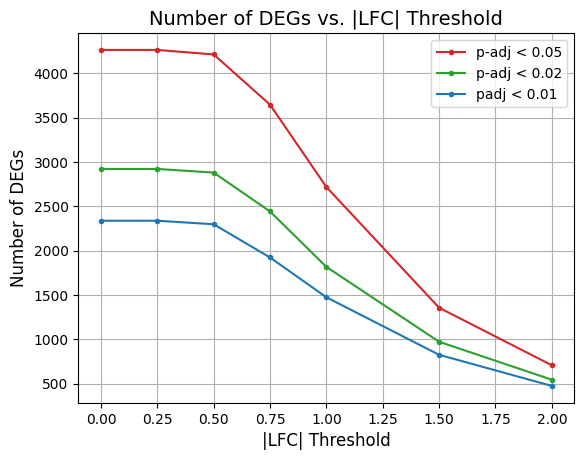

In [33]:
plot_n_degs_multi_line(x=lfc_thresholds, y1=n_degs_0pt05, y2=n_degs_0pt02, y3=n_degs_0pt01,
                       label1="p-adj < 0.05", label2="p-adj < 0.02", label3="padj < 0.01",
                       title="Number of DEGs vs. |LFC| Threshold")

## DEGs with p-value cutoff (decided p-val < 0.0005)

Write function to get set of DEGs that pass given LFC threshold and p-value threshold based on DE results

In [16]:
def filter_degs_lfc_pval(de_df, lfc_threshold=0.25, pval_threshold=0.05, tf_ko_list=None):
    if not tf_ko_list:
        # Get list of perturbations from column labels
        perts = {col.split("_")[0] for col in de_df.columns}
    else:
        perts = tf_ko_list
    # Get genes where |L2FC| > threshold and p-adj < threshold
    deg_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        pval_col = f"{pert}_pvalue"
        deg_set.update(de_df.loc[(abs(de_df[l2fc_col]) > lfc_threshold) 
                                   & (de_df[pval_col] < pval_threshold)].index)
    return deg_set

In [17]:
degs_pval = filter_degs_lfc_pval(de_results, pval_threshold=0.0005)
print(len(degs_pval))

4901


Save p-val DEG list

In [51]:
degs_pval_final_list = sorted(list(degs_pval))
with open("/home/ranwyl/results_tf_project/degs_pval_final.txt", "w") as f:
    for deg in degs_pval_final_list:
        f.write(f"{deg}\n")

Sizes of intersection and union with HVGs

In [40]:
print(f"DEG HVG intersection: {len(degs_pval.intersection(hvgs))} genes")
print(f"DEG HVG union: {len(degs_pval.union(hvgs))} genes")

DEG HVG intersection: 1354 genes
DEG HVG union: 5547 genes


### Test number of DEGs with |LFC| > 0.25 and different p-value thresholds

In [41]:
def test_n_degs_pval(de_df, lfc_thr, pval_thr_list):
    tf_kos = {col.split("_")[0] for col in de_df.columns}
    n_degs_list = list()
    for pval_thr in pval_thr_list:
        n_degs_list.append(len(filter_degs_lfc_pval(de_df, lfc_thr, pval_thr, tf_kos)))
    return n_degs_list

def plot_n_degs_pval(pval_thr_list, n_degs_list, title, ymax=None):
    ax = sns.lineplot(x=pval_thr_list, y=n_degs_list, marker="o")
    plt.xlabel("p-value Threshold", fontsize=14)
    plt.ylabel("Number of DEGs", fontsize=14)
    if ymax:
        ax.set_ylim(0, ymax)
    plt.title(title, fontsize=15)
    plt.grid()

In [42]:
pval_thresholds = [0.0005, 0.001, 0.005, 0.01]
n_degs_pval = test_n_degs_pval(de_results, 0.25, pval_thresholds)

In [43]:
print(pval_thresholds)
print(n_degs_pval)

[0.0005, 0.001, 0.005, 0.01]
[4901, 6493, 10495, 11910]


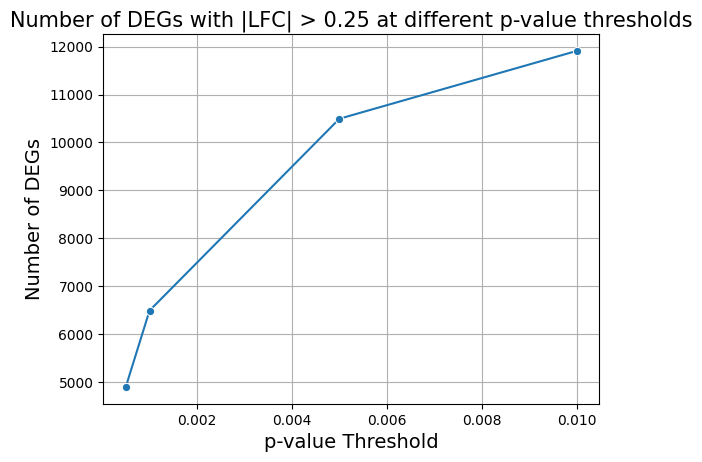

In [44]:
plot_n_degs_pval(pval_thresholds, n_degs_pval, 
                 "Number of DEGs with |LFC| > 0.25 at different p-value thresholds")

# Pairwise Pearson correlation matrix of mean profiles

In [8]:
def compute_mean_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    return mean_vector.A1 if hasattr(mean_vector, 'A1') else mean_vector

def tf_create_corrmatrix(adata, v_min=-1, v_max=1, color_map="RdBu"):
    gene_target_groups = adata.obs.groupby('gene_target').indices
    adata_mean_profiles = [compute_mean_profile(adata, indices) for indices in gene_target_groups.values()]
    adata_mean_profiles = np.array(adata_mean_profiles)
    corr_matrix = np.corrcoef(adata_mean_profiles)

    # Plot
    gene_target_labels = list(gene_target_groups.keys())
    distance_dataframe = pd.DataFrame(corr_matrix, index=gene_target_labels, columns=gene_target_labels)
    fig = sns.clustermap(distance_dataframe, cmap=color_map, xticklabels=False, yticklabels=False, vmax=v_max, vmin=v_min, center=0)
    fig.ax_heatmap.set_xlabel('')
    fig.ax_heatmap.set_ylabel('');
    return(distance_dataframe, adata_mean_profiles)

### Pairwise Pearson correlation matrix of mean profiles for p-adj DEG dataset

In [ ]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt") as f:
    degs_padj = {deg.strip() for deg in f.readlines()}
adata_degs_padj = adata_tfs[:, adata_tfs.var.index.isin(degs_padj)].copy()
adata_degs_padj

AnnData object with n_obs × n_vars = 31808 × 5096
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


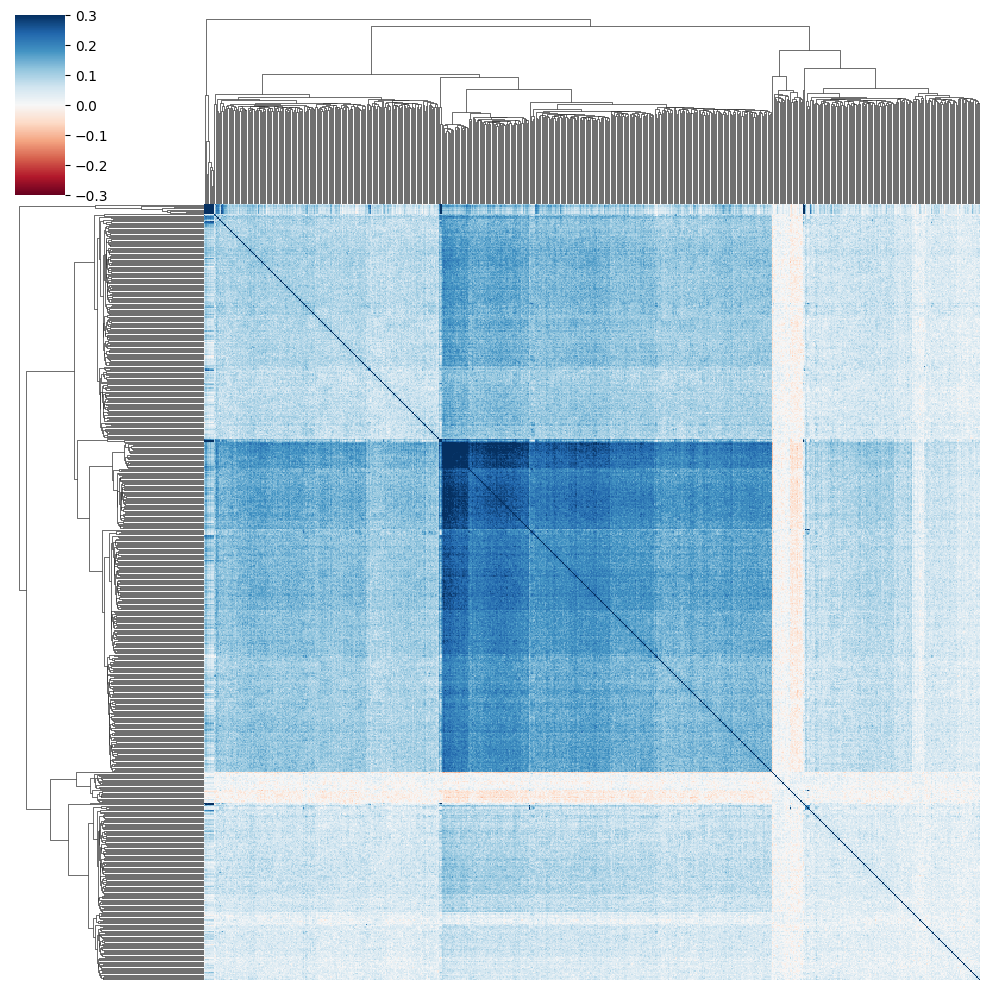

In [11]:
_ = tf_create_corrmatrix(adata_degs_padj, v_min=-0.3, v_max=0.3)

### Pairwise Pearson correlation matrix of mean profiles for p-val DEG dataset

In [ ]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [52]:
with open("/home/ranwyl/results_tf_project/degs_pval_final.txt") as f:
    degs_pval = {deg.strip() for deg in f.readlines()}
adata_degs_pval = adata_tfs[:, adata_tfs.var.index.isin(degs_pval)].copy()
adata_degs_pval

AnnData object with n_obs × n_vars = 31808 × 4901
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [12]:
# _ = tf_create_corrmatrix(adata_degs_pval, v_min=-0.3, v_max=0.3)

### Pairwise Pearson correlation matrix of mean profiles for 2000-HVG dataset

In [12]:
adata_2000 = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")

In [101]:
# _ = tf_create_corrmatrix(adata_2000, v_min=-0.3, v_max=0.3)

# Minimal Distortion Embedding (MDE)

### MDE functions

In [2]:
def compute_mean_normalized_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    normalized_mean_vector = (mean_vector - np.mean(mean_vector)) / np.std(mean_vector)
    return normalized_mean_vector.A1 if hasattr(normalized_mean_vector, 'A1') else normalized_mean_vector

def tf_compute_MDE(adata, label_points=False, leiden_neighbors=5, preserve='neighbors', spectral=False):
    adata = adata.copy()
    gene_target_groups = adata.obs.groupby('gene_target').indices
    # Changed code to no longer compute mean normalized profiles in parallel -Robin
    mean_profiles = [compute_mean_normalized_profile(adata, indices) for indices in gene_target_groups.values()]
    mean_profiles_array = np.array(mean_profiles)

    # Compute MDE
    pymde.seed(42) # Added by Robin to make pymde.preserve_neighbors() deterministic
    mde = None
    embedding = None
    if preserve == "neighbors":
        if spectral:
            spectral_embedding = SpectralEmbedding(
                n_components=30,  # Ensure this matches the pymde embedding dimension
                affinity='nearest_neighbors',
                n_neighbors=10,
                eigen_solver='arpack',
                random_state=42 # Added by Robin to make sklearn.SpectralEmbedding deterministic
            )
            initial_embedding = spectral_embedding.fit_transform(mean_profiles_array)
            mde = pymde.preserve_neighbors(initial_embedding, repulsive_fraction=15, n_neighbors = 15)
            embedding = mde.embed(max_iter=2000,print_every=100,verbose=True)
        else:
            mde = pymde.preserve_neighbors(mean_profiles_array, repulsive_fraction=15, n_neighbors=5)
            embedding = mde.embed(max_iter=4000,print_every=100,verbose=True)
    else:
        mde = pymde.preserve_distances(mean_profiles_array)
        embedding = mde.embed(max_iter=1000,print_every=100,verbose=True)

    # Run Leiden clustering on the embeddings
    knn_graph = kneighbors_graph(embedding, n_neighbors=leiden_neighbors, include_self=False)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(directed=False)
    g.add_vertices(embedding.shape[0])
    g.add_edges(zip(sources, targets))
    partition = leidenalg.find_partition(g, leidenalg.RBConfigurationVertexPartition, 
                                         seed=42 # Added by Robin to make leidenalg.find_partition() deterministic
                                         )
    
    # Get cluster labels and make pairwise correlation plot
    clusters = np.array(partition.membership)
    gene_targets = list(gene_target_groups.keys())
    embedding_df = pd.DataFrame(embedding, columns=['x', 'y'])
    embedding_df['gene_target'] = gene_targets
    embedding_df['cluster'] = clusters
    embedding_df['cluster'] = embedding_df['cluster'].astype(str)
    cluster_groups = embedding_df.groupby('cluster')
    centroids = cluster_groups[['x', 'y']].mean()
    pairwise_distances = pd.DataFrame(
        squareform(pdist(centroids, metric='euclidean')),
        index=centroids.index,
        columns=centroids.index
    )
    sns.clustermap(pairwise_distances, cmap='PuBuGn')
    plt.title('Pairwise Distance Matrix of Cluster Centroids')
    plt.show()

    # Plot using Plotly with Pastel colormap for discrete clusters
    fig = px.scatter(embedding_df, x='x', y='y', text='gene_target', color='cluster',
                     hover_data={'x': True, 'y': True, 'gene_target': True},
                     title='MDE Embedding of Mean Normalized Profiles',
                     color_discrete_sequence=px.colors.qualitative.Bold)
    fig.update_traces(marker=dict(size=7,opacity=0.7),textposition='middle center',textfont=dict(size=4))
    
    fig.update_layout(
        showlegend=True,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        plot_bgcolor='white',
        width=1200,  # Increase plot width
        height=1000,  # Increase plot height
        legend_title_text='Cluster',
        coloraxis_showscale=False
    )
    if not label_points: # Added by Robin
        fig.update_traces(text=None)
   
    fig.show()
    
    return adata, embedding, clusters, mean_profiles_array, embedding_df

def gene_targets_per_cluster(embedding_df):
    """
    Return DataFrame where each column contains the perturbations in a cluster.
    """
    cluster_nums = max([int(n) for n in set(embedding_df["cluster"].tolist())])
    cluster_dict = dict()
    for i in range(cluster_nums+1):
        cluster = embedding_df[embedding_df["cluster"] == str(i)]["gene_target"].tolist()
        cluster_dict[i] = cluster
    # Pad all columns to be the same length
    max_n_perts = max(len(cluster_dict[i]) for i in range(len(cluster_dict)))
    cluster_dict = {cluster:(perts + [""]*(max_n_perts-len(perts))) for cluster, perts in cluster_dict.items()}
    perts_in_cluster_df = pd.DataFrame(cluster_dict)
    return perts_in_cluster_df

def plot_n_perts_per_cluster(perts_in_cluster_df, title, ymax=50):
    n_perts_per_cluster = perts_in_cluster_df.nunique().tolist()
    xvals = [i for i in range(len(n_perts_per_cluster))]
    ax = sns.barplot(x=xvals, y=n_perts_per_cluster)
    ax.set_xlabel("Leiden cluster")
    ax.set_ylabel("Number of TF KOs in cluster")
    ax.set_ylim(0, ymax)
    ax.set_title(title)

### MDE with p-val DEGs as features

In [3]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [4]:
with open("/home/ranwyl/results_tf_project/degs_pval_final.txt") as f:
    degs_pval = {deg.strip() for deg in f.readlines()}
adata_degs_pval = adata_tfs[:, adata_tfs.var.index.isin(degs_pval)].copy()
adata_degs_pval

AnnData object with n_obs × n_vars = 31808 × 4901
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [14]:
# mde_degs_pval_8 = tf_compute_MDE(adata_degs_pval, label_points=False, spectral=True, leiden_neighbors=8)

In [45]:
# _, _, _, _, embedding_df_degs_pval_8 = mde_degs_pval_8
# perts_in_cluster_degs_pval_8 = gene_targets_per_cluster(embedding_df_degs_pval_8)
# perts_in_cluster_degs_pval_8.head()

In [43]:
# _ = plot_n_perts_per_cluster(perts_in_cluster_degs_pval_8, "TF KOs per cluster (DEGs with p-val threshold, 8 Leiden neighbors)")

In [ ]:
perts_in_cluster_degs_pval_8.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_degs_pval_8_nbrs.csv")

10 neighbors

In [15]:
# mde_degs_pval_10 = tf_compute_MDE(adata_degs_pval, label_points=False, spectral=True, leiden_neighbors=10)

In [44]:
# _, _, _, _, embedding_df_degs_pval_10 = mde_degs_pval_10
# perts_in_cluster_degs_pval_10 = gene_targets_per_cluster(embedding_df_degs_pval_10)
# _ = plot_n_perts_per_cluster(perts_in_cluster_degs_pval_10, 
#                              "TF KOs per cluster (DEGs with p-val threshold, 10 Leiden neighbors)")

In [ ]:
perts_in_cluster_degs_pval_10.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_degs_pval_10_nbrs.csv")

### MDE with p-adj DEGs as features

In [3]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt") as f:
    degs_padj = {deg.strip() for deg in f.readlines()}
adata_degs_padj = adata_tfs[:, adata_tfs.var.index.isin(degs_padj)].copy()
adata_degs_padj

AnnData object with n_obs × n_vars = 31808 × 4265
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Aug 07 05:28:44 PM: Fitting a centered embedding into R^2, for a graph with 652 items and 133707 edges.
Aug 07 05:28:44 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
Aug 07 05:28:44 PM: iteration 0000 | distortion 0.916276 | residual norm 0.0945157 | step length 0.376217 | percent change 0.09847
Aug 07 05:28:46 PM: iteration 0100 | distortion 0.134537 | residual norm 0.000146236 | step length 1 | percent change 1.02624
Aug 07 05:28:48 PM: iteration 0200 | distortion 0.132919 | residual norm 9.19412e-05 | step length 1 | percent change 0.147852
Aug 07 05:28:50 PM: iteration 0300 | distortion 0.132364 | residual norm 3.87945e-05 | step length 1 | percent change 0.224233
Aug 07 05:28:51 PM: Converged in 395 iterations, with residual norm 7.98684e-06
Aug 07 05:28:51 PM: Finished fitting in 7.600 seconds and 395 iterations.
Aug 07 05:28:51 PM: average distortion 0.132 | residual norm 8.0e-06


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



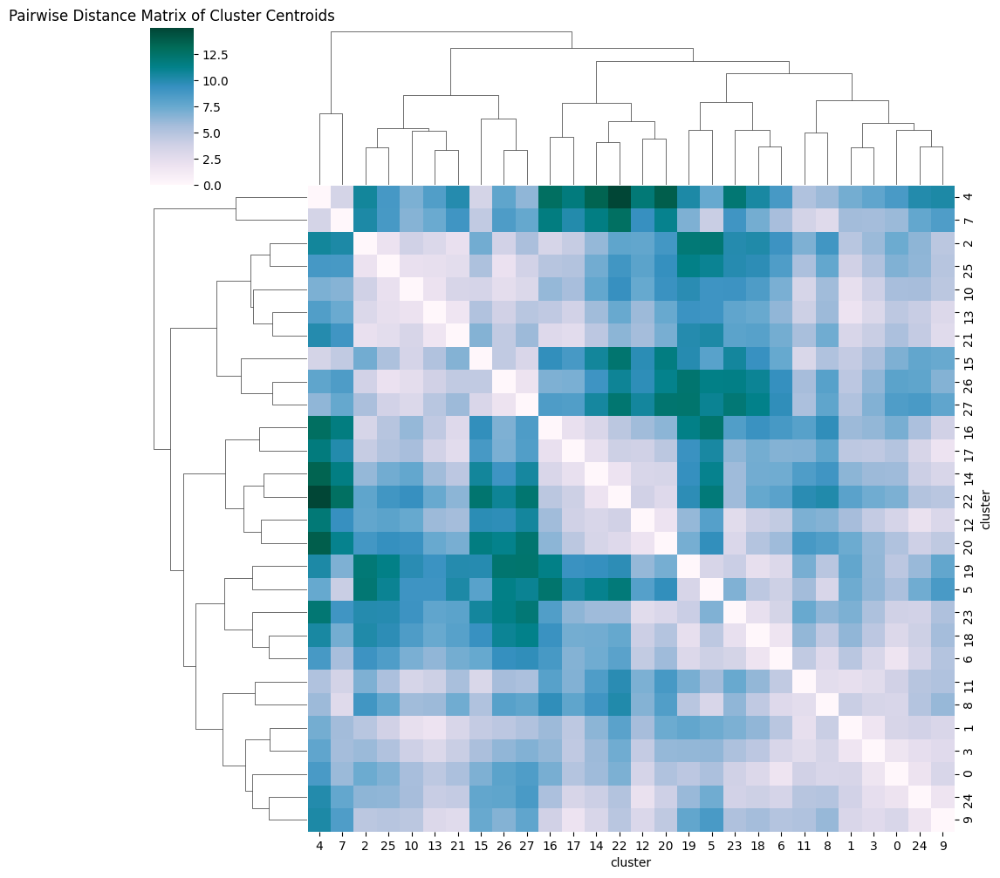

In [10]:
mde_degs_padj_8 = tf_compute_MDE(adata_degs_padj, label_points=False, spectral=True, leiden_neighbors=8)

In [6]:
_, _, _, _, embedding_df_degs_padj_8 = mde_degs_padj_8
embedding_df_degs_padj_8.head()

,x,y,gene_target,cluster
0,-5.303793,-1.379072,ADNP2,15
1,4.759978,-4.013325,AEBP1,16
2,-0.863183,-6.309071,AHR,2
3,-2.841603,-2.751663,AIRE,10
4,7.480436,-1.027967,AKAP8,22


In [7]:
perts_in_cluster_degs_padj_8 = gene_targets_per_cluster(embedding_df_degs_padj_8)
perts_in_cluster_degs_padj_8.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,ARX,CBX2,AHR,ATF6B,ASCL1,ATMIN,CDX1,BACH2,ARID3A,CEBPA,...,ESRRG,BSX,ATOH7,CTCFL,AKAP8,FOXD4L5,CREBL2,CRX,ASCL2,EBF2
1,ATOH1,CCDC17,ANKZF1,BHLHA9,ETV3L,CENPS,JRKL,CC2D1A,BARX1,CREB3L4,...,FOXJ2,DOT1L,DMBX1,DACH2,ARHGAP35,MITF,DMRTA2,GLIS3,CENPX,GMEB2
2,BHLHE41,CREB3L3,ARNT,BHLHA15,FLYWCH1,CHAMP1,PITX2,CEBPB,BHLHE40,ETV1,...,HDX,HES7,FAM200B,FOXE3,CXXC1,NFXL1,SMAD4,GTF2I,DLX4,GTF2IRD1
3,CREM,DMRT3,ARNT2,ERF,GTF3A,DMRTB1,POU4F3,CEBPD,CREB5,FOXS1,...,IRF9,JUNB,FOXN4,GATAD2A,KLF4,RORC,STAT6,TCF7L1,DMRT2,NFKB1
4,DMRTC2,ESR1,CAMTA2,FOSB,HMX2,DNMT1,RHOXF2,DLX2,ESRRA,GATA3,...,KLF15,MAFK,NEUROD2,GRHL2,KLF10,TBX18,ZNF75D,TIGD2,HSF2,SNAPC4


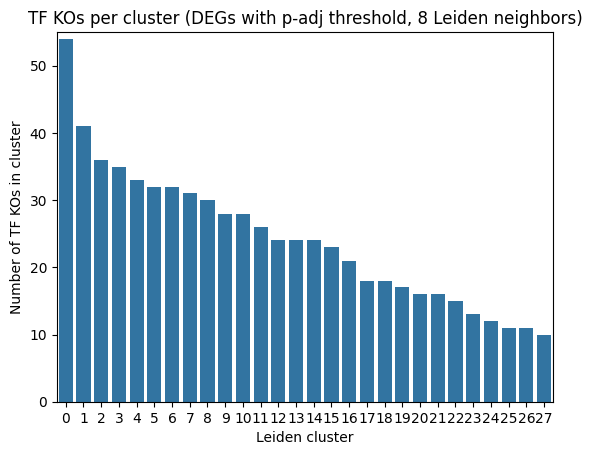

In [9]:
_ = plot_n_perts_per_cluster(perts_in_cluster_degs_padj_8, 
                             "TF KOs per cluster (DEGs with p-adj threshold, 8 Leiden neighbors)",
                             ymax=55)

In [11]:
perts_in_cluster_degs_padj_8.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_4265degs_padj_8nbrs.csv")

10 neighbors

In [9]:
# mde_5087_10 = tf_compute_MDE(adata_5087, label_points=False, spectral=True, leiden_neighbors=10)

In [99]:
# _, _, _, _, embedding_df_5087_10 = mde_5087_10
# perts_in_cluster_5087_10 = gene_targets_per_cluster(embedding_df_5087_10)
# _ = plot_n_perts_per_cluster(perts_in_cluster_5087_10, "TF KOs per cluster (5087-DEG dataset, 10 Leiden neighbors)")

### MDE on 2000 HVG dataset

In [7]:
adata_2000 = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_2000_hvgs.h5ad")

In [96]:
# mde_2000_8 = tf_compute_MDE(adata_2000, label_points=False, spectral=True, leiden_neighbors=8)

In [20]:
_, _, _, _, embedding_df_2000_8 = mde_2000_8
perts_in_cluster_2000_8 = gene_targets_per_cluster(embedding_df_2000_8)
perts_in_cluster_2000_8.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,AEBP1,ARID2,ATF6B,CREB5,ARX,CC2D1A,ARHGAP35,AKAP8,BAZ2A,ARNT,...,ATOH1,AIRE,ESX1,AKAP8L,ARID3A,ISL1,ESR1,BHLHA9,KLF4,CAMTA2
1,ATOH7,BCL6B,ESR2,DMRT2,ASCL5,CEBPA,ARNT2,BHLHE40,BHLHE22,CENPS,...,BSX,ARID3B,FOXQ1,CEBPB,CDX1,MEOX2,ETS2,FAM200B,PAX9,NCOA3
2,BACH2,BHLHE41,FOXE3,DMRTB1,BARHL1,CEBPE,BARX1,CBX2,FOSL1,CRX,...,KLF6,DR1,HEY1,FOXO1,NFE2L1,PCGF6,KDM2A,LHX9,TIGD7,PRDM8
3,CREB3L4,DMRT3,FOXJ1,ETV5,BHLHA15,DBX2,CTCFL,CEBPD,FOXD4L5,DLX4,...,LHX5,DRAP1,LEF1,GATAD2B,RFX8,RFX7,RELB,MEIS1,ZBTB26,SP140L
4,CREBL2,EPAS1,FOXS1,FOXK2,CREB3L3,DLX6,DLX2,CENPB,FOXN2,ELK1,...,NFX1,ESRRG,REST,GTF3A,SOX30,SHOX2,TET1,MYPOP,ZNF326,ZNF334


In [21]:
perts_in_cluster_2000_8.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv")

In [82]:
perts_in_cluster_2000_8 = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_8_nbrs.csv", header=0, index_col=0)

In [22]:
perts_in_cluster_2000_8.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,AEBP1,ARID2,ATF6B,CREB5,ARX,CC2D1A,ARHGAP35,AKAP8,BAZ2A,ARNT,...,ATOH1,AIRE,ESX1,AKAP8L,ARID3A,ISL1,ESR1,BHLHA9,KLF4,CAMTA2
1,ATOH7,BCL6B,ESR2,DMRT2,ASCL5,CEBPA,ARNT2,BHLHE40,BHLHE22,CENPS,...,BSX,ARID3B,FOXQ1,CEBPB,CDX1,MEOX2,ETS2,FAM200B,PAX9,NCOA3
2,BACH2,BHLHE41,FOXE3,DMRTB1,BARHL1,CEBPE,BARX1,CBX2,FOSL1,CRX,...,KLF6,DR1,HEY1,FOXO1,NFE2L1,PCGF6,KDM2A,LHX9,TIGD7,PRDM8
3,CREB3L4,DMRT3,FOXJ1,ETV5,BHLHA15,DBX2,CTCFL,CEBPD,FOXD4L5,DLX4,...,LHX5,DRAP1,LEF1,GATAD2B,RFX8,RFX7,RELB,MEIS1,ZBTB26,SP140L
4,CREBL2,EPAS1,FOXS1,FOXK2,CREB3L3,DLX6,DLX2,CENPB,FOXN2,ELK1,...,NFX1,ESRRG,REST,GTF3A,SOX30,SHOX2,TET1,MYPOP,ZNF326,ZNF334


In [24]:
n_perts_per_cluster_2000_8 = perts_in_cluster_2000_8.nunique().tolist()
print(n_perts_per_cluster_2000_8)

[49, 48, 46, 39, 38, 36, 35, 34, 33, 32, 31, 30, 28, 26, 23, 22, 18, 14, 14, 14, 13, 12, 12, 10, 10, 10]


In [97]:
# plot_n_perts_per_cluster(perts_in_cluster_2000_8, 
#                          title="TF KOs per cluster (2000-HVG dataset, 8 Leiden neighbors)", ymax=50)

10 Leiden neighbors

In [28]:
# mde_2000_10 = tf_compute_MDE(adata_2000, label_points=False, spectral=True, leiden_neighbors=10)

In [30]:
_, _, _, _, embedding_df_2000_10 = mde_2000_10
perts_in_cluster_2000_10 = gene_targets_per_cluster(embedding_df_2000_10)
perts_in_cluster_2000_10.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,ARID2,AEBP1,ATF6B,ASCL5,BCL6B,CREB5,ARNT,ARHGAP35,AHR,AKAP8,BAZ2A,CC2D1A,ADNP2,ASCL1,BHLHA9,DACH2,AIRE,ATMIN,CSRNP2,ARID3A
1,ARX,ATOH7,FOXE3,ASH1L,BHLHE41,DMRT2,ATOH1,ARNT2,AKAP8L,BHLHE40,BHLHE22,CEBPA,ANKZF1,FLYWCH1,ESR1,DEAF1,ARID3B,CHAMP1,DUXA,CDX1
2,BARHL1,BACH2,FOXJ1,BHLHA15,CAMTA2,DMRTB1,BSX,BARX1,ASCL3,CBX2,FOSL1,CEBPE,ASCL2,HMX2,ETS2,ETS1,CENPS,DNMT1,ERG,NFE2L1
3,CREB3L3,CREB3L4,FOXQ1,DMRTC2,DMRT3,ETV5,ELK1,CTCFL,CEBPB,CEBPD,FOXD4L5,DBX2,CCDC17,HOXD13,FAM200B,FOXH1,CRX,E2F4,ESRRB,NR1I3
4,EPAS1,CREBL2,HEY1,GMEB2,ERF,FOXK2,HES3,DLX2,EBF3,CENPB,FOXN2,DLX6,CENPX,KLF1,KDM2A,HEY2,DLX4,EBF2,HIVEP2,RFX8


In [98]:
# plot_n_perts_per_cluster(perts_in_cluster_2000_10, "TF KOs per cluster (2000-HVG dataset, 10 Leiden neighbors)")

In [31]:
perts_in_cluster_2000_10.to_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_2000_hvgs_10_nbrs.csv")

### MDE with union of DEGs with p-adj cutoff and HVGs as features

In [14]:
# adata_degs_hvgs = ad.read_h5ad("/home/ranwyl/data_tf_project/tf_kos_by_6145_degs_hvgs.h5ad")

In [15]:
# mde_degs_hvgs_8 = tf_compute_MDE(adata_degs_hvgs, label_points=False, spectral=True, leiden_neighbors=8)

In [17]:
# _, _, _, _, embedding_df_degs_hvgs_8 = mde_degs_hvgs_8
# perts_in_cluster_degs_hvgs_8 = gene_targets_per_cluster(embedding_df_degs_hvgs_8)
# perts_in_cluster_degs_hvgs_8.head()

In [16]:
# plot_n_perts_per_cluster(perts_in_cluster_degs_hvgs_8, 
#                          title="TF KOs per cluster (DEG-HVG union dataset, 8 Leiden neighbors)", ymax=50)

## MDE: variance of gene expression across TF KO cells

Read in data

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt") as f:
    degs_padj = {deg.strip() for deg in f.readlines()}
adata_degs = adata_tfs[:, adata_tfs.var.index.isin(degs_padj)].copy()
adata_degs

AnnData object with n_obs × n_vars = 31808 × 4265
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [3]:
def compute_single_tf_ko_mean_variance(adata, group_indices):
    """
    Given an AnnData object and the indices of cells corresponding to a TF KO,
    compute mean and variance of gene expression across all TF KO cells for each gene.
    Build a DataFrame with columns = TF KO, gene, mean, variance.
    """
    adata_tf_ko = adata[group_indices, :]
    # Compute mean and variance across cells corresponding to TF KO
    mean_vector = adata_tf_ko.X.mean(axis=0)
    variance_vector = np.var(adata_tf_ko.X, axis=0)
    # Make sure data type is correct
    if hasattr(mean_vector, 'A1'):
        mean_vector = mean_vector.A1
    if hasattr(variance_vector, 'A1'):
        variance_vector = variance_vector.A1
    # Build DataFrame for TF KO (with # rows = # genes)
    gene_list = adata.var.index.to_list()
    tf_ko = adata_tf_ko.obs["gene_target"].to_list()[0]
    tf_ko_list = [tf_ko]*len(gene_list)
    single_tf_ko_mean_var_dict = {"TF KO": tf_ko_list, "Gene": gene_list, 
                     "Mean": mean_vector, "Variance": variance_vector}
    single_tf_ko_mean_var_df = pd.DataFrame(single_tf_ko_mean_var_dict)
    return single_tf_ko_mean_var_df

def compute_mean_variance_df(adata):
    """
    Given an AnnData object, build a DataFrame where each row holds the mean and
    variance for all cells corresponding to a single TF KO and single gene. 
    """
    adata = adata.copy()
    ko_groups = adata.obs.groupby("gene_target").indices
    tf_ko_mean_var_df_list = [compute_single_tf_ko_mean_variance(adata, indices) 
                     for indices in ko_groups.values()]
    full_tf_ko_mean_var_df = pd.concat(tf_ko_mean_var_df_list)
    full_tf_ko_mean_var_df.sort_values(by="Variance", ascending=False,
                                       ignore_index=True, inplace=True)
    return full_tf_ko_mean_var_df

In [4]:
def plot_mean_variance_interactive(mean_variance_df, n_points):
    df_to_plot = mean_variance_df.head(n_points)
    fig = px.scatter(df_to_plot, x="Mean", y="Variance", hover_data=["TF KO", "Gene"])
    fig.update_xaxes(rangemode='tozero')
    fig.update_yaxes(rangemode='tozero')
    return fig

In [5]:
def plot_mean_variance_static(mean_variance_df, n_points, xrange=None, yrange=None, title=None, fig_size=None):
    df_to_plot = mean_variance_df.head(n_points)
    plt.subplots(figsize=fig_size) if fig_size else plt.subplots(figsize=(6,4))
    sns.scatterplot(data=df_to_plot, x="Mean", y="Variance", s=10)
    if xrange:
        plt.xlim(xrange[0], xrange[1])
    if yrange:
        plt.ylim(yrange[0], yrange[1])
    if title:
        plt.title(title)
    plt.show()

### Testing

In [4]:
degs_list = [_ for _ in degs_padj]
print(degs_list[:5])

['ETFB', 'LINC00471', 'ARID3A', 'HK1', 'DDB2']


In [3]:
test_tf_kos = ["POU5F1", "NANOG"]
adata_test = adata_degs[adata_degs.obs["gene_target"].isin(test_tf_kos), :].copy()
adata_test

AnnData object with n_obs × n_vars = 192 × 4265
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [4]:
adata_test.X[:10, :5]

array([[-0.54237914, -0.3104816 ,  0.9822529 , -0.43219012, -1.2641453 ],
       [-0.54237914, -0.3104816 ,  0.8673375 , -0.43219012, -1.2641453 ],
       [-0.54237914, -0.3104816 , -0.9174987 ,  2.9165912 , -1.2641453 ],
       [-0.54237914, -0.3104816 , -0.9174987 , -0.43219012,  1.7805105 ],
       [-0.54237914, -0.3104816 , -0.9174987 , -0.43219012, -1.2641453 ],
       [ 1.4496399 ,  2.8640022 , -0.9174987 , -0.43219012, -0.01734325],
       [-0.54237914, -0.3104816 , -0.9174987 , -0.43219012, -1.2641453 ],
       [-0.54237914, -0.3104816 ,  0.6057767 , -0.43219012,  0.1028875 ],
       [-0.54237914, -0.3104816 , -0.9174987 , -0.43219012,  0.15201333],
       [-0.54237914, -0.3104816 ,  2.6749501 , -0.43219012, -1.2641453 ]],
      dtype=float32)

In [10]:
first_10_kos = adata_test.obs["gene_target"].to_list()[:10]
print(first_10_kos)

['POU5F1', 'NANOG', 'NANOG', 'POU5F1', 'POU5F1', 'POU5F1', 'NANOG', 'NANOG', 'POU5F1', 'NANOG']


In [32]:
test_gene_list = adata_test.var.index.to_list()
print(test_gene_list[:5])
print(len(test_gene_list))

['NOC2L', 'ISG15', 'AURKAIP1', 'CCNL2', 'MRPL20']
4265


In [6]:
test_grouped = adata_test.obs.groupby("gene_target")

In [7]:
test_indices = test_grouped.indices
test_indices

{'NANOG': array([  1,   2,   6,   7,   9,  10,  12,  18,  24,  27,  28,  29,  30,
         32,  34,  37,  38,  42,  43,  44,  46,  48,  52,  55,  56,  57,
         61,  67,  68,  69,  71,  72,  73,  75,  78,  82,  86,  88,  89,
         90,  91,  92,  93,  94,  95,  97,  98,  99, 100, 103, 105, 106,
        107, 108, 109, 111, 114, 117, 121, 123, 124, 125, 132, 136, 137,
        143, 145, 148, 149, 151, 152, 154, 156, 157, 159, 161, 162, 164,
        167, 171, 172, 173, 174, 176, 178, 179, 184, 185, 187, 188, 189,
        190]),
 'POU5F1': array([  0,   3,   4,   5,   8,  11,  13,  14,  15,  16,  17,  19,  20,
         21,  22,  23,  25,  26,  31,  33,  35,  36,  39,  40,  41,  45,
         47,  49,  50,  51,  53,  54,  58,  59,  60,  62,  63,  64,  65,
         66,  70,  74,  76,  77,  79,  80,  81,  83,  84,  85,  87,  96,
        101, 102, 104, 110, 112, 113, 115, 116, 118, 119, 120, 122, 126,
        127, 128, 129, 130, 131, 133, 134, 135, 138, 139, 140, 141, 142,
        144, 146,

In [79]:
test_df = compute_mean_variance_df(adata_test)

In [80]:
test_df.head()

,TF KO,Gene,Mean,Variance
0,POU5F1,TBC1D9,5.078688,23.551092
1,POU5F1,HAPLN1,6.215173,23.529814
2,POU5F1,CDH6,3.542813,22.641380
3,POU5F1,ENSG00000257060,5.298708,22.193628
4,POU5F1,MAFB,4.317190,22.042564


In [102]:
plot_mean_variance_interactive(test_df, 50)

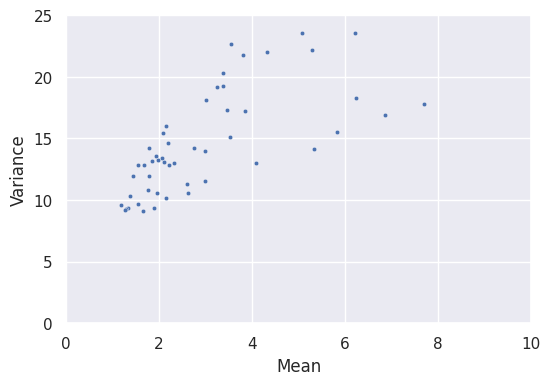

In [192]:
plot_mean_variance_static(test_df, 50, xrange=(0,10), yrange=(0,25))

### Compute + plot mean and variance

In [12]:
mean_variance_df_degs = compute_mean_variance_df(adata_degs)

In [30]:
mean_variance_df_degs.shape

(2780780, 4)

In [13]:
mean_variance_df_degs.head()

,TF KO,Gene,Mean,Variance
0,POU5F1B,SIX3,4.760942,25.095072
1,HOXD13,SIX3,4.428304,24.835049
2,ZNF396,SIX3,4.225697,24.568214
3,ZNF521,SIX3,3.982568,24.139648
4,POU5F1,TBC1D9,5.078688,23.551092


Tables

In [83]:
mean_variance_df_degs_100 = mean_variance_df_degs.head(100).copy()

In [86]:
mean_variance_df_degs_1000 = mean_variance_df_degs.head(1000).copy()

In [190]:
mean_variance_df_degs_1000["TF KO"].value_counts().head(10)

TF KO
POU5F1     113
PHF20       83
POU5F1B     66
POU3F2      51
HOXD13      32
ZNF396      31
ZNF521      31
DNMT1       30
NANOGP8     17
PRDM14      13
Name: count, dtype: int64

In [191]:
mean_variance_df_degs_1000["Gene"].value_counts().head(10)

Gene
GREB1L             35
CDH6               20
PRTG               17
ENSG00000289426    16
SIX3               16
ZIC1               15
PAMR1              15
DACH1              14
LINC02334          13
CDH9               13
Name: count, dtype: int64

Interactive plot

In [7]:
plot_mean_variance_interactive(mean_variance_df_degs, 1000)

Static plots

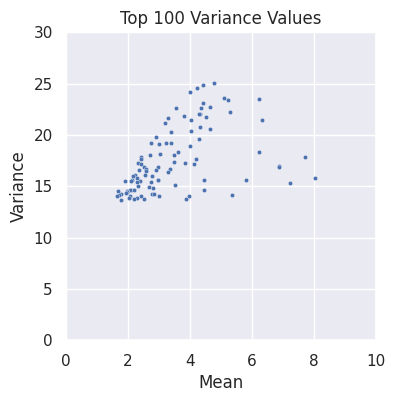

In [188]:
plot_mean_variance_static(mean_variance_df_degs, 100, xrange=(0,10), yrange=(0,30),
                          title="Top 100 Variance Values", fig_size=(4,4))

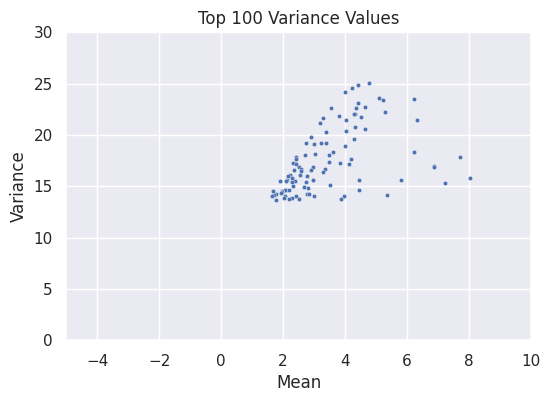

In [186]:
plot_mean_variance_static(mean_variance_df_degs, 100, xrange=(-5,10), yrange=(0,30),
                          title="Top 100 Variance Values")

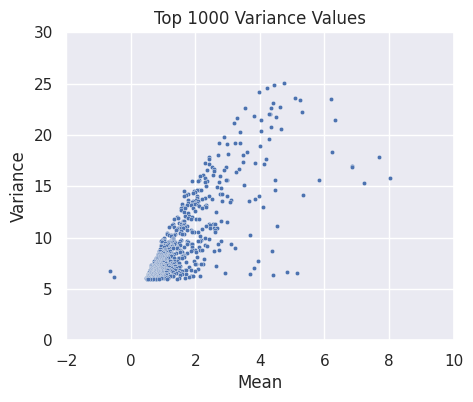

In [189]:
plot_mean_variance_static(mean_variance_df_degs, 1000, xrange=(-2,10), yrange=(0,30),
                          title="Top 1000 Variance Values", fig_size=(5,4))

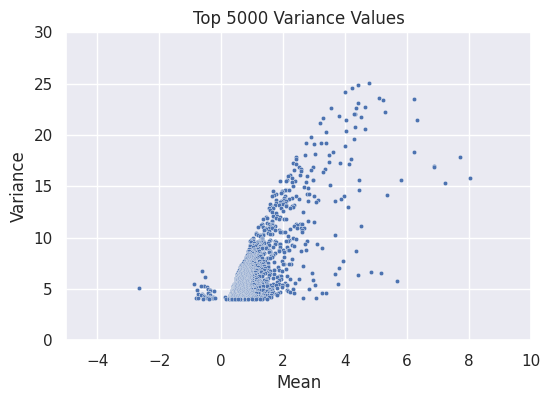

In [173]:
plot_mean_variance_static(mean_variance_df_degs, 5000, xrange=(-5,10), yrange=(0,30),
                          title="Top 5000 Variance Values")

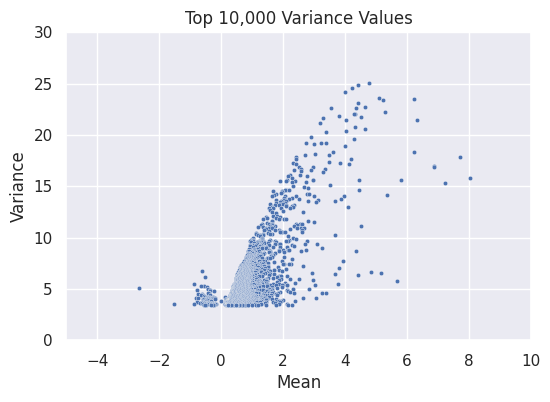

In [176]:
plot_mean_variance_static(mean_variance_df_degs, 10000, xrange=(-5,10), yrange=(0,30),
                          title="Top 10,000 Variance Values")

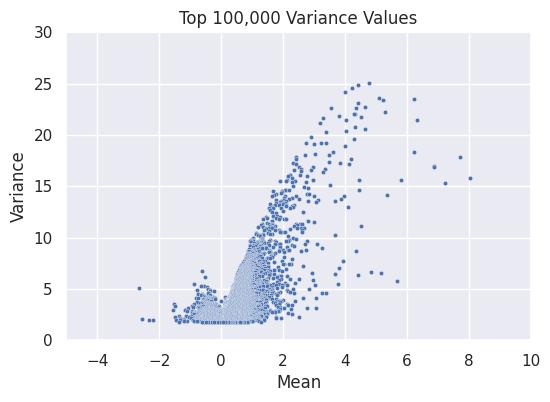

In [180]:
plot_mean_variance_static(mean_variance_df_degs, 100000, xrange=(-5,10), yrange=(0,30),
                          title="Top 100,000 Variance Values")

In [183]:
mean_variance_df_degs.head(100000).tail(10)

,TF KO,Gene,Mean,Variance
99990,IRF4,SETD6,0.209115,1.809081
99991,HOXA7,ZFHX4,0.062558,1.809077
99992,HOXD13,LRRC4C,1.292396,1.809069
99993,ETV5,CDC14A,0.273346,1.809062
99994,TBPL2,PROS1,0.150668,1.809061
99995,NANOGNB,ADAMTS6,0.247193,1.809057
99996,PBX1,LNC-LBCS,0.217151,1.809056
99997,FOXQ1,SP8,0.141651,1.809047
99998,ZBTB22,ENSG00000250993,0.135495,1.809047
99999,ZNF780A,CHD3,0.062155,1.809043


For top TF KOs, check for overlap between 1) genes with high variance and 2) known TF targets from DoRothEA and CollecTRI

In [33]:
def build_tf_target_dict():
    all_dicts = list()
    # CollecTRI
    collectri_df = dc.op.collectri(organism='human')
    collectri_dict = dict()
    for tf, gene in collectri_df.iloc[:,:2].itertuples(index=False, name=None):
        if tf not in collectri_dict:
            collectri_dict[tf] = set()
        collectri_dict[tf].add(gene)
    all_dicts.append(collectri_dict)
    
    # DoRothEA levels A and B
    dorothea_df = dc.op.dorothea(organism="human", levels=["A", "B"])
    dorothea_dict = dict()
    for tf, gene in dorothea_df.iloc[:,:2].itertuples(index=False, name=None):
        if tf not in dorothea_dict:
            dorothea_dict[tf] = set()
        dorothea_dict[tf].add(gene)
    all_dicts.append(dorothea_dict)
    
    tf_target_dict = dict()
    all_tfs = {tf for target_dict in all_dicts for tf in target_dict.keys()}
    for tf in all_tfs:
        genes = {g for target_dict in all_dicts if tf in target_dict for g in target_dict[tf]}
        tf_target_dict[tf] = genes
    return tf_target_dict

In [34]:
dorothea_collectri_dict = build_tf_target_dict()

In [35]:
print(dorothea_collectri_dict["POU5F1"])

{'PDGFRA', 'CDKN2A', 'CGB8', 'JADE1', 'MYOD1', 'MMP2', 'CRIPTO', 'NR0B1', 'MMP13', 'CCNF', 'TOR1AIP2', 'TERF1', 'CCND1', 'SOX2', 'WNT3', 'ZIC3', 'AFP', 'DDC', 'BIRC5', 'SPP1', 'ITGA6', 'DLX5', 'HES3', 'GATA6', 'SALL4', 'PAX6', 'HSPD1', 'SEMA6A', 'AKT1', 'IGF2-AS', 'BMP4', 'TBX18', 'TBXT', 'DNMT1', 'RLIM', 'GATA4', 'NES', 'JMJD1C', 'ESRG', 'HES6', 'HLX', 'USP44', 'AHR', 'DPPA4', 'MMP9', 'GADD45A', 'CDKN1A', 'CDX2', 'NANOG', 'MESP1', 'EED', 'PPP1CC', 'KDM3A', 'PRKN', 'BRCA1', 'TDGF1', 'FGF8', 'TET2', 'E2F3', 'LEFTY1', 'L1TD1', 'FOXA2', 'CXCR4', 'DKK1', 'SLC2A3', 'GJA1', 'UTF1', 'PHC1', 'FGF4', 'THY1', 'CNTF', 'hsa-miR-145', 'ACTG2', 'TUG1', 'KDM4C', 'SOX17', 'ZFP42', 'SRA1', 'ZSCAN10', 'EOMES', 'TYR', 'FBXO15', 'PPP1R8', 'SP5', 'ID2', 'TET1', 'CGA', 'POU5F1', 'SLC22A3', 'STK40', 'CCN2', 'TCL1A', 'LEFTY2', 'MEIS1', 'FOXA1', 'CDH1'}


In [15]:
mean_variance_df_degs_1000 = mean_variance_df_degs.head(1000).copy()
mean_variance_df_degs_1000.head()

,TF KO,Gene,Mean,Variance
0,POU5F1B,SIX3,4.760942,25.095072
1,HOXD13,SIX3,4.428304,24.835049
2,ZNF396,SIX3,4.225697,24.568214
3,ZNF521,SIX3,3.982568,24.139648
4,POU5F1,TBC1D9,5.078688,23.551092


In [16]:
top_tf_ko_df_1000 = mean_variance_df_degs_1000["TF KO"].value_counts().head(10)
top_tf_ko_df_1000

TF KO
POU5F1     113
PHF20       83
POU5F1B     66
POU3F2      51
HOXD13      32
ZNF396      31
ZNF521      31
DNMT1       30
NANOGP8     17
PRDM14      13
Name: count, dtype: int64

In [26]:
top_10_tf_kos_1000 = top_tf_ko_df_1000.index.to_list()
print(top_10_tf_kos_1000)

['POU5F1', 'PHF20', 'POU5F1B', 'POU3F2', 'HOXD13', 'ZNF396', 'ZNF521', 'DNMT1', 'NANOGP8', 'PRDM14']


In [36]:
def build_tf_ko_high_variance_gene_dict(mean_variance_df, n_tf_kos):
    # Get n_tf_kos TF KOs with greatest number of high variance genes
    tf_ko_value_counts = mean_variance_df["TF KO"].value_counts().head(n_tf_kos)
    top_tf_kos = tf_ko_value_counts.index.to_list()
    # Build dict of TF KOs and high variance genes
    high_var_gene_dict = dict()
    for tf_ko in top_tf_kos:
        high_var_genes = mean_variance_df[mean_variance_df["TF KO"] == tf_ko]["Gene"].to_list()
        high_var_gene_dict[tf_ko] = set(high_var_genes)
    return high_var_gene_dict

def print_high_variance_gene_targets(mean_variance_df, n_tf_kos, tf_target_dict=None):
    # Get known TF targets
    if tf_target_dict is not None:
        tf_target_dict = build_dorothea_collectri_dict()
    # Build dict of TF KOs and high variance genes
    high_var_gene_dict = build_tf_ko_high_variance_gene_dict(mean_variance_df, n_tf_kos)
    # For each TF KO, find intersection of high variance and target genes
    for tf_ko in high_var_gene_dict:
        if tf_ko not in tf_target_dict:
            print(f"TF KO {tf_ko} not found in DoRothEA or CollecTRI")
        else:
            high_var_targets = tf_target_dict[tf_ko] & high_var_gene_dict[tf_ko]
            if high_var_targets:
                print(f"TF KO {tf_ko} has {len(high_var_targets)} target genes with "
                    f"high variance: {', '.join(high_var_targets)}")
            else:
                print(f"TF KO {tf_ko} has 0 target genes with high variance")

In [37]:
print_high_variance_gene_targets(mean_variance_df_degs_1000, 10, dorothea_collectri_dict)

TF KO POU5F1 has 2 target genes with high variance: GADD45A, ID2
TF KO PHF20 has 0 target genes with high variance
TF KO POU5F1B not found in DoRothEA or CollecTRI
TF KO POU3F2 has 0 target genes with high variance
TF KO HOXD13 has 1 target genes with high variance: DACH1
TF KO ZNF396 not found in DoRothEA or CollecTRI
TF KO ZNF521 has 0 target genes with high variance
TF KO DNMT1 has 1 target genes with high variance: RUNX1
TF KO NANOGP8 has 0 target genes with high variance
TF KO PRDM14 has 1 target genes with high variance: WNT5B


Perform overrepresentation analysis (ORA) using list of top 100 genes to see which pathways are enriched

In [38]:
mean_variance_df_degs_1000["Gene"].value_counts().head(10)

Gene
GREB1L             35
CDH6               20
PRTG               17
ENSG00000289426    16
SIX3               16
ZIC1               15
PAMR1              15
DACH1              14
LINC02334          13
CDH9               13
Name: count, dtype: int64

In [ ]:
import gseapy as gp

In [43]:
top_100_genes_list = mean_variance_df_degs_1000["Gene"].value_counts().head(100).index.to_list()
background_genes_list = list(degs_padj)
print(f"Number of high-variance genes: {len(top_100_genes_list)}")
print(f"Number of background genes: {len(background_genes_list)}")

Number of high-variance genes: 100
Number of background genes: 4265


In [45]:
enr_top_100 = gp.enrichr(gene_list=top_100_genes_list, gene_sets='MSigDB_Hallmark_2020',
                         organism='human', background=background_genes_list, outdir=None)
ora_results_top_100 = enr_top_100.results

In [48]:
display(ora_results_top_100)

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Wnt-beta Catenin Signaling,0.041233,0.858060,0,0,7.062925,22.520168,WNT5B;FZD8
1,MSigDB_Hallmark_2020,Inflammatory Response,0.172014,0.858060,0,0,2.812925,4.951254,BTG2;ITGB8
2,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,0.194771,0.858060,0,0,2.046724,3.348300,CDH6;FBN2;FZD8
3,MSigDB_Hallmark_2020,heme Metabolism,0.258475,0.858060,0,0,2.104592,2.847418,KAT2B;BTG2
4,MSigDB_Hallmark_2020,Hedgehog Signaling,0.299864,0.858060,0,0,2.994949,3.607198,NRCAM
5,MSigDB_Hallmark_2020,Spermatogenesis,0.421389,0.858060,0,0,1.902204,1.643884,CLVS1
6,MSigDB_Hallmark_2020,KRAS Signaling Dn,0.510434,0.858060,0,0,1.440613,0.968803,BTG2
7,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,0.575862,0.858060,0,0,1.191919,0.657804,BTG2
8,MSigDB_Hallmark_2020,KRAS Signaling Up,0.585892,0.858060,0,0,1.158530,0.619374,SOX9
9,MSigDB_Hallmark_2020,Myogenesis,0.605251,0.858060,0,0,1.097023,0.550828,FST


# UMAP

In [2]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")

In [3]:
def pca(adata):
    adata = adata.copy()
    sc.pp.scale(adata)
    sc.pp.pca(adata)
    sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
    return adata

In [235]:
def build_cluster_by_tf_ko_df(adata, leiden_res_key: str):
    """
    Create DataFrame where rows are Leiden clusters, cols are TF KOs, 
    and entries are the number of cells corresponding to a given TF KO in a cluster.
    """
    df = adata.obs[[leiden_res_key, "gene_target"]]
    # Count occurrences of each perturbation in each cluster
    cluster_by_tf_ko_df = \
        df.groupby([leiden_res_key, "gene_target"]).size().unstack(fill_value=0)
    cluster_by_tf_ko_df.index.name = "leiden_cluster"
    return cluster_by_tf_ko_df

def build_tf_ko_by_cluster_df(adata, leiden_res_key: str):
    """
    Create DataFrame where rows are TF KOs, cols are Leiden clusters, 
    and entries are the number of cells corresponding to a given TF KO in a cluster.
    """
    df = adata.obs[[leiden_res_key, "gene_target"]]
    # Count occurrences of each perturbation in each cluster
    tf_ko_by_cluster_df = \
        df.groupby([leiden_res_key, "gene_target"]).size().unstack(fill_value=0)
    tf_ko_by_cluster_df.index.name = "leiden_cluster"
    tf_ko_by_cluster_df = tf_ko_by_cluster_df.T
    return tf_ko_by_cluster_df

In [285]:
def plot_n_tf_kos_per_umap_cluster(adata, leiden_res_key: str, title=None):
    """
    Plot number of unique TF KOs per UMAP Leiden cluster.
    leiden_res_key = string such as 'leiden_res_0.50'
    """
    df = adata.obs[[leiden_res_key, "gene_target"]]
    cluster_nums = [i for i in range(df[leiden_res_key].nunique())]
    n_tf_kos_per_cluster = \
        [df[df[leiden_res_key] == str(i)]['gene_target'].nunique() 
         for i in cluster_nums]
    ax = sns.barplot(x=cluster_nums, y=n_tf_kos_per_cluster)
    ax.set_xlabel("UMAP Leiden cluster", fontsize=14)
    ax.set_ylabel("Number of unique TF KOs in cluster", fontsize=14)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    ax.set_ylim(0, 750)
    if title:
        ax.set_title(title, fontsize=14)

def plot_n_cells_per_umap_cluster(adata, leiden_res_key: str, ymax=None, title=None):
    """
    Plot number of cells per UMAP Leiden cluster.
    leiden_res_key = string such as 'leiden_res_0.50'
    """
    plt.rcParams.update({"font.size": 12})
    df = adata.obs[[leiden_res_key, "gene_target"]]
    ax = sns.barplot(df[leiden_res_key].value_counts(), color="green")
    ax.set_xlabel("UMAP Leiden cluster", fontsize=14)
    ax.set_ylabel("Number of cells in cluster", fontsize=14)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    if ymax:
        ax.set_ylim(0, ymax)
    if title:
        ax.set_title(title, fontsize=14)

In [243]:
def cluster_specific_tf_kos(cluster_summary_df, frac_in_top_cluster=0.5):
    """
    Create DataFrame of the top cluster in which each TF KO is represented.
    """
    tf_ko_sums = cluster_summary_df.sum(axis=0)
    tf_ko_max_vals = cluster_summary_df.max(axis=0)
    frac_in_cluster = tf_ko_max_vals / tf_ko_sums
    selected_tf_kos = frac_in_cluster[frac_in_cluster >= frac_in_top_cluster].index
    top_cluster_per_tf_ko = cluster_summary_df[selected_tf_kos].idxmax(axis=0)
    cluster_specific_tf_ko_df = pd.DataFrame({
        'TF KO': selected_tf_kos,
        'Top Cluster': top_cluster_per_tf_ko,
        'Fraction in Top Cluster': 
        frac_in_cluster[selected_tf_kos].values}).set_index('TF KO')
    return cluster_specific_tf_ko_df

def print_cluster_tf_ko_summary(cluster_summary_df, frac_list=[0.5, 0.3, 0.25]):
    """
    Print summary of what percent of TF KO cells are in a single cluster for each TF KO.
    """
    print(f"{cluster_summary_df.shape[1]} total TF KOs")
    for frac in frac_list:
        cluster_specific_tf_ko_df = cluster_specific_tf_kos(cluster_summary_df, 
                                                            frac_in_top_cluster=frac)
        print(f"{cluster_specific_tf_ko_df.shape[0]} TF KOs have "
              f">= {frac*100:.0f}% of cells in a single cluster")

## HVGs as features

In [6]:
adata_hvgs = adata_tfs.copy()
sc.pp.highly_variable_genes(adata_hvgs, n_top_genes=2000, flavor='seurat_v3', layer='counts')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


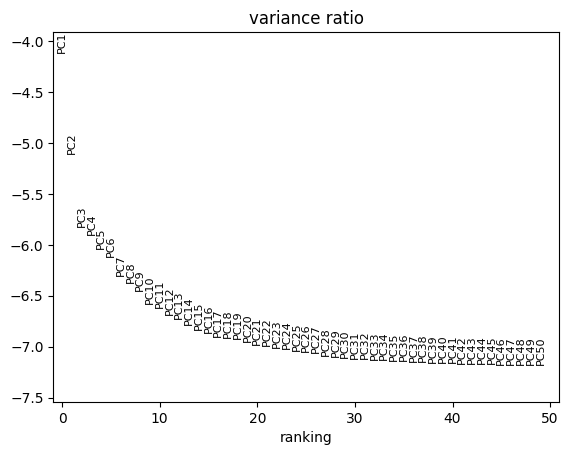

In [7]:
adata_hvgs = pca(adata_hvgs)

In [8]:
sc.pp.neighbors(adata_hvgs, n_pcs=30)

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 30
    computed neighbors (0:00:12)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)


In [9]:
sc.tl.umap(adata_hvgs)

computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


In [10]:
sc.tl.leiden(adata_hvgs, key_added=f"leiden_res_0.40", resolution=0.4)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:37)


In [46]:
for res in (0.25, 0.5, 0.75, 1):
    sc.tl.leiden(adata_hvgs, key_added=f"leiden_res_{res:4.2f}", resolution=res)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.25', the cluster labels (adata.obs, categorical) (0:00:23)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:31)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_res_0.75', the cluster labels (adata.obs, categorical) (0:00:32)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorical) (0:00:35)


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


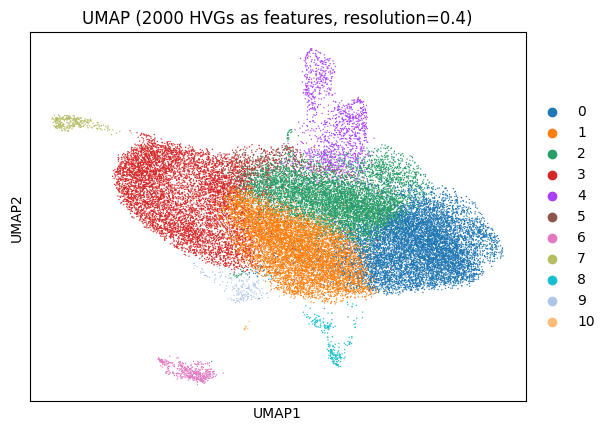

In [38]:
sc.pl.umap(adata_hvgs, color=["leiden_res_0.40"], title="UMAP (2000 HVGs as features, resolution=0.4)")

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


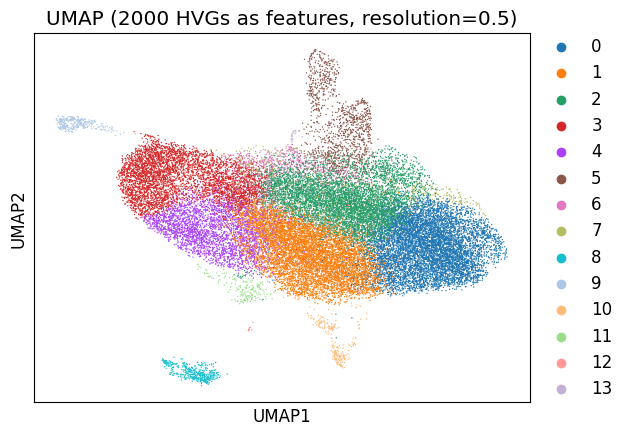

In [262]:
sc.pl.umap(adata_hvgs, color=["leiden_res_0.50"], title="UMAP (2000 HVGs as features, resolution=0.5)")

In [11]:
# sc.pl.umap(adata_hvgs, color=["leiden_res_0.75", "leiden_res_1.00"], wspace=0.3, size=2)

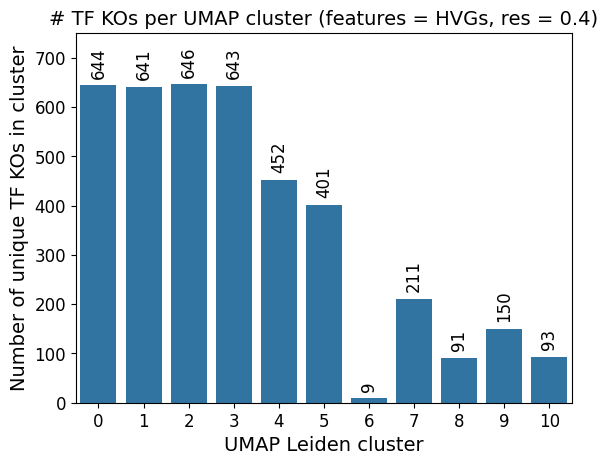

In [281]:
plot_n_tf_kos_per_umap_cluster(adata_hvgs, "leiden_res_0.40", ymax=750,
                               title="# TF KOs per UMAP cluster (features = HVGs, res = 0.4)")

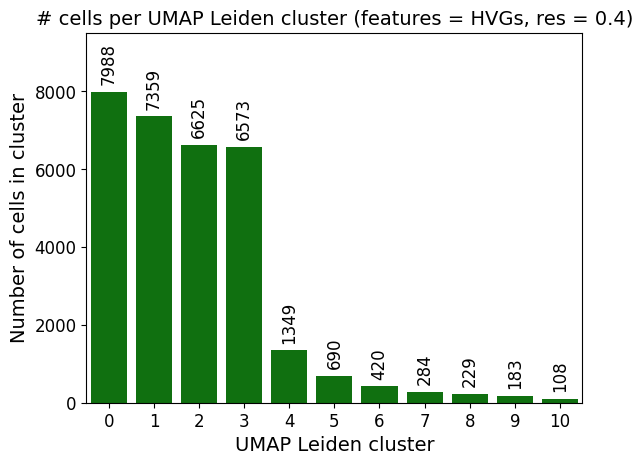

In [288]:
plot_n_cells_per_umap_cluster(adata_hvgs, "leiden_res_0.40", ymax=9500,
                              title="# cells per UMAP Leiden cluster (features = HVGs, res = 0.4)")

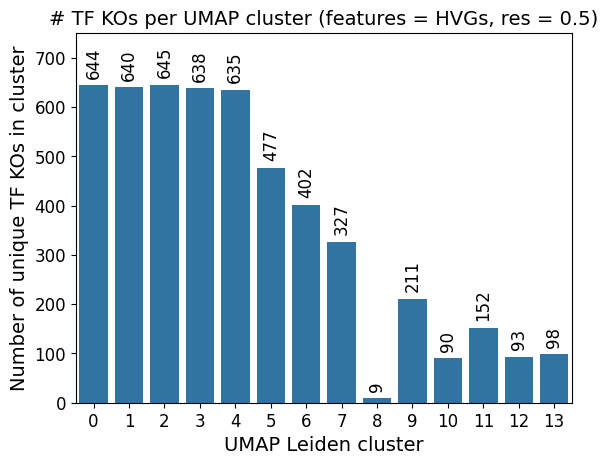

In [289]:
plot_n_tf_kos_per_umap_cluster(adata_hvgs, "leiden_res_0.50", 
                               "# TF KOs per UMAP cluster (features = HVGs, res = 0.5)")

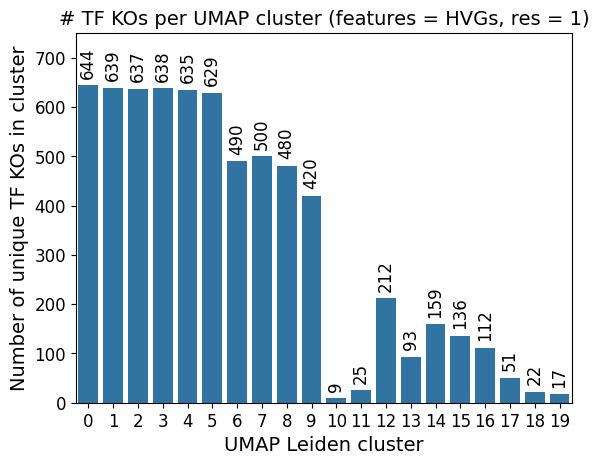

In [290]:
plot_n_tf_kos_per_umap_cluster(adata_hvgs, "leiden_res_1.00", 
                               "# TF KOs per UMAP cluster (features = HVGs, res = 1)")

In [244]:
print_cluster_tf_ko_summary(build_cluster_by_tf_ko_df(adata_hvgs, "leiden_res_0.40"))

652 total TF KOs
21 TF KOs have >= 50% of cells in a single cluster
413 TF KOs have >= 30% of cells in a single cluster
634 TF KOs have >= 25% of cells in a single cluster


In [267]:
umap_hvgs_df_res4 = build_tf_ko_by_cluster_df(adata_hvgs, "leiden_res_0.40")
umap_hvgs_df_res4.head()

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10
gene_target,,,,,,,,,,,
ADNP2,15,10,5,8,2,0,0,0,1,0,0
AEBP1,7,6,7,8,0,1,0,0,0,0,0
AHR,14,11,10,18,0,1,0,0,1,0,0
AIRE,17,21,11,10,0,1,0,0,0,1,0
AKAP8,3,9,13,8,1,2,0,2,0,1,2


In [268]:
umap_hvgs_df_res4[umap_hvgs_df_res4["6"] > 0]

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10
gene_target,,,,,,,,,,,
AKAP8L,0,0,0,0,1,0,44,0,0,0,0
CCDC17,0,0,0,0,0,0,35,0,0,0,0
FAM200B,7,14,16,19,0,5,3,0,1,0,0
MSANTD4,0,0,1,0,0,0,69,0,0,0,0
MTERF4,0,0,1,0,0,0,58,0,0,0,0
PIN1,0,0,0,0,0,0,77,0,0,0,0
RBCK1,0,0,1,0,0,0,69,0,0,0,0
SNAPC5,0,0,0,0,0,0,41,0,0,0,0
ZBED6,0,0,0,0,0,0,24,1,0,0,0


In [270]:
umap_hvgs_df_res5 = build_tf_ko_by_cluster_df(adata_hvgs, "leiden_res_0.50")
umap_hvgs_df_res5[umap_hvgs_df_res5["8"] > 0]

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10,11,12,13
gene_target,,,,,,,,,,,,,,
AKAP8L,0,0,0,0,0,1,0,0,44,0,0,0,0,0
CCDC17,0,0,0,0,0,0,0,0,35,0,0,0,0,0
FAM200B,8,12,14,13,8,0,5,0,3,0,1,0,0,1
MSANTD4,0,0,1,0,0,0,0,0,69,0,0,0,0,0
MTERF4,0,0,1,0,0,0,0,0,58,0,0,0,0,0
PIN1,0,0,0,0,0,0,0,0,77,0,0,0,0,0
RBCK1,0,0,0,0,1,0,0,0,69,0,0,0,0,0
SNAPC5,0,0,0,0,0,0,0,0,41,0,0,0,0,0
ZBED6,0,0,0,0,0,0,0,0,24,1,0,0,0,0


In [271]:
hvg_pkl_filename = "/home/ranwyl/results_tf_project/umap_clusters_hvgs_res0pt4.pkl"
umap_hvgs_df_res4.to_pickle(hvg_pkl_filename)

In [3]:
umap_hvgs_summary = pd.read_pickle("/home/ranwyl/results_tf_project/umap_clusters_hvgs_res0pt4.pkl")
umap_hvgs_summary.head()

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10
gene_target,,,,,,,,,,,
ADNP2,15,10,5,8,2,0,0,0,1,0,0
AEBP1,7,6,7,8,0,1,0,0,0,0,0
AHR,14,11,10,18,0,1,0,0,1,0,0
AIRE,17,21,11,10,0,1,0,0,0,1,0
AKAP8,3,9,13,8,1,2,0,2,0,1,2


In [7]:
umap_hvgs_summary["6"][umap_hvgs_summary["6"] > 0]

gene_target
AKAP8L     44
CCDC17     35
FAM200B     3
MSANTD4    69
MTERF4     58
PIN1       77
RBCK1      69
SNAPC5     41
ZBED6      24
Name: 6, dtype: int64

In [11]:
umap_hvgs_summary.loc["FAM200B"]

leiden_cluster
0      7
1     14
2     16
3     19
4      0
5      5
6      3
7      0
8      1
9      0
10     0
Name: FAM200B, dtype: int64

## DEGs with |LFC| > 0.25 as features

In [51]:
with open("/home/ranwyl/results_tf_project/degs_padj_final.txt") as f:
    degs_25 = {deg.strip() for deg in f.readlines()}
adata_degs_25 = adata_tfs[:, adata_tfs.var.index.isin(degs_25)].copy()
adata_degs_25

AnnData object with n_obs × n_vars = 31808 × 4265
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

computing PCA
    with n_comps=50
    finished (0:00:05)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


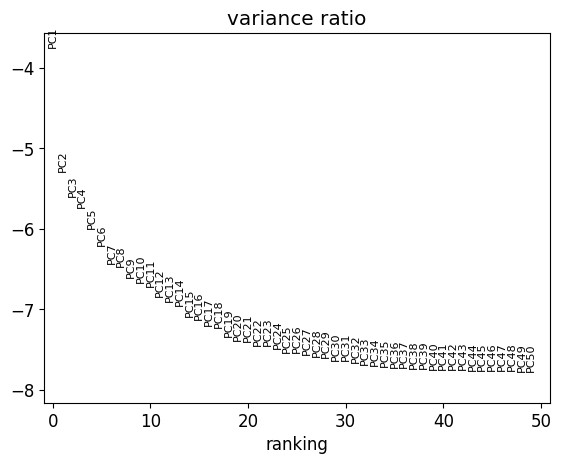

In [52]:
adata_degs_25 = pca(adata_degs_25)

We will use the first 30 PCs for KNN

In [53]:
sc.pp.neighbors(adata_degs_25, n_pcs=30)

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 30
    computed neighbors (0:00:01)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [54]:
sc.tl.umap(adata_degs_25)

computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [25]:
sc.tl.leiden(adata_degs_25, key_added=f"leiden_res_0.50", resolution=0.5)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:27)


In [55]:
for res in (0.4, 0.5, 0.75, 1):
    sc.tl.leiden(adata_degs_25, key_added=f"leiden_res_{res:4.2f}", resolution=res)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:34)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:26)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res_0.75', the cluster labels (adata.obs, categorical) (0:00:38)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorical) (0:00:23)


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


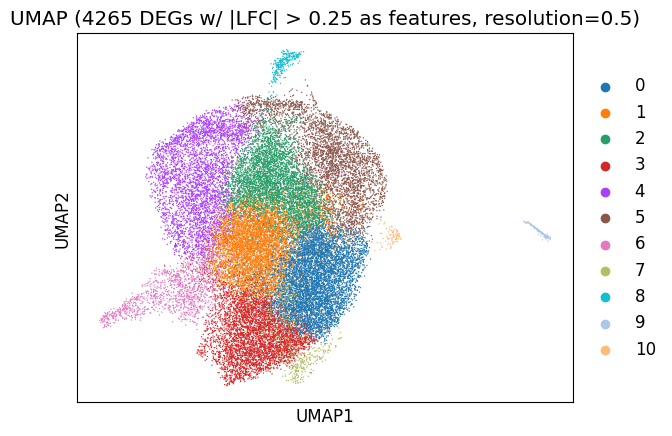

In [256]:
sc.pl.umap(adata_degs_25, color=["leiden_res_0.50"], 
           title="UMAP (4265 DEGs w/ |LFC| > 0.25 as features, resolution=0.5)")

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


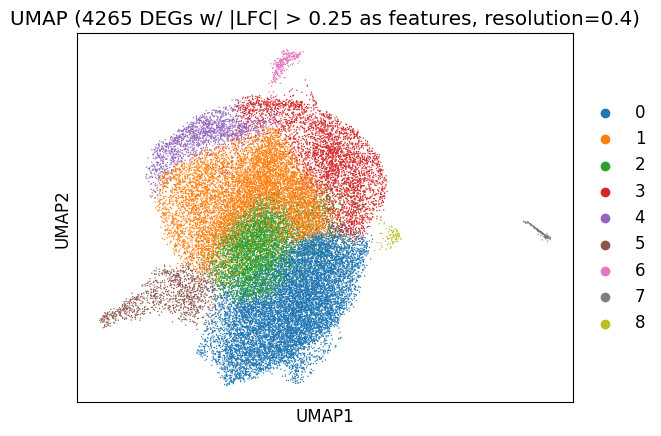

In [257]:
sc.pl.umap(adata_degs_25, color=["leiden_res_0.40"], 
           title="UMAP (4265 DEGs w/ |LFC| > 0.25 as features, resolution=0.4)")

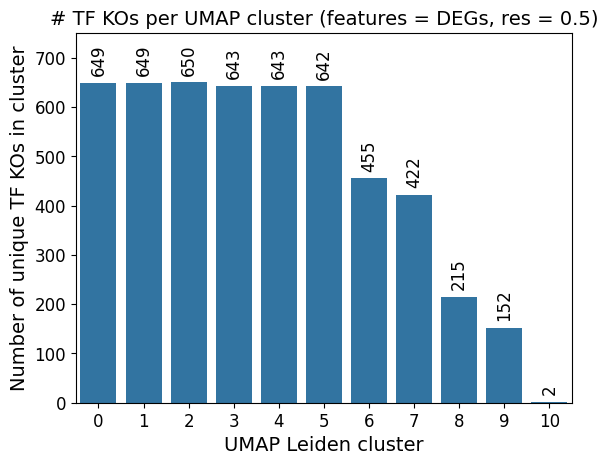

In [295]:
plot_n_tf_kos_per_umap_cluster(adata_degs_25, "leiden_res_0.50", 
                               "# TF KOs per UMAP cluster (features = DEGs, res = 0.5)")

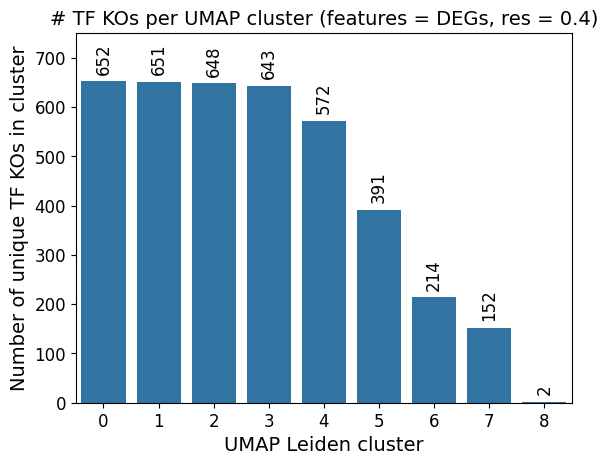

In [297]:
plot_n_tf_kos_per_umap_cluster(adata_degs_25, "leiden_res_0.40", 
                               "# TF KOs per UMAP cluster (features = DEGs, res = 0.4)")

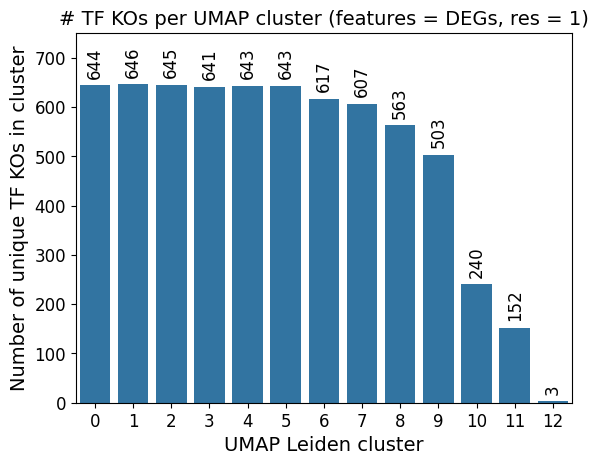

In [296]:
plot_n_tf_kos_per_umap_cluster(adata_degs_25, "leiden_res_1.00", 
                               "# TF KOs per UMAP cluster (features = DEGs, res = 1)")

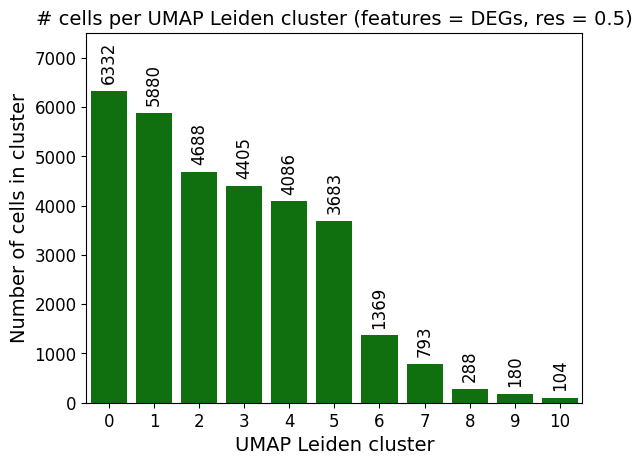

In [299]:
plot_n_cells_per_umap_cluster(adata_degs_25, "leiden_res_0.50", ymax=7500,
                              title="# cells per UMAP Leiden cluster (features = DEGs, res = 0.5)")

In [251]:
print_cluster_tf_ko_summary(build_cluster_by_tf_ko_df(adata_degs_25, "leiden_res_0.50"))

652 total TF KOs
11 TF KOs have >= 50% of cells in a single cluster
100 TF KOs have >= 30% of cells in a single cluster
322 TF KOs have >= 25% of cells in a single cluster


In [300]:
umap_degs_summary_display = build_tf_ko_by_cluster_df(adata_degs_25, "leiden_res_0.50")
umap_degs_summary_display.head()

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10
gene_target,,,,,,,,,,,
ADNP2,7,9,1,8,3,8,2,2,0,1,0
AEBP1,7,4,5,5,4,4,0,0,0,0,0
AHR,5,10,12,8,8,10,0,0,0,2,0
AIRE,14,10,9,9,11,8,0,0,0,0,0
AKAP8,11,9,6,0,6,6,1,0,2,0,0


In [255]:
umap_degs_summary_display[umap_degs_summary_display["10"] > 0]

leiden_cluster,0,1,2,3,4,5,6,7,8,9,10
gene_target,,,,,,,,,,,
DNMT1,6,7,11,3,5,13,1,1,0,0,103
SETDB1,9,28,13,2,19,15,0,0,1,0,1


In [301]:
deg_pkl_filename = "/home/ranwyl/results_tf_project/umap_clusters_degs_res0pt5.pkl"
umap_degs_summary_display.to_pickle(deg_pkl_filename)

In [273]:
adata_degs_25_summary = build_cluster_by_tf_ko_df(adata_degs_25, "leiden_res_0.50")

In [274]:
display(adata_degs_25_summary[["POU5F1", "NANOG"]])

gene_target,POU5F1,NANOG
leiden_cluster,,
0,3,5
1,0,3
2,3,5
3,0,5
4,1,7
5,1,5
6,92,61
7,0,1
8,0,0


In [275]:
print_cluster_tf_ko_summary(adata_degs_25_summary)

652 total TF KOs
11 TF KOs have >= 50% of cells in a single cluster
100 TF KOs have >= 30% of cells in a single cluster
322 TF KOs have >= 25% of cells in a single cluster


### Top 20 genes that contribute to first 2 PCs

Get the top 20 genes that contribute to the first 2 PCs. Genes that contribute positively have expression that increases across the PC axis, and genes that contribute negatively have expression that decreases.

In [11]:
def get_top_pca_genes(adata, top_n):
    genes = adata.var_names
    pc_loadings = adata.varm["PCs"]
    pc1_df = pd.DataFrame({'gene': genes, 'loading': pc_loadings[:, 0]})
    pc2_df = pd.DataFrame({'gene': genes, 'loading': pc_loadings[:, 1]})
    pc1_genes, pc2_genes = list(), list()
    for df, lst in zip((pc1_df, pc2_df), (pc1_genes, pc2_genes)):
        top_pos = df.nlargest(top_n, 'loading')['gene'].tolist()
        lst.append(top_pos)
        top_neg = df.nsmallest(top_n, 'loading')['gene'].tolist()
        lst.append(top_neg)
    return pc1_genes, pc2_genes

In [ ]:
pc1_top_genes, pc2_top_genes = get_top_pca_genes(adata_tfs_pca, 20)
pc1_pos_genes, pc1_neg_genes = pc1_top_genes[0], pc1_top_genes[1]
pc2_pos_genes, pc2_neg_genes = pc2_top_genes[0], pc2_top_genes[1]

In [ ]:
print(f"PC1 top 20 positively contributing genes: {pc1_pos_genes}")
print(f"PC1 top 20 negatively contributing genes: {pc1_neg_genes}")
print(f"PC2 top 20 positively contributing genes: {pc2_pos_genes}")
print(f"PC2 top 20 negatively contributing genes: {pc2_neg_genes}")

# ORA with known TF targets

-  Perform ORA with known TF targets for the TF KOs in each cluster
-  Use MDE generated with DEGs with p-adj < 0.0005 as features
-  We will first perform ORA using unsigned TF-target gene interactions (i.e. without information on if a TF is an activator or repressor of a gene), using gProfiler
-  After that, we will perform ORA using signed TF-target gene interactions 
    -  A TF KO is repression of a TF
    -  TF activates gene A --> TF KO leads to downregulation of gene A
    -  TF represses gene B --> TF KO leads to upregulation of gene B

In [ ]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")
de_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.285500,0.609960,0.619478,1.250948,0.210953,NaN,3.123957,-0.372431,0.747259,-0.721735,...,0.991264,-0.500306,0.616860,NaN,2.614595,-0.388893,0.816637,-0.736728,0.461288,0.937480
A2ML1,2.606644,0.100952,0.769812,0.197628,0.843336,NaN,1.550960,-0.509398,0.982173,-0.941713,...,1.138998,-0.221171,0.824959,NaN,2.470636,-0.309124,0.809974,-0.593803,0.552644,0.950115
A2ML1-AS1,8.352237,0.077233,0.476058,0.189240,0.849904,NaN,4.474111,-0.086464,0.641921,-0.181294,...,0.902441,-1.561968,0.118296,NaN,11.032901,0.407476,0.450120,1.039717,0.298471,0.916599
AAAS,7.516582,0.150004,0.507604,0.353576,0.723657,NaN,6.140222,-0.182040,0.560998,-0.406698,...,0.736081,0.548093,0.583628,NaN,6.569917,-0.557903,0.565281,-1.206801,0.227509,0.894912
AACS,13.652746,-0.607225,0.388791,-1.720363,0.085366,NaN,11.690521,0.006217,0.417831,0.015168,...,0.694740,0.985767,0.324247,NaN,9.678652,-0.525741,0.473100,-1.283670,0.199258,0.893908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,1.936280,0.399434,0.914994,0.746997,0.455065,NaN,0.847039,-1.352335,1.868836,-1.441918,...,1.138496,0.365796,0.714517,NaN,0.821237,-0.151334,1.085225,-0.333261,0.738938,0.977516
ZYG11B,18.247310,0.038689,0.334166,0.123994,0.901320,NaN,12.379707,-0.510436,0.415147,-1.377508,...,0.500329,-0.321024,0.748192,NaN,15.932747,-0.174367,0.371898,-0.518199,0.604320,0.954821
ZYX,22.916347,0.018090,0.297322,0.063336,0.949499,NaN,15.218808,0.244391,0.373242,0.721548,...,0.688878,0.004616,0.996317,NaN,16.135930,0.426690,0.376842,1.248127,0.211985,0.894912
ZZEF1,5.599009,-0.137232,0.571315,-0.304019,0.761113,NaN,6.190842,0.929886,0.618079,1.848373,...,0.814633,-0.411803,0.680484,NaN,5.908567,-0.227841,0.573063,-0.499849,0.617182,0.957720


## Generate background gene list

In [ ]:
adata_full = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_TF_KO_Batch_Normalized.h5ad")
adata_full.shape

(31808, 37567)

In [ ]:
bkgd_genes = adata_full.var.index.tolist()
bkgd_genes.sort()
print(len(bkgd_genes))

37567


In [ ]:
with open("/home/ranwyl/results_tf_project/ora_background_genes.txt", "w") as f:
    for g in bkgd_genes:
        f.write(f"{g}\n")

## Get TF-target gene interactions

In [ ]:
def print_dict(dct, n_to_print=3, sub_n_to_print=10):
    """
    Helper function to print first few items/subitems in a dictionary
    """
    lst = list(dct.keys())
    if n_to_print == -1:
        n_to_print = len(dct)
    for i in range(n_to_print):
        if len(dct[lst[i]]) < sub_n_to_print or sub_n_to_print == -1:
            print(f"{lst[i]}: {dct[lst[i]]}")
        else:
            if type(dct[lst[i]]) == list:
                print(f"{lst[i]}: {dct[lst[i]][:sub_n_to_print]}...")
            else:
                print(f"{lst[i]}: {list(dct[lst[i]])[:sub_n_to_print]}...")

def display_counts(all_tf_targets_dict, signed):
    """
    Display the number of TFs, gene targets, and TF-target interactions in
    a dict {TFs: target genes}.
    """
    n_interactions = 0
    all_genes = set()
    if signed:
        for k1 in all_tf_targets_dict.keys():
            for k2 in all_tf_targets_dict[k1].keys():
                n_interactions += len(all_tf_targets_dict[k1][k2])
                all_genes.update(all_tf_targets_dict[k1][k2])
    if not signed:
        for k in all_tf_targets_dict.keys():
            n_interactions += len(all_tf_targets_dict[k])
            all_genes.update(all_tf_targets_dict[k])
    print(f"Number of unique TFs: {len(all_tf_targets_dict)}")
    print(f"Number of unique gene targets: {len(all_genes)}")
    print(f"Number of unique TF-target interactions: {n_interactions}")

First, we will create an unsigned TF-target gene interaction dictionary that does not account for mode of regulation. We will use the following TF-target interaction gene sets:
-  ChEA_2022 Enrichr library: curated from published ChIP-chip, ChIP-seq, and other TF binding site profiling studies
-  ENCODE_TF_ChIP-seq_2015 Enrichr library: ChIP-seq experimental data
-  TF_Perturbations_Followed_by_Expression: TF perturbation (knockout or knockdown) experiment data from GEO
-  TF-LOF_Expression_from_GEO: TF loss-of-function experiment data from GEO 
-  TRRUST (external file): curated by text-mining
-  DoRothEA: signed gene regulatory network (we will use the two highest confidence levels A and B)
-  CollecTRI: signed gene regulatory network, aggregated resource

We will use gseapy to access the Enrichr gene set libraries, decoupler to access CollecTRI and DoRothEA, and an external file for TRRUST.

Number of interactions per library:
-  ChEA_2022: 917047
-  ENCODE 2015: 1651393
-  CollecTRI: 42990
-  TRRUST: 9396

In [ ]:
def build_tf_target_dict_unsigned(source_list, trrust_filepath=None, tfs_to_rename_dict=None):
    """
    Build dict {TF: list of target genes} using gseapy (for Enrichr libraries), 
    decoupler (for collecTRI and DoRothEA), and an external file for TRRUST.
    """
    all_dicts = list()
    if "ChEA_2022" in source_list:
        chea_lib = gp.get_library(name="ChEA_2022")
        chea_dict = {tf_label.split(" ")[0]: set(genes) for tf_label, genes in chea_lib.items() if "Human" in tf_label}
        all_dicts.append(chea_dict)
    if "ENCODE_TF_ChIP-seq_2015" in source_list:
        encode_lib = gp.get_library(name="ENCODE_TF_ChIP-seq_2015")
        encode_dict = {tf_label.split(" ")[0]: set(genes) for tf_label, genes in encode_lib.items() if "hg19" in tf_label}
        all_dicts.append(encode_dict)
    if "TRRUST" in source_list and trrust_filepath is not None:
        trrust_df = pd.read_csv(trrust_filepath, sep="\t", header=None)
        trrust_tf_list = trrust_df.iloc[:,0].unique().tolist()
        trrust_dict = {tf: set() for tf in trrust_tf_list}
        for tf, gene in trrust_df.iloc[:,:2].itertuples(index=False, name=None):
            trrust_dict[tf].add(gene)
        all_dicts.append(trrust_dict)
    if "CollecTRI" in source_list:
        collectri_df = dc.op.collectri(organism='human')
        collectri_dict = dict()
        for tf, gene in collectri_df.iloc[:,:2].itertuples(index=False, name=None):
            if tf not in collectri_dict:
                collectri_dict[tf] = set()
            collectri_dict[tf].add(gene)
        all_dicts.append(collectri_dict)
    if "DoRothEA" in source_list:
        dorothea_df = dc.op.dorothea(organism="human", levels=["A", "B"])
        dorothea_dict = dict()
        for tf, gene in dorothea_df.iloc[:,:2].itertuples(index=False, name=None):
            if tf not in dorothea_dict:
                dorothea_dict[tf] = set()
            dorothea_dict[tf].add(gene)
        all_dicts.append(dorothea_dict)  
    
    ko_lof_lib_list = list()
    if "TF_Perturbations_Followed_by_Expression" in source_list:
        pert_lib = gp.get_library(name="TF_Perturbations_Followed_by_Expression")
        ko_lof_lib_list.append(pert_lib)
    if "TF-LOF_Expression_from_GEO" in source_list:
        lof_lib = gp.get_library("TF-LOF_Expression_from_GEO")
        ko_lof_lib_list.append(lof_lib)
    if ko_lof_lib_list:
        ko_lof_dict = dict()
        for lib in ko_lof_lib_list:
            for tf_label, genes in lib.items():
                tf_label = tf_label.upper()
                if "HUMAN" in tf_label:
                    tf_label = tf_label.split(" ")
                    tf, _ = tf_label[0], tf_label[-1]
                    if tf not in ko_lof_dict:
                        ko_lof_dict[tf] = set()
                    ko_lof_dict[tf].update(set(genes))
        if tfs_to_rename_dict:
            for old_name, new_name in tfs_to_rename_dict.items():
                if new_name == "":
                    ko_lof_dict.pop(old_name)
                else:
                    ko_lof_dict[new_name] = ko_lof_dict.pop(old_name)
        all_dicts.append(ko_lof_dict)
    
    all_tf_targets_dict = dict()
    all_tfs = {tf for target_dict in all_dicts for tf in target_dict.keys()}
    for tf in all_tfs:
        genes = {g for target_dict in all_dicts if tf in target_dict for g in target_dict[tf]}
        all_tf_targets_dict[tf] = genes
    return all_tf_targets_dict

In [ ]:
trrust_filepath = "/home/ranwyl/data_tf_project/trrust_tf_targets.tsv"
tfs_to_rename = {"NCOA":"", "RENT1":"UPF1", "HIF2A":"EPAS1"}
full_tf_target_dict_unsigned = build_tf_target_dict_unsigned(
    ["ChEA_2022", "ENCODE_TF_ChIP-seq_2015", "TRRUST", "CollecTRI", "DoRothEA",
     "TF_Perturbations_Followed_by_Expression", "TF-LOF_Expression_from_GEO"],
    trrust_filepath=trrust_filepath, tfs_to_rename_dict=tfs_to_rename)

2025-06-08 20:25:00 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:25:27 | [INFO] 0073 gene_sets have been filtered out when max_size=2000 and min_size=0
2025-06-08 20:25:28 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:25:57 | [INFO] 0143 gene_sets have been filtered out when max_size=2000 and min_size=0
2025-06-08 20:26:01 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:26:10 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:26:27 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


In [ ]:
display_counts(full_tf_target_dict_unsigned, signed=False)

Number of unique TFs: 1445
Number of unique gene targets: 27531
Number of unique TF-target interactions: 704376


Now we will combine all signed interactions (general and KO/LOF) into one dictionary with two confidence levels, high and medium.
-  High: DoRothEA (A, B), TRRUST, TF_Perturbations_Followed_by_Expression, TF-LOF_Expression_from_GEO
-  Medium: CollecTRI, DoRothEA (A, B), TRRUST, TF_Perturbations_Followed_by_Expression, TF-LOF_Expression_from_GEO
**After examining the number of annotated TFs per cluster, we will use the medium-confidence interactions.**

In [ ]:
def build_tf_target_dict_signed(source_list, trrust_filepath=None, 
                                tfs_to_rename_dict=None, dorothea_levels=["A", "B"]):
    """
    Build dict {TF: {"UP": list of upreg genes, "DOWN": list of downreg genes}}
    using decoupler, gseapy, and external file for TRRUST.
    """
    all_dicts = list()

    if "CollecTRI" in source_list:
        collectri_df = dc.op.collectri(organism='human')
        collectri_dict = dict()
        for tf, gene, weight in collectri_df.iloc[:,:3].itertuples(index=False, name=None):
            if tf not in collectri_dict:
                collectri_dict[tf] = {"UP":set(), "DOWN":set()}
            if weight > 0: # TF is activator --> gene is downregulated
                collectri_dict[tf]["DOWN"].add(gene)
            else: # TF is repressor --> gene is upregulated
                collectri_dict[tf]["UP"].add(gene)
        all_dicts.append(collectri_dict)
    
    if "DoRothEA" in source_list:
        dorothea_df = dc.op.dorothea(organism='human', levels=dorothea_levels)
        dorothea_dict = dict()
        for tf, gene, weight in dorothea_df.iloc[:,:3].itertuples(index=False, name=None):
            if tf not in dorothea_dict:
                dorothea_dict[tf] = {"UP":set(), "DOWN":set()}
            if weight > 0:
                dorothea_dict[tf]["DOWN"].add(gene)
            else:
                dorothea_dict[tf]["UP"].add(gene)
        all_dicts.append(dorothea_dict)
    
    if "TRRUST" in source_list and trrust_filepath:
        trrust_df = pd.read_csv("/home/ranwyl/data_tf_project/trrust_tf_targets.tsv", sep="\t", header=None)
        trrust_dict = dict()
        for tf, gene, reg in trrust_df.iloc[:,:3].itertuples(index=False, name=None):
            if tf not in trrust_dict:
                trrust_dict[tf] = {"UP":set(), "DOWN":set()}
            if reg == "Activation":
                trrust_dict[tf]["DOWN"].add(gene)
            elif reg == "Repression":
                trrust_dict[tf]["UP"].add(gene)
        all_dicts.append(trrust_dict)

    # KO and LOF Enrichr libraries
    ko_lof_lib_list = list()
    if "TF_Perturbations_Followed_by_Expression" in source_list:
        pert_lib = gp.get_library(name="TF_Perturbations_Followed_by_Expression")
        ko_lof_lib_list.append(pert_lib)
    if "TF-LOF_Expression_from_GEO" in source_list:
        lof_lib = gp.get_library("TF-LOF_Expression_from_GEO")
        ko_lof_lib_list.append(lof_lib)
    if ko_lof_lib_list:
        ko_lof_dict = dict()
        for lib in ko_lof_lib_list:
            for tf_label, genes in lib.items():
                tf_label = tf_label.upper()
                if "HUMAN" in tf_label:
                    tf_label = tf_label.split(" ")
                    tf, reg = tf_label[0], tf_label[-1]
                    if tf not in ko_lof_dict:
                        ko_lof_dict[tf] = {"UP":set(), "DOWN":set()}
                    if reg == "UP":
                        ko_lof_dict[tf]["UP"].update(set(genes))
                    elif reg == "DOWN":
                        ko_lof_dict[tf]["DOWN"].update(set(genes))
        if tfs_to_rename_dict:
            for old_name, new_name in tfs_to_rename_dict.items():
                if new_name == "":
                    ko_lof_dict.pop(old_name)
                else:
                    ko_lof_dict[new_name] = ko_lof_dict.pop(old_name)
        all_dicts.append(ko_lof_dict)

    # Combine
    if len(all_dicts) == 1:
        return all_dicts[0]
    all_tfs = {tf for target_dict in all_dicts for tf in target_dict.keys()}
    all_tf_targets_dict = {tf: {"UP": set(), "DOWN": set()} for tf in all_tfs}
    for tf in all_tfs:
        genes_up = {g for target_dict in all_dicts if tf in target_dict for g in target_dict[tf]["UP"]}
        genes_down = {g for target_dict in all_dicts if tf in target_dict for g in target_dict[tf]["DOWN"]}
        all_tf_targets_dict[tf]["UP"].update(genes_up)
        all_tf_targets_dict[tf]["DOWN"].update(genes_down)
    return all_tf_targets_dict

In [ ]:
# trrust_filepath = "/home/ranwyl/data_tf_project/trrust_tf_targets.tsv"
# tfs_rename_dict = {"NCOA":"", "RENT1":"UPF1", "HIF2A":"EPAS1"} # old name : new name
# signed_tf_target_dict_hi_conf = build_tf_target_dict_signed(
#     ["DoRothEA", "TRRUST", "TF_Perturbations_Followed_by_Expression", "TF-LOF_Expression_from_GEO"], 
#     trrust_filepath=trrust_filepath,
#     tfs_to_rename_dict=tfs_rename_dict)

2025-05-28 01:04:28 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-28 01:04:34 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-28 01:04:41 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


In [ ]:
# display_counts(signed_tf_target_dict_hi_conf, signed=True)

Number of unique TFs: 886
Number of unique gene targets: 23389
Number of unique TF-target interactions: 269390


Based on the number of TFs per cluster represented in the dictionary, we will use the "medium confidence" dictionary below as our signed TF-target interaction dictionary.

In [ ]:
trrust_filepath = "/home/ranwyl/data_tf_project/trrust_tf_targets.tsv"
tfs_rename_dict = {"NCOA":"", "RENT1":"UPF1", "HIF2A":"EPAS1"} # old name : new name
signed_tf_target_dict_med_conf = build_tf_target_dict_signed(
    ["DoRothEA", "CollecTRI", "TRRUST", "TF_Perturbations_Followed_by_Expression", "TF-LOF_Expression_from_GEO"], 
    trrust_filepath=trrust_filepath,
    tfs_to_rename_dict=tfs_rename_dict)
# We will use this dict as the signed dict
signed_tf_target_dict = signed_tf_target_dict_med_conf

2025-06-08 20:36:30 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:36:57 | [INFO] Downloading and generating Enrichr library gene sets...
2025-06-08 20:37:17 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


In [ ]:
display_counts(signed_tf_target_dict, signed=True)

Number of unique TFs: 1356
Number of unique gene targets: 23639
Number of unique TF-target interactions: 303208


We will also create a dictionary with only the TF-target interactions from KO, KD, and LOF experiments.

In [ ]:
# tfs_rename_dict = {"NCOA":"", "RENT1":"UPF1", "HIF2A":"EPAS1"} # old name : new name
# signed_ko_lof_target_dict = build_tf_target_dict_signed(
#     ["TF_Perturbations_Followed_by_Expression", "TF-LOF_Expression_from_GEO"], 
#     tfs_to_rename_dict=tfs_rename_dict)
# display_counts(signed_ko_lof_target_dict, signed=True)

2025-05-28 01:17:16 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-28 01:17:40 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-28 01:18:00 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


Number of unique TFs: 232
Number of unique gene targets: 23204
Number of unique TF-target interactions: 252480


And one with only DoRothEA levels A and B:

In [ ]:
# signed_dorothea_dict = build_tf_target_dict_signed(["DoRothEA"])

And one with only DoRothEA A/B and KO/KD/LOF experiments.

In [ ]:
# tfs_rename_dict = {"NCOA":"", "RENT1":"UPF1", "HIF2A":"EPAS1"} # old name : new name
# signed_dor_pert_dict = build_tf_target_dict_signed(
#     ["DoRothEA", "TF_Perturbations_Followed_by_Expression", "TF-LOF_Expression_from_GEO"], 
#     tfs_to_rename_dict=tfs_rename_dict)

2025-05-30 01:30:44 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-30 01:31:01 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-30 01:31:21 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


### Code testing - accessing TF-target databases

**Build TF-target dict from Enrichr libraries**

In [ ]:
chea_lib = gp.get_library(name='ChEA_2022')

In [ ]:
print_dict(chea_lib, 1, 10)

BP1 19119308 ChIP-ChIP Hs578T Human: ['CBR1', 'OR1A1', 'HTR1B', 'LAPTM5', 'ADAM21', 'HPSE2', 'SELE', 'CSF2RB', 'VEGFA', 'PTPRE']...


In [ ]:
encode_lib = gp.get_library(name="ENCODE_TF_ChIP-seq_2015")

In [ ]:
print_dict(encode_lib, 2)

POLR2AphosphoS2 MEL cell line mm9: ['TEX30', 'HEXIM1', 'FNBP1', 'RC3H1', 'OPTC', 'LNPEP', 'LAS1L', 'B230219D22RIK', 'ORAI3', 'ORAI1']...
STAT1 HeLa-S3 hg19: ['SND1', 'CACNA2D1', 'DEK', 'LNPEP', 'HSPE1', 'RPL17-C18ORF32', 'LARP4', 'C20ORF24', 'COL1A2', 'ETHE1']...


In [ ]:
trrust_lib = gp.get_library(name="TRRUST_Transcription_Factors_2019")

In [ ]:
print_dict(trrust_lib, 3)

AATF mouse: ['BBC3', 'CDKN1A', 'TRP53', 'BAX', 'BAK1', 'TPT1']
ABL1 human: ['JUN', 'CCND2', 'BCL6', 'CDKN1A', 'CSF1', 'BCL2', 'PIM1', 'BAX', 'FOXO3', 'TP53']...
AHR human: ['PCNA', 'UGT1A1', 'RFC3', 'IL13', 'ARNT', 'FOS', 'BRCA1', 'IL1B', 'MT2A', 'IL6']...


In [ ]:
pert_lib_full = gp.get_library(name="TF_Perturbations_Followed_by_Expression")

2025-05-28 00:44:10 | [INFO] Downloading and generating Enrichr library gene sets...


In [ ]:
print_dict(pert_lib_full, 3)

NR3C1 KO MOUSE GSE23724 CREEDSID GENE 3014 UP: ['CKMT1A', 'RSAD2', 'GOLPH3L', 'MYL2', 'CD9', 'FAR2', 'KIF20A', 'EPHA4', 'AHCYL1', 'MTMR1']...
MEF2D KD MOUSE GSE47150 CREEDSID GENE 366 UP: ['RPL24', 'RPL23', 'PPP2R1A', 'EID1', 'CCT6A', 'MYL6', 'MT1A', 'FEZ1', 'RPL26', 'UQCRC2']...
KCNIP3 KO MOUSE GSE16874 CREEDSID GENE 1031 UP: ['ENTPD1', 'GBP6', 'STARD4', 'PRELID2', 'MX1', 'RSAD2', 'AFAP1', 'ACOD1', 'PSMB9', 'SRRM2']...


In [ ]:
# Non directional
pert_lib = pert_lib_full.copy()
pert_dict = dict()
for tf_label, genes in pert_lib.items():
    if "HUMAN" in tf_label:
        tf_label = tf_label.split(" ")
        tf, reg = tf_label[0], tf_label[-1]
        if tf not in pert_dict:
            pert_dict[tf] = set()
        pert_dict[tf].update(set(genes))

In [ ]:
print(len(pert_dict))

222


In [ ]:
# Directional
pert_lib = pert_lib_full.copy()
pert_dict = dict()
for tf_label, genes in pert_lib.items():
    if "HUMAN" in tf_label:
        tf_label = tf_label.split(" ")
        tf, reg = tf_label[0], tf_label[-1]
        pert_dict[tf] = {}
        if reg == "UP":
            if "UP" not in pert_dict[tf]:
                pert_dict[tf]["UP"] = list()
            pert_dict[tf]["UP"] += genes
        elif reg == "DOWN":
            if "DOWN" not in pert_dict[tf]:
                pert_dict[tf]["DOWN"] = list()
            pert_dict[tf]["DOWN"] += genes

In [ ]:
l_tf = list(pert_dict.keys())[0]
print(f"{l_tf}:")
for entry in pert_dict[l_tf]:
    print(f"{entry}: {pert_dict[l_tf][entry][:10]}")

RARA:
DOWN: ['ACSL3', 'HOMER2', 'IL1R1', 'STARD7', 'IL1R2', 'ACTN1', 'DEK', 'SYTL1', 'MYL6', 'MTHFD1']


In [ ]:
lof_lib_full = gp.get_library("TF-LOF_Expression_from_GEO")

2025-05-28 00:44:45 | [INFO] Downloading and generating Enrichr library gene sets...
2025-05-28 00:45:10 | [INFO] 0017 gene_sets have been filtered out when max_size=2000 and min_size=0


In [ ]:
print_dict(lof_lib_full, 3, 5)

cebpa 22442349 pbmc lof human gpl570 gds4407 up: ['HES7', 'OR1J2', 'EML2', 'POLR3C', 'LOC100508591']...
egr1 20019881 retina lof mouse gpl1261 gds3607 down: ['SLC35A2', 'GM3150', 'ACSL3', '6330571C24RIK', 'FOXH1']...
hnf1b 16297991 hek293 embryonic gof mouse gpl96 gds1499 down: ['HEXIM1', 'C21ORF33', 'GSR', 'RPS7', 'WDHD1']...


The TFs are lowercase because they represent TF KOs. We will need to convert them all to uppercase and query them against the Biothings MyGene database to make sure they are all real human TFs listed by gene name. For any TFs that don't pass the search, we will perform a manual search and remove or rename them.

In [ ]:
lof_lib = lof_lib_full.copy()
lof_dict = {tf_label.split(" ")[0].upper(): genes for tf_label, genes in lof_lib.items() if "human" in tf_label}
print(len(lof_dict))

37


In [ ]:
genes_to_check = [tf for tf in lof_dict.keys()]
print(genes_to_check)

['CEBPA', 'ZNF217', 'STAT3', 'YY2', 'FOXA1', 'DLX4', 'SOX4', 'MYC', 'ESR1', 'ZNF263', 'HNF4A', 'BCOR', 'CDX2', 'ZNF148', 'BMI1', 'AR', 'HSF1', 'TP63', 'CREB1', 'ERG', 'ELK1', 'LMO4', 'YY1', 'POU5F1', 'RARA', 'PCGF2', 'HIF1A', 'NOD2', 'MYB', 'CCND1', 'YAP1', 'SP1', 'RNF2', 'WT1', 'NCOA', 'RENT1', 'HIF2A']


In [ ]:
from biothings_client import get_client

In [ ]:
mg = get_client('gene')
results = mg.querymany(genes_to_check, scopes='symbol', species='human')

INFO:biothings.client:querying 1-37 ...
INFO:biothings.client:Finished.
INFO:biothings.client:Pass "returnall=True" to return complete lists of duplicate or missing query terms.


NCoA is a gene family and not a specific gene, so we will remove this entry. RENT1 is the protein encoded by UPF1, so we will rename it. HIF2A is an alias for EPAS1, so we will rename it.

In [ ]:
results = mg.querymany(["UPF1", "EPAS1"], scopes='symbol', species='human')

INFO:biothings.client:querying 1-2 ...
INFO:biothings.client:Finished.


In [ ]:
lof_dict.pop("NCOA")
lof_dict["UPF1"] = lof_dict.pop("RENT1")
lof_dict["EPAS1"] = lof_dict.pop("HIF2A")

In [ ]:
print(len(lof_dict))
print(lof_dict.keys())

36
dict_keys(['CEBPA', 'ZNF217', 'STAT3', 'YY2', 'FOXA1', 'DLX4', 'SOX4', 'MYC', 'ESR1', 'ZNF263', 'HNF4A', 'BCOR', 'CDX2', 'ZNF148', 'BMI1', 'AR', 'HSF1', 'TP63', 'CREB1', 'ERG', 'ELK1', 'LMO4', 'YY1', 'POU5F1', 'RARA', 'PCGF2', 'HIF1A', 'NOD2', 'MYB', 'CCND1', 'YAP1', 'SP1', 'RNF2', 'WT1', 'UPF1', 'EPAS1'])


In [ ]:
pert_lof_dict = dict()
for lib in [pert_lib, lof_lib]:
    for tf_label, genes in lib.items():
        tf_label = tf_label.upper()
        if "HUMAN" in tf_label:
            tf_label = tf_label.split(" ")
            tf, reg = tf_label[0], tf_label[-1]
            if tf not in pert_lof_dict:
                pert_lof_dict[tf] = dict()
            if reg == "UP":
                if "UP" not in pert_lof_dict[tf]:
                    pert_lof_dict[tf]["UP"] = list()
                pert_lof_dict[tf]["UP"] += genes
            elif reg == "DOWN":
                if "DOWN" not in pert_lof_dict[tf]:
                    pert_lof_dict[tf]["DOWN"] = list()
                pert_lof_dict[tf]["DOWN"] += genes
pert_lof_dict.pop("NCOA")
pert_lof_dict["UPF1"] = pert_lof_dict.pop("RENT1")
pert_lof_dict["EPAS1"] = pert_lof_dict.pop("HIF2A")

**Get TF-target interactions from collecTRI using decoupler**

In [ ]:
collectri_db_full = dc.op.collectri(organism='human')

In [ ]:
collectri_db_full.head(2)

,source,target,weight,resources,references,sign_decision
0,MYC,TERT,1.0,DoRothEA-A;ExTRI;HTRI;NTNU.Curated;Pavlidis202...,10022128;10491298;10606235;10637317;10723141;1...,PMID
1,SPI1,BGLAP,1.0,ExTRI,10022617,default activation


In [ ]:
collectri_db_full.shape

(42990, 6)

In [ ]:
collectri_db = collectri_db_full.iloc[:,:2]
collectri_db.head()

,source,target
0,MYC,TERT
1,SPI1,BGLAP
2,SMAD3,JUN
3,SMAD4,JUN
4,STAT5A,IL2


In [ ]:
collectri_dict = dict()
for tf, gene in collectri_db.itertuples(index=False, name=None):
    if tf not in collectri_dict:
        collectri_dict[tf] = list()
    collectri_dict[tf].append(gene)
print_dict(collectri_dict, 3)

MYC: ['TERT', 'EPO', 'ENO1', 'CDC25A', 'EMP1', 'CXCR4', 'CDKN1A', 'TP53', 'ACTB', 'BRCA1']...
SPI1: ['BGLAP', 'REG1A', 'UTRN', 'BTK', 'TIMP1', 'JUN', 'SP1', 'SP3', 'CYP11A1', 'CSF2RB']...
SMAD3: ['JUN', 'SERPINE1', 'SMAD7', 'CDKN1A', 'TGFB1', 'COL1A2', 'PDGFB', 'APOC3', 'SPP1', 'AR']...


In [ ]:
collectri_db_mode = collectri_db_full.iloc[:,:3]
collectri_db_mode.head()

,source,target,weight
0,MYC,TERT,1.0
1,SPI1,BGLAP,1.0
2,SMAD3,JUN,1.0
3,SMAD4,JUN,1.0
4,STAT5A,IL2,1.0


In [ ]:
collectri_dict_mode = dict()
for tf, gene, weight in collectri_db_mode.itertuples(index=False, name=None):
    if tf not in collectri_dict_mode:
        collectri_dict_mode[tf] = {"Activation":[], "Repression":[]}
    if weight == 1.0:
        collectri_dict_mode[tf]["Activation"].append(gene)
    else:
        collectri_dict_mode[tf]["Repression"].append(gene)
c_test_tf = list(collectri_dict_mode.keys())[0]
print(c_test_tf)
for entry in collectri_dict_mode[c_test_tf]:
    print(collectri_dict_mode[c_test_tf][entry][:10])

MYC
['TERT', 'EPO', 'ENO1', 'CDC25A', 'EMP1', 'CXCR4', 'TP53', 'ACTB', 'BRCA1', 'BIN1']
['CDKN1A', 'NDRG1', 'FN1', 'MYC', 'THBS1', 'GADD45A', 'CDKN1B', 'CAV1', 'CDKN2B', 'CEBPA']


**Access DoRothEA with decoupler**

In [ ]:
dorothea_db_full = dc.op.dorothea(organism='human', levels=['A', 'B'])
dorothea_db_full.head()

,source,target,weight,confidence
0,MYC,TERT,1.0,A
1,LEF1,CCL7,1.0,A
2,LEF1,BIRC5,1.0,A
3,KLF6,LTC4S,1.0,A
4,KLF5,NOTCH1,1.0,A


In [ ]:
dorothea_b_db_full = dc.op.dorothea(organism='human', levels=['B'])
dorothea_b_db_full.head()

,source,target,weight,confidence
0,FOS,RUNX1,0.5,B
1,PRDM14,MAP7D1,0.5,B
2,PRDM14,MAD1L1,0.5,B
3,PRDM14,MACF1,0.5,B
4,PRDM14,LRRK1,0.5,B


In [ ]:
dorothea_c_db_full = dc.op.dorothea(organism='human', levels=['C'])
dorothea_c_db_full.head()

,source,target,weight,confidence
0,PITX1,LHB,0.333333,C
1,POU2F2,APP,0.333333,C
2,POU2F2,ARHGAP25,0.333333,C
3,POU2F2,ARHGEF3,0.333333,C
4,POU2F2,BBX,0.333333,C


In [ ]:
print(dorothea_b_db_full['weight'].unique().tolist())

[0.5, -0.5]


**Get TF-target interactions from external TRRUST file**

In [ ]:
trrust_df_full = pd.read_csv("/home/ranwyl/data_tf_project/trrust_tf_targets.tsv", sep="\t", header=None)
trrust_df_full.columns = ["TF", "Gene", "Mode of Regulation", "Source"]

In [ ]:
trrust_df_full.shape

(9396, 4)

In [ ]:
trrust_df_full.head(3)

,TF,Gene,Mode of Regulation,Source
0,AATF,BAX,Repression,22909821
1,AATF,CDKN1A,Unknown,17157788
2,AATF,KLK3,Unknown,23146908


In [ ]:
trrust_tf_list = trrust_df_full["TF"].unique().tolist()
print(len(trrust_tf_list))
print(trrust_tf_list[:5])

795
['AATF', 'ABL1', 'AES', 'AHR', 'AIP']


In [ ]:
# No modes of regulation
trrust_tf_list = trrust_df_full["TF"].unique().tolist()
trrust_dict = {tf: set() for tf in trrust_tf_list}
for tf, gene in trrust_df_full.iloc[:,:2].itertuples(index=False, name=None):
    trrust_dict[tf].add(gene)

In [ ]:
print_dict(trrust_dict, 3)

AATF: {'KLK3', 'CDKN1A', 'BAX', 'MYC', 'TP53'}
ABL1: ['FOXO3', 'BCL2', 'PIM1', 'CDKN1A', 'BAX', 'JUN', 'BCL6', 'TP53', 'CCND2', 'CSF1']...
AES: {'LEF1', 'EPHA3', 'RND3'}


In [ ]:
# Modes of regulation
trrust_df_full = pd.read_csv("/home/ranwyl/data_tf_project/trrust_tf_targets.tsv", sep="\t", header=None)
trrust_dict_mode = dict()
for tf, gene, reg in trrust_df_full.iloc[:,:3].itertuples(index=False, name=None):
    if tf not in trrust_dict_mode:
        trrust_dict_mode[tf] = {"Activation":[], "Repression":[]}
    if reg == "Activation":
        trrust_dict_mode[tf]["Activation"].append(gene)
    elif reg == "Repression":
        trrust_dict_mode[tf]["Repression"].append(gene)
print_dict(trrust_dict_mode, 5)

AATF: {'Activation': ['MYC'], 'Repression': ['BAX']}
ABL1: {'Activation': ['BAX', 'CCND2', 'CDKN1A', 'CSF1', 'FOXO3', 'JUN', 'PIM1', 'TP53'], 'Repression': ['BCL2', 'BCL6', 'JUN']}
AES: {'Activation': ['LEF1', 'RND3'], 'Repression': []}
AHR: {'Activation': ['AHRR', 'CCNG2', 'CYP1A1', 'CYP1B1', 'IL6', 'PCNA', 'RFC3', 'UGT1A1'], 'Repression': ['CA9', 'CYP1A1']}
AIP: {'Activation': ['AHR'], 'Repression': ['GREB1', 'NFKB2', 'RSF1', 'TFF1']}


## Get TF target genes per cluster

Read in TF KOs per cluster in MDE generated using 4091 DEGs with p-val < 0.0005 as features and 8 k-nearest neighbors for Leiden clustering

In [ ]:
clusters_8nbrs = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_degs_pval_8_nbrs.csv", header=0, index_col=0)
clusters_8nbrs.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,ADNP2,ANKZF1,ASCL2,ARID2,BCL6B,BHLHA9,AKAP8,ARID3A,ATOH1,CENPB,...,DMRTB1,ARHGAP35,DMRT2,ASCL3,CREBL2,BHLHA15,HNF1A,ARNT2,DR1,BARX1
1,CDX1,ARX,CENPX,ASH1L,CSRNP2,ESRRB,AKAP8L,CEBPD,DMRT3,GTF2IRD1,...,ETS1,ATMIN,ESRRG,DMBX1,CTCFL,CXXC1,LTF,ASCL5,DRAP1,BAZ2A
2,CREM,CC2D1A,DLX2,CCDC17,EPAS1,ETV5,CBX2,CREB5,DUXA,HEY2,...,FOXH1,CHAMP1,ISL2,ETV1,ESX1,ETS2,RFX7,EBF3,ESR1,BHLHE40
3,FOSB,DEAF1,DMRTA2,CEBPA,ESRRA,GSC,ESR2,EHF,ERG,HIC1,...,GMEB2,DNMT1,KMT2B,FOXQ1,FOSL1,GRHL2,RUNX3,L3MBTL4,HIVEP2,BSX
4,FOSL2,EMX1,DMRTC2,CREB3L3,GATA1,IRF8,FOXM1,GLI1,LCOR,HNF1B,...,MTERF3,DOT1L,MEOX1,GATAD2B,FOXD4,KLF10,SOX1,PLSCR1,POU3F3,GATA2


Read in DE results where Ensembl IDs for genes have been converted to gene symbols wherever possible.

In [ ]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_gene_symbols.pkl")
de_results.head(3)

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.285500,0.609960,0.619478,1.250948,0.210953,NaN,3.123957,-0.372431,0.747259,-0.721735,...,0.991264,-0.500306,0.616860,NaN,2.614595,-0.388893,0.816637,-0.736728,0.461288,0.937480
A2ML1,2.606644,0.100952,0.769812,0.197628,0.843336,NaN,1.550960,-0.509398,0.982173,-0.941713,...,1.138998,-0.221171,0.824959,NaN,2.470636,-0.309124,0.809974,-0.593803,0.552644,0.950115
A2ML1-AS1,8.352237,0.077233,0.476058,0.189240,0.849904,NaN,4.474111,-0.086464,0.641921,-0.181294,...,0.902441,-1.561968,0.118296,NaN,11.032901,0.407476,0.450120,1.039717,0.298471,0.916599


Create DataFrame of TF targets per cluster

In [ ]:
def filter_degs_padj_lfc(de_df, lfc_threshold=0.5, padj_threshold=0.05, 
                         tf_ko_list=None, signed=False):
    """
    Filter DEGs in DGE results DF based on LFC and p-adj. Return set of DEGs
    if signed=False and sets of upregulated and downregulated DEGs if
    signed=True. 
    """
    if not tf_ko_list:
        perts = {col.split("_")[0] for col in de_df.columns}
    else:
        perts = tf_ko_list
    if signed:
        lfc_degs_up_set, lfc_degs_down_set = set(), set()
    else:
        lfc_degs_set = set()
    for pert in perts:
        l2fc_col = f"{pert}_log2FoldChange"
        padj_col = f"{pert}_padj"
        if signed:
            lfc_degs_up_set.update(
                de_df.loc[(de_df[l2fc_col] > lfc_threshold) 
                          & (de_df[padj_col] < padj_threshold)].index)
            lfc_degs_down_set.update(
                de_df.loc[(de_df[l2fc_col] < -1*lfc_threshold) 
                          & (de_df[padj_col] < padj_threshold)].index)
        else:
            lfc_degs_set.update(de_df.loc[(abs(de_df[l2fc_col]) > lfc_threshold) 
                                & (de_df[padj_col] < padj_threshold)].index)
    if signed:
        return lfc_degs_up_set, lfc_degs_down_set
    else:
        return lfc_degs_set

def find_cluster_degs(cluster_tf_ko_list, de_df, padj_thr=0.05, lfc_thr=0.5):
    """
    Given a list of TF KOs in a cluster, get the up/down DEGs.
    """
    cluster_degs_dict = dict()
    cluster_degs_up_set, cluster_degs_down_set = \
        filter_degs_padj_lfc(de_df, padj_threshold=padj_thr,
                            lfc_threshold=lfc_thr, 
                            tf_ko_list=cluster_tf_ko_list,
                            signed=True)
    cluster_degs_dict["UP"] = cluster_degs_up_set
    cluster_degs_dict["DOWN"] = cluster_degs_down_set
    return cluster_degs_dict

def find_degs_per_cluster(cluster_df, de_df, padj_thr=0.05, lfc_thr=0.5):
    """
    Given a DF of TF KOs per cluster, DF of DGE results, and DEG thresholds for
    p-adj and LFC, build dict {cluster: {"UP":upreg DEGs, "DOWN":downreg DEGs}} 
    and DF of # of total DEGs, upreg DEGs, and downreg DEGs per cluster.
    Dependencies: filter_degs_padj_lfc()
    """
    degs_per_cluster_dict = dict()
    n_up_degs_list, n_down_degs_list, n_total_degs_list = list(), list(), list()
    for i, cluster in enumerate(cluster_df.columns):
        cluster_tf_ko_list = \
            cluster_df[cluster][cluster_df[cluster].notna()].tolist()
        cluster_degs_dict = find_cluster_degs(
            cluster_tf_ko_list, de_df, padj_thr=padj_thr, lfc_thr=lfc_thr)
        degs_per_cluster_dict[int(i)] = cluster_degs_dict
        n_up_degs_list.append(len(cluster_degs_dict["UP"]))
        n_down_degs_list.append(len(cluster_degs_dict["DOWN"]))
        n_total_degs_list.append(len(cluster_degs_dict["UP"]) + 
                                 len(cluster_degs_dict["DOWN"]))
    n_degs_per_cluster_df = pd.DataFrame({"# UP DEGs": n_up_degs_list, 
                                          "# DOWN DEGs": n_down_degs_list,
                                          "# TOTAL DEGs": n_total_degs_list})
    n_degs_per_cluster_df.index.rename("Cluster", inplace=True)
    return degs_per_cluster_dict, n_degs_per_cluster_df

def find_tf_targets_per_cluster(cluster_df, de_df, all_tf_targets_dict, 
                                padj_thr=0.05, lfc_thr=0.5):
    """
    Given a DF of TF KOs per cluster and a dict of TF-target interactions, 
    build a dict {cluster number: target genes that are DEGs in cluster}
    (with UP/DOWN sub-dictionary for signed interactions) and a summary
    DF of # TF KOs, # target genes, # annotated TFs, and % cluster TFs
    with known targets for each cluster. The LFC of the DEG in DGE results
    must match the known direction of regulation.
    Dependencies: filter_degs_padj_lfc(), find_degs_per_cluster()
    """
    cluster_targets_dict = dict()
    # Create lists to be cols in summary DF
    n_tf_kos = [cluster_df[col].notna().sum() for col in cluster_df.columns]
    n_tfs_in_db = [0]*cluster_df.shape[1]

    # Check for mode of regulation
    signed = False
    key1 = next(iter(all_tf_targets_dict))
    val1 = all_tf_targets_dict[key1]
    if type(val1) == dict: # Mode
        signed = True
        if "UP" in val1 or "DOWN" in val1:
            signed_dict_keys = ["UP", "DOWN"]
        else:
            signed_dict_keys = ["Activation", "Repression"]

    # Loop through clusters
    for i, cluster in enumerate(cluster_df.columns):
        if signed:
            cluster_targets_dict[i] = {k: set() for k in signed_dict_keys}
        else:
            cluster_targets_dict[i] = set()
        # Get sets of up/down cluster DEGs
        cluster_tf_ko_list = cluster_df[cluster][cluster_df[cluster].notna()].tolist()
        degs_per_cluster_dict = find_cluster_degs(
            cluster_tf_ko_list, de_df, padj_thr=padj_thr, lfc_thr=lfc_thr)
        # Loop through non-NaN TF KOs
        for tf_ko in cluster_tf_ko_list:
            if tf_ko in all_tf_targets_dict:
                n_tfs_in_db[i] += 1
                if signed:
                    # Get direction of regulation (up/down)
                    for direction in all_tf_targets_dict[tf_ko].keys():
                        target_gene_set = set(all_tf_targets_dict[tf_ko][direction])
                        if direction == "Repression":
                            direction = "UP"
                            cluster_deg_set = degs_per_cluster_dict[direction]
                        elif direction == "Activation":
                            direction = "DOWN"
                            cluster_deg_set = degs_per_cluster_dict[direction]
                        else:
                            cluster_deg_set = degs_per_cluster_dict[direction]
                        # Get intersection of target genes and up or down cluster DEGs
                        intersec = target_gene_set.intersection(cluster_deg_set)
                        cluster_targets_dict[i][direction].update(intersec)
                else: # No mode of regulation
                    # Get intersection of target genes and all cluster DEGs
                    target_gene_set = set(all_tf_targets_dict[tf_ko])
                    cluster_deg_set = degs_per_cluster_dict["UP"].union(
                        degs_per_cluster_dict["DOWN"])
                    intersec = target_gene_set.intersection(cluster_deg_set)
                    cluster_targets_dict[i].update(intersec)
        if signed:
            # Separate genes into upreg only, downreg only, and both
            cluster_targets_dict[i]["BOTH"] = \
                cluster_targets_dict[i]["UP"].intersection(cluster_targets_dict[i]["DOWN"])
            cluster_targets_dict[i]["UP"] = \
                cluster_targets_dict[i]["UP"] - cluster_targets_dict[i]["BOTH"]
            cluster_targets_dict[i]["DOWN"] = \
                cluster_targets_dict[i]["DOWN"] - cluster_targets_dict[i]["BOTH"]
    
    # Create summary DF
    percent_tfs_in_db = [f"{100*n_tfs_in_db[i]/n_tf_kos[i]:.0f}%" 
                         for i in range(len(n_tf_kos))]
    if not signed: # Unsigned
        n_cluster_genes = [len(cluster_targets_dict[k]) 
                           for k in sorted(cluster_targets_dict.keys())]
        summary_df = pd.DataFrame({
            "# TF KOs": n_tf_kos, 
            "# target genes": n_cluster_genes,
            "# cluster TFs w/ known targets": n_tfs_in_db,
            "% cluster TFs w/ known targets": percent_tfs_in_db})
    
    else: # Signed
        n_up_only = [len(cluster_targets_dict[i]["UP"]) 
                     for i in range(len(cluster_targets_dict))]
        n_down_only = [len(cluster_targets_dict[i]["DOWN"]) 
                       for i in range(len(cluster_targets_dict))]
        n_both = [len(cluster_targets_dict[i]["BOTH"]) 
                  for i in range(len(cluster_targets_dict))]
        summary_df = pd.DataFrame({
            "# TF KOs": n_tf_kos, 
            "# genes UP only": n_up_only,
            "# genes DOWN only": n_down_only,
            "# genes BOTH": n_both,
            "# cluster TFs w/ known targets": n_tfs_in_db,
            "% cluster TFs w/ known targets": percent_tfs_in_db})
    summary_df.index.name = "Cluster"

    return cluster_targets_dict, summary_df

Get TF target genes per cluster using unsigned TF-target dict.

In [ ]:
# |LFC| > 0.5, p-adj < 0.05
unsigned_targets8_lfc0pt5, unsigned_summary8_lfc0pt5 = \
    find_tf_targets_per_cluster(clusters_8nbrs, de_results, full_tf_target_dict_unsigned)
unsigned_summary8_lfc0pt5.head()

,# TF KOs,# target genes,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,
0,41,177,25,61%
1,41,315,21,51%
2,38,279,22,58%
3,35,313,21,60%
4,33,125,23,70%


In [ ]:
# |LFC| > 0.585, p-adj < 0.05
unsigned_targets8_lfc0pt585, unsigned_summary8_lfc0pt585 = \
    find_tf_targets_per_cluster(clusters_8nbrs, de_results, 
                                full_tf_target_dict_unsigned, lfc_thr=0.585)
unsigned_summary8_lfc0pt585.head()
# This threshold was a little too strict, one cluster with < 10 genes

,# TF KOs,# target genes,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,
0,41,137,25,61%
1,41,241,21,51%
2,38,201,22,58%
3,35,230,21,60%
4,33,94,23,70%


In [ ]:
# |LFC| > 0.25, p-adj < 0.05
# Using this threshold for signed genes
unsigned_targets8_lfc0pt25, unsigned_summary8_lfc0pt25 = \
    find_tf_targets_per_cluster(clusters_8nbrs, de_results, 
                                full_tf_target_dict_unsigned, lfc_thr=0.25)
unsigned_summary8_lfc0pt25.head()

,# TF KOs,# target genes,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,
0,41,321,25,61%
1,41,473,21,51%
2,38,460,22,58%
3,35,534,21,60%
4,33,276,23,70%


Get DEGs per cluster using unsigned TF-target dict.

In [ ]:
# |LFC| > 0.5, p-adj < 0.05
_, unsigned_n_degs_padj0pt05 = find_degs_per_cluster(clusters_8nbrs, de_results)
unsigned_n_degs_padj0pt05.head()

,# UP DEGs,# DOWN DEGs,# TOTAL DEGs
Cluster,,,
0,136,197,333
1,195,247,442
2,192,223,415
3,220,246,466
4,176,177,353


Get TF target genes per cluster using signed high-confidence TF-target dict.

In [ ]:
# signed_hi_conf_targets8, signed_hi_conf_summary8 = \
#     find_tf_targets_per_cluster(clusters_8nbrs, signed_tf_target_dict_hi_conf)
# signed_hi_conf_summary8.head()

Get TF target genes per cluster using signed TF-target dict (previously called "medium confidence")

In [ ]:
# |LFC| > 0.5, p-adj < 0.05
signed_targets8_lfc0pt5, signed_summary8_lfc0pt5 = \
    find_tf_targets_per_cluster(clusters_8nbrs, de_results, signed_tf_target_dict)
signed_summary8_lfc0pt5.head()

,# TF KOs,# genes UP only,# genes DOWN only,# genes BOTH,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,,,
0,41,17,42,0,24,59%
1,41,52,152,0,21,51%
2,38,33,145,0,22,58%
3,35,44,121,1,21,60%
4,33,14,18,0,23,70%


In [ ]:
# |LFC| > 0.25, p-adj < 0.05
signed_targets8_lfc0pt25, signed_summary8_lfc0pt25 = \
    find_tf_targets_per_cluster(clusters_8nbrs, de_results, signed_tf_target_dict, lfc_thr=0.25)
signed_summary8_lfc0pt25.head(29)

,# TF KOs,# genes UP only,# genes DOWN only,# genes BOTH,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,,,
0,41,22,119,3,24,59%
1,41,60,267,1,21,51%
2,38,48,291,2,22,58%
3,35,59,276,1,21,60%
4,33,23,50,0,23,70%
5,31,17,47,0,20,65%
6,30,10,179,1,17,57%
7,27,11,106,0,15,56%
8,26,40,249,1,15,58%


In [ ]:
print_dict(signed_targets8_lfc0pt25)

0: {'UP': {'MT-CO3', 'CALD1', 'LINGO2', 'KIF5B', 'HUWE1', 'TRIO', 'TNRC6A', 'APP', 'IGF1R', 'MT-ND4', 'RERE', 'NBEA', 'ITPR2', 'GRIA4', 'FNDC3B', 'BPTF', 'LPP', 'RBM25', 'UTRN', 'MYO10', 'PRKG1', 'USP9X', 'KIF1B', 'NAV2', 'MT-ND6'}, 'DOWN': {'TPT1', 'TERF1', 'RPL37A', 'RCN2', 'DEK', 'RPL29', 'RPS15A', 'RPL32', 'RPS4X', 'RPS11', 'PTMA', 'MT-ND5', 'RPL18A', 'LDHA', 'SRSF3', 'NME2', 'RPL8', 'RPLP1', 'RPL30', 'HNRNPC', 'HACD3', 'DPYSL2', 'CALR', 'HINT1', 'IMPDH2', 'RPS23', 'MT-CO2', 'TOMM20', 'MT-ND3', 'RPL7', 'CALM2', 'RPS24', 'RPL27', 'PDIA6', 'PPIB', 'EIF1', 'PCBP1', 'MT-ND4', 'UCHL1', 'RPL34', 'ATP6V1G1', 'RPL11', 'RPL13A', 'MLEC', 'RPL41', 'RPL5', 'RPS3A', 'SLC25A6', 'RPL26', 'RPSA', 'RPL39', 'GSTP1', 'HSPD1', 'PSMA4', 'ACTB', 'RPS3', 'CD24', 'DYNLL1', 'RPS5', 'RAN', 'MT-CO1', 'TUBA1B', 'PPIA', 'RPLP0', 'PPP1CC', 'EEF2', 'GPX4', 'HSP90AB1', 'CCT4', 'PTMS', 'CD9', 'MYL6', 'MT-ATP8', 'SUMO2', 'HMGN2', 'NACA', 'EIF4A1', 'CD63', 'CFL1', 'ACTG1', 'RPL7A', 'RACK1', 'RPS14', 'MT-ND2', 'GAPDH

In [ ]:
def save_signed_cluster_target_gene_df(cluster_targets_dict):
    cluster_genes_df_dict = dict()
    # Get longest DF column length for padding
    max_col_len = max([len(cluster_targets_dict[k][direc]) 
                       for k in cluster_targets_dict.keys() 
                       for direc in ("UP", "DOWN")])
    for cl_num in cluster_targets_dict:
        up_col_name = "CL" + str(cl_num) + " UP"
        down_col_name = "CL" + str(cl_num) + " DOWN"
        up_col = sorted(list(cluster_targets_dict[cl_num]["UP"]))
        down_col = sorted(list(cluster_targets_dict[cl_num]["DOWN"]))
        # Pad to max length
        up_col += [""]*(max_col_len - len(up_col))
        down_col += [""]*(max_col_len - len(down_col))
        # Add to DF dict
        cluster_genes_df_dict[up_col_name] = up_col
        cluster_genes_df_dict[down_col_name] = down_col
    cluster_genes_df = pd.DataFrame(cluster_genes_df_dict)
    return cluster_genes_df

In [ ]:
up_down_genes_df_signed_targets8_lfc0pt25 = \
    save_signed_cluster_target_gene_df(signed_targets8_lfc0pt25)

In [ ]:
up_down_genes_df_signed_targets8_lfc0pt25.head()

,CL0 UP,CL0 DOWN,CL1 UP,CL1 DOWN,CL2 UP,CL2 DOWN,CL3 UP,CL3 DOWN,CL4 UP,CL4 DOWN,...,CL24 UP,CL24 DOWN,CL25 UP,CL25 DOWN,CL26 UP,CL26 DOWN,CL27 UP,CL27 DOWN,CL28 UP,CL28 DOWN
0,APP,ACTB,ADGRL2,ACTB,ACACA,ABRACL,ADGRL2,ACTB,ANO6,ATP5MC1,...,ACTN4,APOE,CALD1,ACTG1,BPTF,ACTB,CALD1,ATP5MC3,PCDH11Y,CLDN6
1,BPTF,ACTG1,ANO6,ACTG1,ACTN1,ACTB,AFF4,ACTG1,AURKA,ATP5MC3,...,AEBP2,APRT,VCL,ATF4,DST,ATP5F1B,DST,ATP5MG,SEMA6A,EEF1A1
2,CALD1,ATP6V1G1,APLP2,ANP32B,ANKS1B,ACTG1,ANK3,APOE,CALU,ATP5MG,...,CADM2,BEX3,,ATP5F1A,GNB1,CFL1,FNBP1L,ATRX,TAGLN,EEF1G
3,FNDC3B,CALM2,APP,ANP32E,BNC2,ALYREF,ARL6IP1,APRT,CANX,ATP5PF,...,DLGAP5,CD63,,ATP5F1E,MT-ATP8,EEF1A1,FOXN3,BANF1,,EIF4A1
4,GRIA4,CALR,ARHGEF10,ANXA2,CALD1,AMD1,ATP11A,ASH1L,DST,CD24,...,MYH9,CFL1,,ATP5ME,MT-ND1,EIF1,GPC6,CKS2,,HMGA1


In [ ]:
up_down_genes_df_signed_targets8_lfc0pt25.to_excel("/home/ranwyl/results_tf_project/up_down_genes_8nbrs_lfc0pt25.xlsx")

Get TF target genes per cluster using only signed KO/LOF experiment TF-target dict.

In [ ]:
# signed_ko_lof_targets8, signed_ko_lof_summary8 = \
# find_tf_targets_per_cluster(clusters_8nbrs, signed_ko_lof_target_dict)
# signed_ko_lof_summary8.head()

Get TF target genes per cluster using only DoRothEA dict.

In [ ]:
# signed_dor_targets8, signed_dor_summary8 = find_tf_targets_per_cluster(clusters_8nbrs, signed_dorothea_dict)
# signed_dor_summary8.head()

Get TF target genes per cluster using DoRothEA and pert dict

In [ ]:
# signed_dor_pert_targets8, signed_dor_pert_summary8 = find_tf_targets_per_cluster(clusters_8nbrs, signed_dor_pert_dict)
# signed_dor_pert_summary8.head()

### Plot number of annotated TFs per cluster

In [ ]:
def plot_n_cluster_tfs_in_db(cluster_df, title, xlabel, color2):
    categories = cluster_df.index.tolist()
    vals1 = cluster_df["# TF KOs"].tolist()
    vals2 = cluster_df["# cluster TFs w/ known targets"].tolist()

    # Labels
    n_total_tfs = cluster_df['# TF KOs'].sum()
    n_known_tfs = cluster_df['# cluster TFs w/ known targets'].sum()
    label1 = f"# TF KOs in cluster (total: {n_total_tfs})"
    label2 = f"# cluster TFs w/ known targets (total: {n_known_tfs})"
    percent_total = round(100*n_known_tfs/n_total_tfs)
    # Percent of cluster TFs with known targets
    box = Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0)
    percent_cl = cluster_df["% cluster TFs w/ known targets"].tolist()
    percent_cl = [int(p[:-1]) for p in percent_cl]
    avg_tf = round(np.mean(np.array(percent_cl)))
    #median_tf = round(np.median(np.array(percent_cl)))
    label3 = f"Total % of TFs w/ known targets: {percent_total}%\nMean per-cluster % of TFs w/ known targets: {avg_tf}%"

    # Bar width and x locations
    w, x = 0.4, np.arange(len(categories))

    fig, ax = plt.subplots(figsize=(10,4))
    bar1 = ax.bar(x-w/2, vals1, width=w, edgecolor='black', linewidth=1, facecolor="slategrey")
    bar2 = ax.bar(x+w/2, vals2, width=w, edgecolor='black', linewidth=1, facecolor=color2)

    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Number of TFs', fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_title(title, fontsize=16)
    ax.legend([bar1, bar2, box], (label1, label2, label3), loc='best', fontsize=12)
    plt.show()

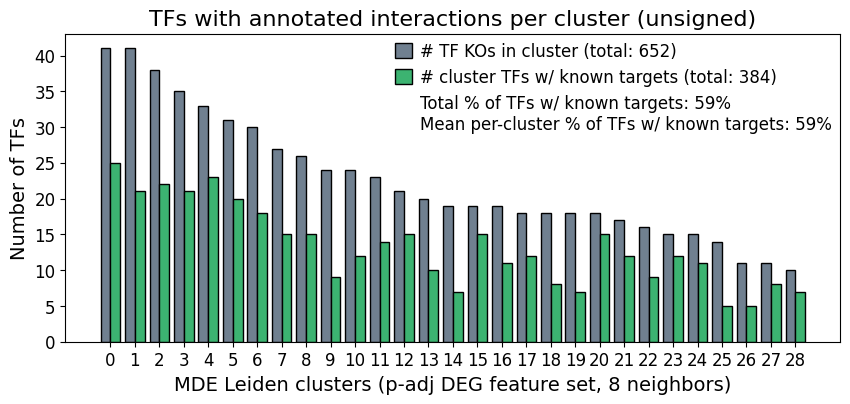

In [ ]:
plot_n_cluster_tfs_in_db(unsigned_summary8_padj0pt05, 
                         "TFs with annotated interactions per cluster (unsigned)",
                         xlabel="MDE Leiden clusters (p-adj DEG feature set, 8 neighbors)",
                         color2="mediumseagreen")

In [ ]:
# plot_n_cluster_tfs_in_db(signed_hi_conf_summary8, 
#                          "TFs with annotated interactions per cluster (signed, high confidence)",
#                          xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)",
#                          color2="tab:purple")

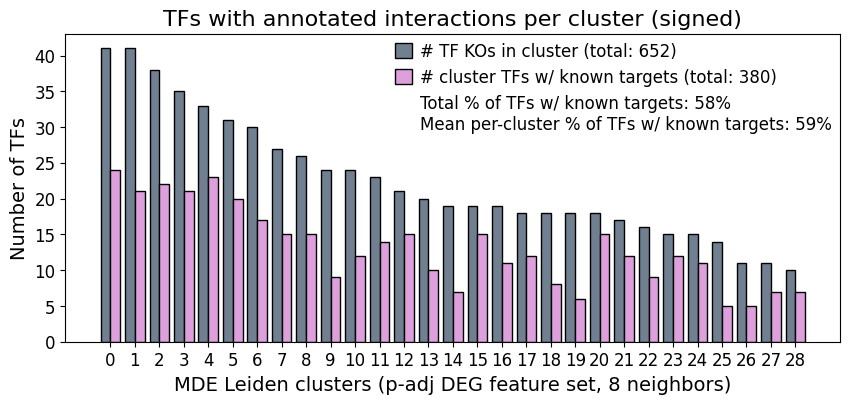

In [ ]:
plot_n_cluster_tfs_in_db(signed_summary8_padj0pt05, 
                         "TFs with annotated interactions per cluster (signed)",
                         xlabel="MDE Leiden clusters (p-adj DEG feature set, 8 neighbors)",
                         color2="plum")

In [ ]:
# plot_n_cluster_tfs_in_db(signed_ko_lof_summary8, 
#                          "TFs with annotated interactions per cluster (signed, KO/LOF only)",
#                          xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)",
#                          color2="orange")

In [ ]:
# plot_n_cluster_tfs_in_db(signed_dor_summary8, 
#                          "TFs with annotated interactions per cluster (signed, DoRothEA A/B)",
#                          xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)",
#                          color2="tab:purple")

In [ ]:
# plot_n_cluster_tfs_in_db(signed_dor_pert_summary8, 
#                          "TFs with annotated interactions per cluster (signed, DoRothEA A/B and KO/KD/LOF expts)",
#                          xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)",
#                          color2="orange")

### Plot number of target genes per cluster (unsigned)

In [ ]:
def plot_n_cluster_genes_in_db_unsigned(cluster_df, title, xlabel, color, ymax=None):
    xvals = cluster_df.index.tolist()
    yvals = cluster_df["# target genes"].tolist()
    fig, ax = plt.subplots(figsize=(10,4))
    ax = sns.barplot(x=xvals, y=yvals, facecolor=color, edgecolor='black', linewidth=1)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Number of target genes', fontsize=14)
    if ymax:
        ax.set_ylim(0, ymax)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    ax.set_title(title, fontsize=13)

    # Mean and median genes per cluster
    # box = Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0)
    # mean_n = round(np.mean(np.array(yvals)))
    # median_n = round(np.median(np.array(yvals)))
    # ax.text(x=14, y=0, s=f"Mean # genes per cluster: {mean_n}\nMedian # genes per cluster: {median_n}", fontsize=12)

    plt.show()

2025-06-08 20:30:27 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-06-08 20:30:27 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


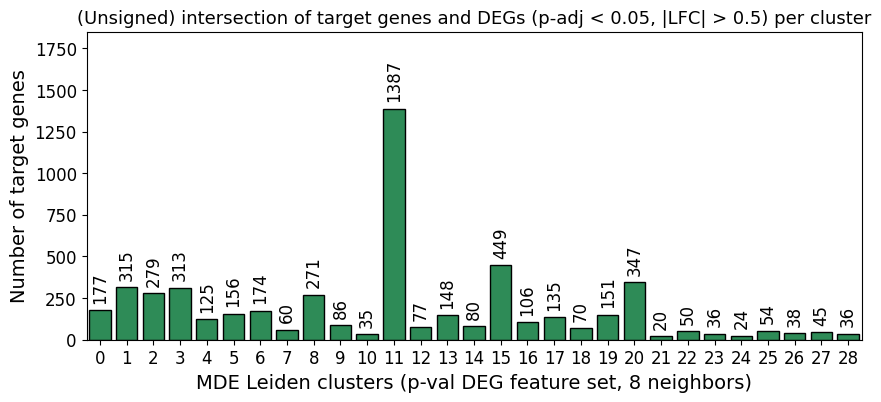

In [ ]:
plot_n_cluster_genes_in_db_unsigned(unsigned_summary8_lfc0pt5, 
    title="(Unsigned) intersection of target genes and DEGs (p-adj < 0.05, |LFC| > 0.5) per cluster",
                                    xlabel="MDE Leiden clusters (p-val DEG feature set, 8 neighbors)",
                                    color="seagreen", ymax=1850)

2025-06-08 21:06:11 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-06-08 21:06:11 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


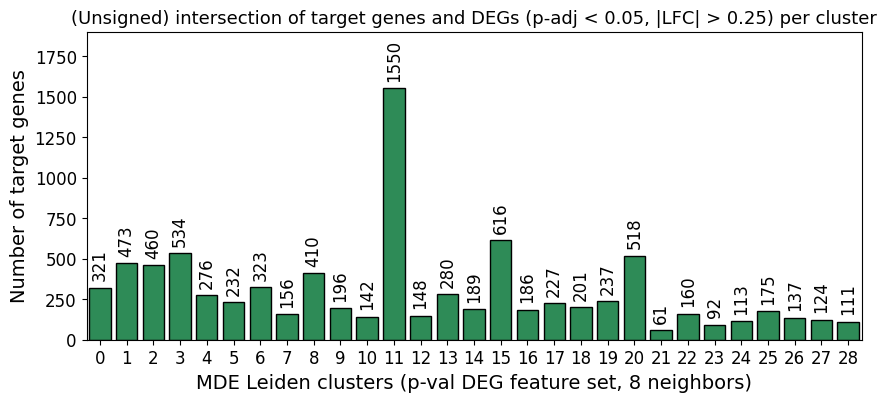

In [ ]:
plot_n_cluster_genes_in_db_unsigned(unsigned_summary8_lfc0pt25, 
    title="(Unsigned) intersection of target genes and DEGs (p-adj < 0.05, |LFC| > 0.25) per cluster",
                                    xlabel="MDE Leiden clusters (p-val DEG feature set, 8 neighbors)",
                                    color="seagreen", ymax=1900)

2025-06-08 20:30:37 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-06-08 20:30:37 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


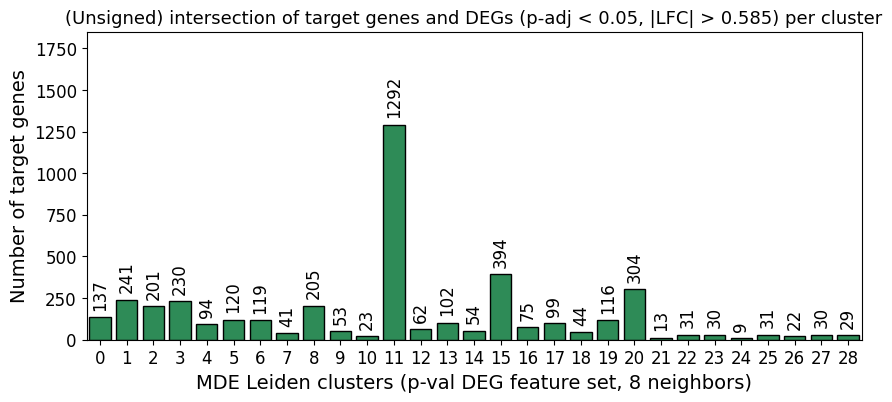

In [ ]:
plot_n_cluster_genes_in_db_unsigned(unsigned_summary8_lfc0pt585, 
    title="(Unsigned) intersection of target genes and DEGs (p-adj < 0.05, |LFC| > 0.585) per cluster",
                                    xlabel="MDE Leiden clusters (p-val DEG feature set, 8 neighbors)",
                                    color="seagreen", ymax=1850)

### Plot number of up/downregulated genes per cluster

In [ ]:
def plot_up_down_genes(cluster_df, title, xlabel=None, ymax=None, legend=True):
    categories = cluster_df.index.tolist()
    vals1 = cluster_df["# genes UP only"].tolist()
    vals2 = cluster_df["# genes DOWN only"].tolist()
    label1 = "Upregulated"
    label2 = "Downregulated"

    fig, ax = plt.subplots(figsize=(12,4))
    w, x = 0.4, np.arange(len(categories))
    up = ax.bar(x-w/2, vals1, w, label=label1, edgecolor="black", linewidth=1, facecolor="indianred")
    down = ax.bar(x+w/2, vals2, w, label=label2, edgecolor="black", linewidth=1, facecolor="cornflowerblue")

    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.set_xlabel(xlabel, fontsize=14) if xlabel else \
        ax.set_xlabel('MDE Leiden Cluster', fontsize=14)
    ax.set_ylabel('Number of Genes', fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.bar_label(up, labels=[str(v) for v in vals1], rotation=90, padding=6, fontsize=11)
    ax.bar_label(down, labels=[str(v) for v in vals2], rotation=90, padding=6, fontsize=11)
    ax.set_title(title, fontsize=14)
    if legend:
        ax.legend(loc='best', fontsize=12)
    if ymax:
        ax.set_ylim(0, ymax)
    plt.show()

In [ ]:
# plot_up_down_genes(signed_hi_conf_summary8, 
#                     "Expected up/down target genes per TF KO cluster (high confidence)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

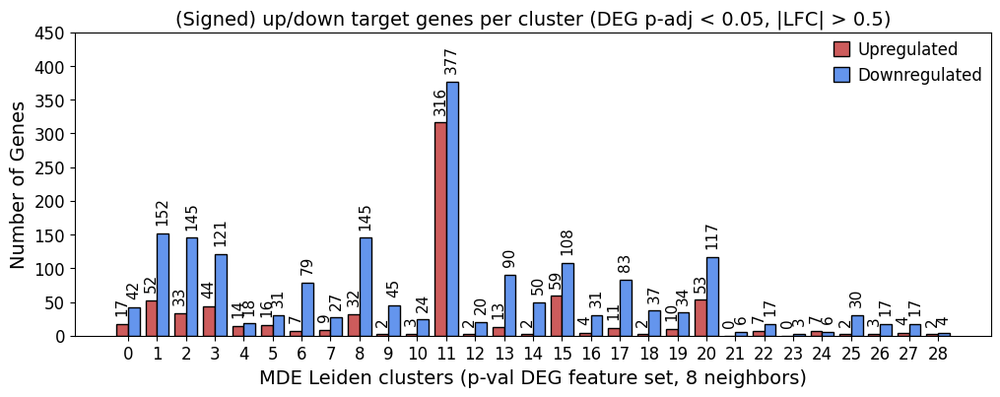

In [ ]:
# Formerly "medium confidence"
plot_up_down_genes(signed_summary8_lfc0pt5, 
                    "(Signed) up/down target genes per cluster (DEG p-adj < 0.05, |LFC| > 0.5)",
                    xlabel="MDE Leiden clusters (p-val DEG feature set, 8 neighbors)", ymax=450)

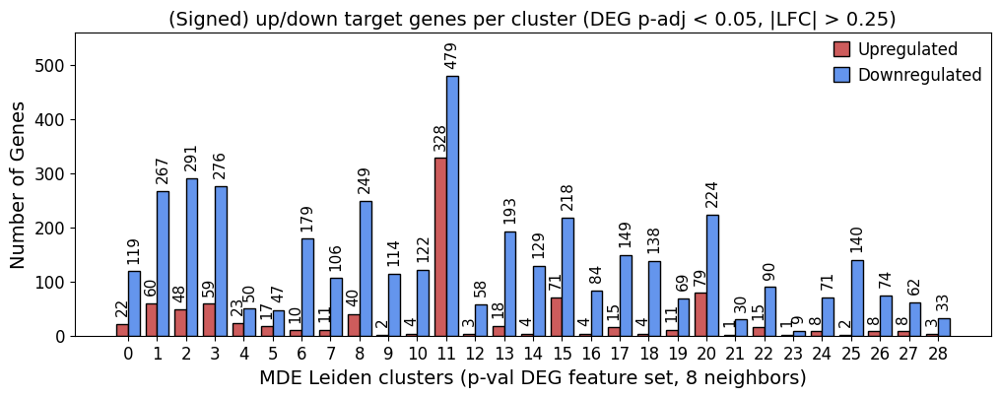

In [ ]:
plot_up_down_genes(signed_summary8_lfc0pt25, 
                    "(Signed) up/down target genes per cluster (DEG p-adj < 0.05, |LFC| > 0.25)",
                    xlabel="MDE Leiden clusters (p-val DEG feature set, 8 neighbors)", ymax=560)

In [ ]:
# plot_up_down_genes(signed_ko_lof_summary8, 
#                     "Expected up/down target genes per TF KO cluster (from KO/LOF experiments only)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

In [ ]:
# plot_up_down_genes(signed_dor_summary8, 
#                     "Expected up/down target genes per TF KO cluster (DoRothEA A/B)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

In [ ]:
# plot_up_down_genes(signed_dor_pert_summary8, 
#                     "Expected up/down target genes per TF KO cluster (DoRothEA A/B and KO/LOF expts)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

In [ ]:
def plot_up_down_both_genes(cluster_df, title, xlabel=None, ymax=None, legend=True):
    categories = cluster_df.index.tolist()
    vals1 = cluster_df["# genes UP only"].tolist()
    vals2 = cluster_df["# genes DOWN only"].tolist()
    vals3 = cluster_df["# genes BOTH"].tolist()
    label1 = "Upregulated only"
    label2 = "Downregulated only"
    label3 = "Both"

    fig, ax = plt.subplots(figsize=(10,4))
    w, x = 0.3, np.arange(len(categories))
    ax.bar(x-w, vals1, w, label=label1, edgecolor="black", linewidth=0.5, facecolor="tab:red")
    ax.bar(x, vals2, w, label=label2, edgecolor="black", linewidth=0.5, facecolor="tab:blue")
    ax.bar(x+w, vals3, w, label=label3, edgecolor="black", linewidth=0.5, facecolor="tab:purple")

    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.set_xlabel(xlabel, fontsize=14) if xlabel else \
        ax.set_xlabel('MDE Leiden Cluster', fontsize=14)
    ax.set_ylabel('Number of Genes', fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_title(title)
    if legend:
        ax.legend(loc='best', fontsize=12)
    if ymax:
        ax.set_ylim(0, ymax)
    plt.show()

In [ ]:
# plot_up_down_both_genes(signed_hi_conf_summary8, 
#                     "Expected up/down target genes per TF KO cluster (high confidence)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

In [ ]:
# plot_up_down_both_genes(signed_summary8_padj0pt05, 
#                     "Expected up/down/both target genes per TF KO cluster",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)")

In [ ]:
# plot_up_down_both_genes(signed_ko_lof_summary8, 
#                     "Expected up/down target genes per TF KO cluster (from KO/LOF experiments only)",
#                     xlabel="MDE Leiden clusters (HVG feature set, 8 neighbors)", ymax=3500)

Based on these results, we will use the unsigned and the signed (medium confidence) TF-target interaction sets moving forward, since they have the greatest cluster coverage. We will generate graphs for the signed set with edited labels.

### Plots with 10 k-nearest neighbors for Leiden clustering

Read in TF KOs per cluster in MDE generated with p-val DEGs as features and 10 k-nearest neighbors for Leiden clustering

In [ ]:
clusters_10nbrs = pd.read_csv("/home/ranwyl/results_tf_project/tf_ko_clusters_degs_pval_10_nbrs.csv", header=0, index_col=0)
clusters_10nbrs.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,ARID3A,AIRE,ADNP2,ANKZF1,ASCL2,ARID2,BARHL1,BARX1,BCL6B,BHLHA9,...,AEBP1,BHLHE41,DMRT2,ARHGAP35,ASCL3,CREBL2,BHLHA15,HNF1A,ARNT2,DR1
1,ATF6B,ARID3B,CDX1,ARX,CENPX,ASH1L,BHLHE22,BAZ2A,CSRNP2,ESRRB,...,ARNT,DLX6,ESRRG,ATMIN,DMBX1,CTCFL,CXXC1,LTF,ASCL5,DRAP1
2,CEBPD,ASCL1,CREM,CC2D1A,DLX2,CCDC17,DMRTB1,BHLHE40,EPAS1,ETV5,...,ATOH7,FOXS1,ISL2,CHAMP1,ETV1,ESX1,ETS2,RFX7,EBF3,ESR1
3,CENPS,CREB3L4,FOSB,DEAF1,DMRTA2,CEBPA,ETS1,BSX,ESRRA,GSC,...,ELF3,IRF9,KMT2B,DNMT1,FOXQ1,FOSL1,GRHL2,RUNX3,L3MBTL4,HIVEP2
4,CREB5,FLYWCH1,FOSL2,EMX1,DMRTC2,CREB3L3,FOXD3,FIGLA,GATA1,IRF8,...,ERF,MECOM,MEOX1,DOT1L,GATAD2B,FOXD4,KLF10,SOX1,PLSCR1,POU3F3


In [ ]:
# |LFC| > 0.5, p-adj < 0.05
unsigned_targets10_padj0pt05, unsigned_summary10_padj0pt05 = \
    find_tf_targets_per_cluster(clusters_10nbrs, de_results, full_tf_target_dict_unsigned, padj_thr=0.05)
unsigned_summary10_padj0pt05.head()

,# TF KOs,# target genes,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,
0,45,175,21,47%
1,42,2030,29,69%
2,41,177,25,61%
3,41,315,21,51%
4,39,282,23,59%


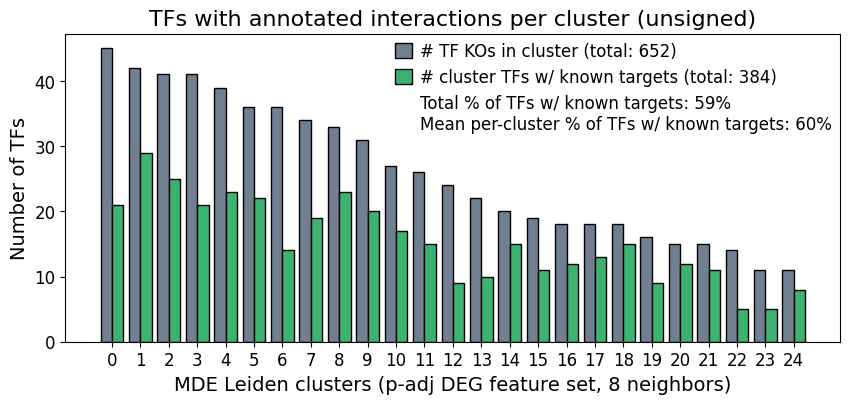

In [ ]:
plot_n_cluster_tfs_in_db(unsigned_summary10_padj0pt05, 
                         "TFs with annotated interactions per cluster (unsigned)",
                         xlabel="MDE Leiden clusters (p-adj DEG feature set, 8 neighbors)",
                         color2="mediumseagreen")

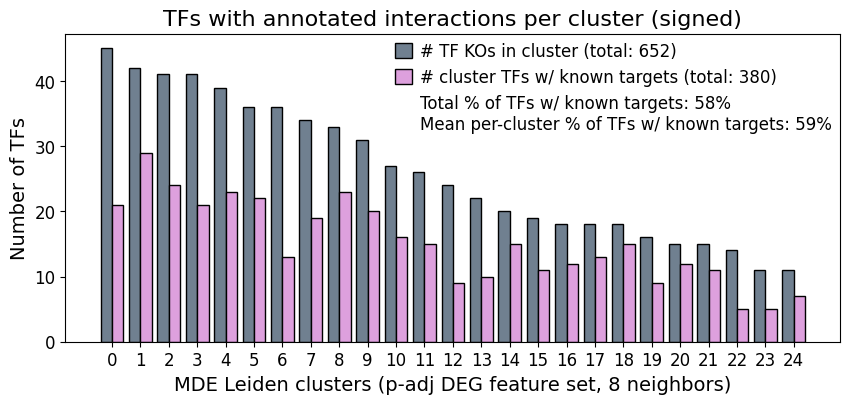

In [ ]:
plot_n_cluster_tfs_in_db(signed_summary10_padj0pt05, 
                         "TFs with annotated interactions per cluster (signed)",
                         xlabel="MDE Leiden clusters (p-adj DEG feature set, 8 neighbors)",
                         color2="plum")

2025-06-08 04:14:20 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-06-08 04:14:20 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


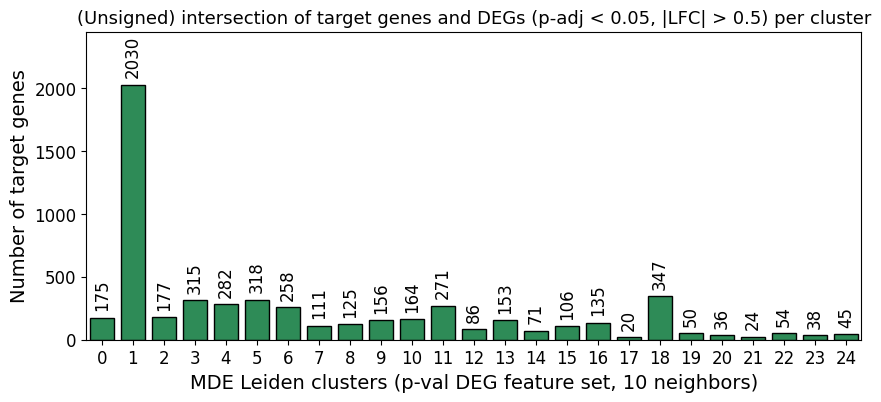

In [ ]:
plot_n_cluster_genes_in_db_unsigned(unsigned_summary10_padj0pt05, 
    title="(Unsigned) intersection of target genes and DEGs (p-adj < 0.05, |LFC| > 0.5) per cluster",
                                    xlabel="MDE Leiden clusters (p-val DEG feature set, 10 neighbors)",
                                    color="seagreen", ymax=2450)

In [ ]:
# |LFC| > 0.5, p-adj < 0.05
signed_targets10_lfc0pt5, signed_summary10_lfc0pt5 = \
    find_tf_targets_per_cluster(clusters_10nbrs, de_results, signed_tf_target_dict)
signed_summary10_lfc0pt5.head()

,# TF KOs,# genes UP only,# genes DOWN only,# genes BOTH,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,,,
0,45,15,93,0,21,47%
1,42,431,514,18,29,69%
2,41,17,42,0,24,59%
3,41,52,152,0,21,51%
4,39,33,148,0,23,59%


In [ ]:
# |LFC| > 0.25, p-adj < 0.05
signed_targets10_lfc0pt25, signed_summary10_lfc0pt25 = \
    find_tf_targets_per_cluster(clusters_10nbrs, de_results, 
                                signed_tf_target_dict, padj_thr=0.05, lfc_thr=0.25)
signed_summary10_lfc0pt25.head()

,# TF KOs,# genes UP only,# genes DOWN only,# genes BOTH,# cluster TFs w/ known targets,% cluster TFs w/ known targets
Cluster,,,,,,
0,45,19,211,0,21,47%
1,42,447,632,35,29,69%
2,41,22,119,3,24,59%
3,41,60,267,1,21,51%
4,39,48,295,2,23,59%


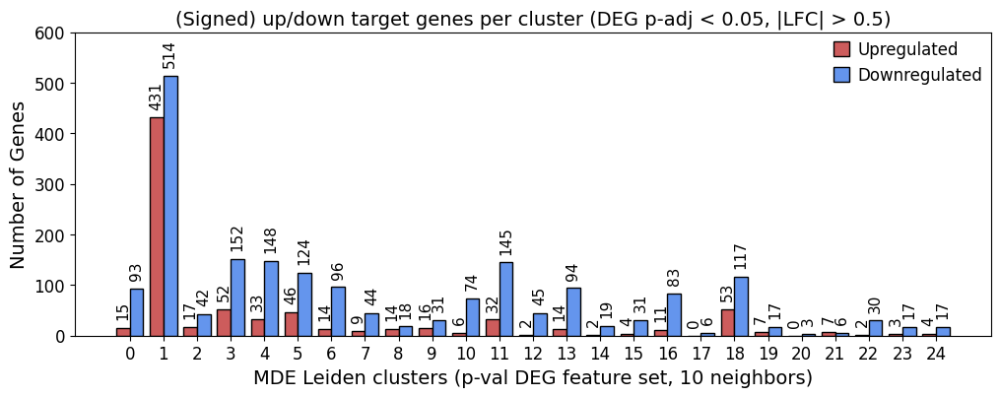

In [ ]:
plot_up_down_genes(signed_summary10_lfc0pt5, 
                    "(Signed) up/down target genes per cluster (DEG p-adj < 0.05, |LFC| > 0.5)",
                    xlabel="MDE Leiden clusters (p-val DEG feature set, 10 neighbors)", ymax=600)

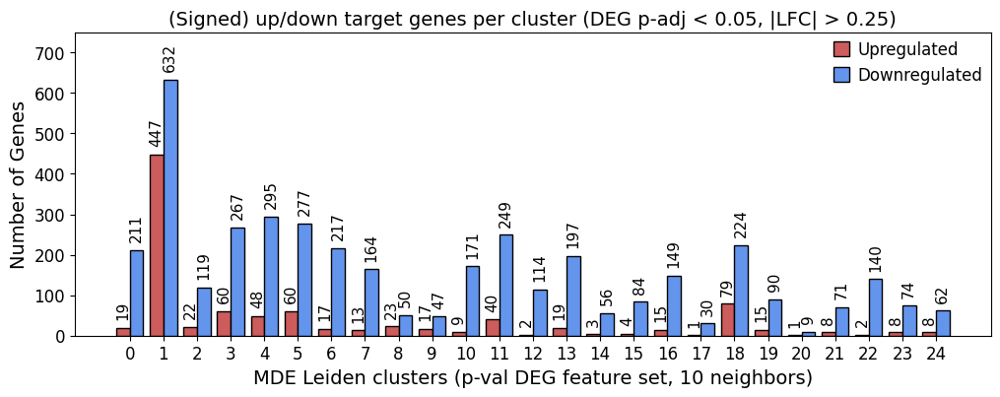

In [ ]:
plot_up_down_genes(signed_summary10_lfc0pt25, 
                    "(Signed) up/down target genes per cluster (DEG p-adj < 0.05, |LFC| > 0.25)",
                    xlabel="MDE Leiden clusters (p-val DEG feature set, 10 neighbors)", ymax=750)

In [ ]:
# ko_lof_targets10, ko_lof_summary10 = find_tf_targets_per_cluster(clusters_10nbrs, signed_ko_lof_target_dict)
# ko_lof_summary10.head()

In [ ]:
# plot_n_cluster_tfs_in_db(ko_lof_summary10, 
#                          "TFs with annotated interactions per cluster (signed, KO/LOF only)",
#                          xlabel="MDE Leiden clusters (HVG feature set, 10 neighbors)",
#                          color2="tab:red")

## ORA with g:Profiler web tool

First we will perform ORA on the up- and downregulated genes of each cluster if there are >= 9 or 10 genes in the set. We will use the Excel file saved in the previous section and use the g:Profiler web tool.

## ORA with gseapy

Now we will perform ORA using gseapy.

In [ ]:
pd.set_option('display.max_colwidth', 100)

In [ ]:
print_dict(signed_targets8_lfc0pt25)

0: {'UP': {'CALD1', 'LINGO2', 'KIF5B', 'HUWE1', 'TRIO', 'TNRC6A', 'APP', 'IGF1R', 'RERE', 'NBEA', 'ITPR2', 'GRIA4', 'FNDC3B', 'BPTF', 'LPP', 'RBM25', 'UTRN', 'MYO10', 'PRKG1', 'USP9X', 'KIF1B', 'NAV2'}, 'DOWN': {'TPT1', 'TERF1', 'RPL37A', 'RCN2', 'DEK', 'PPIA', 'RPL29', 'RPLP0', 'PPP1CC', 'EEF2', 'RPS15A', 'RPL32', 'RPS4X', 'GPX4', 'HSP90AB1', 'RPS11', 'PTMA', 'CCT4', 'PTMS', 'MT-ND5', 'CD9', 'RPL18A', 'MYL6', 'LDHA', 'SRSF3', 'MT-ATP8', 'SUMO2', 'HMGN2', 'NME2', 'NACA', 'EIF4A1', 'CD63', 'RPL8', 'CFL1', 'ACTG1', 'RPL7A', 'RACK1', 'RPS14', 'RPLP1', 'RPL30', 'MT-ND2', 'HNRNPC', 'HACD3', 'GAPDH', 'DPYSL2', 'CALR', 'HINT1', 'RPL10A', 'EIF4H', 'UBB', 'TMEM106C', 'RPL6', 'IMPDH2', 'RPS23', 'MT-CO2', 'TOMM20', 'HNRNPA1', 'TRIM2', 'MT-ND3', 'RPS10', 'RPL7', 'RPS2', 'CALM2', 'EEF1A1', 'RPS24', 'MT-CYB', 'RPL27', 'PDIA6', 'RPL18', 'FTL', 'PPIB', 'TMSB10', 'ZNF398', 'RPS7', 'EIF1', 'PCBP1', 'UCHL1', 'CKB', 'RPL34', 'ATP6V1G1', 'RPL11', 'RAD21', 'RPS5', 'HSP90AA1', 'RPS29', 'RPL13A', 'MLEC', 'RPL

See which Enrichr gene sets we can use:

In [ ]:
all_libs = gp.get_library_name(organism='Human')
print([lib for lib in all_libs if "GO" in lib])
print([lib for lib in all_libs if "Hallmark" in lib])
print([lib for lib in all_libs if "Reactome" in lib])

['GO_Biological_Process_2013', 'GO_Biological_Process_2015', 'GO_Biological_Process_2017', 'GO_Biological_Process_2017b', 'GO_Biological_Process_2018', 'GO_Biological_Process_2021', 'GO_Biological_Process_2023', 'GO_Biological_Process_2025', 'GO_Cellular_Component_2013', 'GO_Cellular_Component_2015', 'GO_Cellular_Component_2017', 'GO_Cellular_Component_2017b', 'GO_Cellular_Component_2018', 'GO_Cellular_Component_2021', 'GO_Cellular_Component_2023', 'GO_Cellular_Component_2025', 'GO_Molecular_Function_2013', 'GO_Molecular_Function_2015', 'GO_Molecular_Function_2017', 'GO_Molecular_Function_2017b', 'GO_Molecular_Function_2018', 'GO_Molecular_Function_2021', 'GO_Molecular_Function_2023', 'GO_Molecular_Function_2025', 'SynGO_2022', 'SynGO_2024']
['MSigDB_Hallmark_2020']
['Reactome_2013', 'Reactome_2015', 'Reactome_2016', 'Reactome_2022', 'Reactome_Pathways_2024']


ORA code

In [ ]:
background_genes_filepath = "/home/ranwyl/results_tf_project/ora_background_genes.txt"
def ora_gseapy_full(cluster_dict, source_list, signed=True, min_genes=9):
    """
    Run ORA on all clusters using gseapy.
    """
    # Helper function to run ORA on single gene list using gseapy
    def ora_gseapy_query(gene_list, source_list):
        enr = gp.enrichr(gene_list=gene_list,
                    gene_sets=source_list,
                    organism='human',
                    background=background_genes_filepath,
                    outdir=None, # do not write to disk
                    )
        return enr.results # Return DataFrame of results

    # Run ORA on all clusters and save results in DF
    all_dfs_list = list()
    cluster_nums = sorted(list(cluster_dict.keys()))
    
    for i in tqdm(range(len(cluster_nums)), desc="Processing cluster number"):
        if signed == True: 
            for direction in "UP", "DOWN":
                cluster_genes = list(cluster_dict[i][direction])
                if len(cluster_genes) >= min_genes:
                    ora_df_full = ora_gseapy_query(cluster_genes, source_list)
                    # Add cluster number and up/down
                    ora_df_full.insert(0, "UP/DOWN", [direction]*ora_df_full.shape[0])
                    ora_df_full.insert(0, "Cluster", [i]*ora_df_full.shape[0])
                    all_dfs_list.append(ora_df_full)
        else:
            cluster_genes = list(cluster_dict[i])
            if len(cluster_genes) >= 5:
                ora_df_full = ora_gseapy_query(cluster_genes, source_list)
                # Add cluster number
                ora_df_full.insert(0, "Cluster", [i]*ora_df_full.shape[0])
                all_dfs_list.append(ora_df_full)

    full_df = pd.concat(all_dfs_list)
    return full_df

def filter_gseapy_results(full_df, signed=True, n_top_results=5, columns=6, 
                          gene_sets=None, sort_by="Adjusted P-value"):
    """
    Build combined DF of top terms for each cluster. 
    """
    top_df_list = list()
    cluster_nums = full_df["Cluster"].unique().tolist()
    for cluster in cluster_nums:
        if signed == True:
            for direction in "UP", "DOWN":
                if gene_sets:
                    cluster_dir_df = full_df[(full_df["Cluster"] == cluster) & 
                                            (full_df["UP/DOWN"] == direction) &
                                            (full_df["Gene_set"].isin(gene_sets))]
                else:
                    cluster_dir_df = full_df[(full_df["Cluster"] == cluster) & 
                                            (full_df["UP/DOWN"] == direction)]
                cluster_dir_df = cluster_dir_df.sort_values(sort_by)[:n_top_results]
                top_df_list.append(cluster_dir_df)
        elif signed == False:
            if gene_sets:
                cluster_dir_df = full_df[(full_df["Cluster"] == cluster) &
                                        (full_df["Gene_set"].isin(gene_sets))]
            else:
                cluster_dir_df = full_df[full_df["Cluster"] == cluster]
            cluster_dir_df = cluster_dir_df.sort_values(sort_by)[:n_top_results]
            top_df_list.append(cluster_dir_df)
    top_df = pd.concat(top_df_list)
    if type(columns) == int:
        filtered_df = top_df.iloc[:,:columns]
    elif type(columns) == list:
        filtered_df = top_df[columns]
    return filtered_df

def plot_shared_top_terms_gseapy(filtered_df, title, go, 
                                 signed=True, n_pathways=5, fig_size=(5, 6)):
    """
    Plot top term(s) shared by multiple clusters. 
    """
    xmax = filtered_df["Cluster"].nunique() + 1
    if go:
        abbrev_dict = {"GO_Biological_Process_2025":"GO:BP", 
                "GO_Cellular_Component_2025":"GO:CC", 
                "GO_Molecular_Function_2025":"GO:MF"}
        filtered_df["Gene_set"] = filtered_df["Gene_set"].replace(abbrev_dict)
        filtered_df["Term"] = filtered_df["Term"].str.split("(").str.get(0)
        filtered_df["name and source"] = \
            filtered_df["Term"] + "(" + filtered_df["Gene_set"] + ")"
    
    if signed == True:
        dir_df_list = list()
        for direction in "UP", "DOWN":
            dir_df = filtered_df[filtered_df["UP/DOWN"] == direction]
            if go:
                dir_df = pd.DataFrame(dir_df['name and source'].value_counts().head(n_pathways))
            else:
                dir_df = pd.DataFrame(dir_df['Term'].value_counts().head(n_pathways))
            dir_df_list.append(dir_df)

        df_up, df_down = dir_df_list[0], dir_df_list[1]
        df_up = df_up.reset_index()
        df_up.columns = ["Term", "Count"]
        df_down = df_down.reset_index()
        df_down.columns = ["Term", "Count"]

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=fig_size)
        sns.barplot(data=df_up, x="Count", y="Term", orient="h", ax=ax1, color="indianred", height=0.5)
        sns.barplot(data=df_down, x="Count", y="Term", orient="h", ax=ax2, color="cornflowerblue", height=0.5)
        plt.rcParams.update({"font.size":14})
        for ax in (ax1, ax2):
            ax.set_xlim(0, xmax)
            ax.set_ylabel("")
        ax1.set_xlabel("")
        ax2.set_xlabel("Number of clusters", fontsize=14)
        ax1a = ax1.twinx()
        ax1a.set_ylabel("Upregulated genes", fontsize=14)
        ax2a = ax2.twinx()
        ax2a.set_ylabel("Downregulated genes", fontsize=14)
        for ax in ax1a, ax2a:
            ax.tick_params(axis='y', which='both', right=False)
            ax.set_yticklabels([])
        fig.suptitle(title, fontsize=15, y=0.95)
    
    elif signed == False:
        if go:
            res_df = pd.DataFrame(filtered_df['name and source'].value_counts().head(n_pathways))
        else:
            res_df = pd.DataFrame(filtered_df['Term'].value_counts().head(n_pathways))
        res_df = res_df.reset_index()
        res_df.columns = ["Term", "Count"]
        
        fig, ax = plt.subplots(figsize=(5,3))
        ax = sns.barplot(data=res_df, x="Count", y="Term", orient="h", color="mediumseagreen", height=0.5)
        plt.rcParams.update({"font.size":14})
        ax.set_xlim(0, xmax)
        ax.set_ylabel("")
        ax.set_xlabel("Number of clusters", fontsize=14)
        fig.suptitle(title, fontsize=15, y=0.95)

### Test out code with one cluster at a time

In [ ]:
background_genes_filepath = "/home/ranwyl/results_tf_project/ora_background_genes.txt"
def ora_gseapy_query1(gene_list: list, sources):
    enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=sources,
                 organism='human',
                 background=background_genes_filepath,
                 outdir=None, # do not write to disk
                )
    return enr.results # Return DataFrame of results

In [ ]:
genes_0_up = sorted(list(signed_targets8[0]["UP"]))
genes_1_up = sorted(list(signed_targets8[1]["UP"]))
print(genes_0_up[:10])
print(genes_1_up[:10])

['A2M', 'AAED1', 'AARS', 'ABAT', 'ABCA1', 'ABCA3', 'ABCC3', 'ABCE1', 'ABCG1', 'ABCG2']
['A4GALT', 'AAK1', 'ABAT', 'ABCB7', 'ABCC2', 'ABCC3', 'ABCC4', 'ABCE1', 'ABCF1', 'ABCG2']


GO

In [ ]:
go_gene_sets = ["GO_Biological_Process_2025", "GO_Cellular_Component_2025", "GO_Molecular_Function_2025"]

In [ ]:
cluster0_up = ora_gseapy_query1(genes_0_up, go_gene_sets)

In [ ]:
cluster0_up.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2025,Regulation of Apoptotic Process (GO:0042981),1.313617e-85,6.080733e-82,0,0,7.292143,1425.227092,TFRC;PHB2;IFIT3;CCAR1;IFIT2;UXT;LGALS3;MYC;TNFSF10;AKT1;SOX9;IER3;MEF2C;ACTN...
1,GO_Biological_Process_2025,Cytoplasmic Translation (GO:0002181),2.788492e-57,6.453965e-54,0,0,32.683978,4256.168097,EIF4A2;RPL4;EIF4A1;RPL5;RPL3;RPL32;RPL31;RPL34;RPLP0;RPL10A;RPL8;RPL9;RPL6;R...
2,GO_Biological_Process_2025,Regulation of Gene Expression (GO:0010468),4.784778e-52,7.382912e-49,0,0,4.014120,474.344525,RPL5;SPI1;TFRC;TSKU;RPL6;UBE2L3;RPS6KA5;MYC;GPBP1;MYB;NAMPT;AKT1;IL12B;ADNP2...
3,GO_Biological_Process_2025,Positive Regulation of DNA-templated Transcription (GO:0045893),6.949403e-52,8.042197e-49,0,0,3.774089,444.571765,EIF4A1;SPI1;HNRNPU;IL4I1;RPS6KA5;TRIM28;MYC;MYB;NAMPT;AKT1;SOX9;ATXN7L3;IER2...
4,GO_Biological_Process_2025,Negative Regulation of Apoptotic Process (GO:0043066),4.486509e-51,3.791756e-48,0,0,6.372109,738.723503,TFRC;ZFAND6;SERPINE1;PARK7;PHB2;TNF;IFIT3;IGF1R;CDH5;CCND2;MYC;ARHGDIA;PDK4;...


In [ ]:
cluster1_up = ora_gseapy_query1(genes_1_up, go_gene_sets)

In [ ]:
cluster1_up.head(2)

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2025,Regulation of Apoptotic Process (GO:0042981),2.370160e-62,1.093592e-58,0,0,5.510493,781.924142,FOXA1;PAGE4;MTCH1;APP;RTKN;TFRC;YEATS4;CIB1;PARK7;TNF;IFIT2;IGF1R;UXT;LGALS3...
1,GO_Biological_Process_2025,Cytoplasmic Translation (GO:0002181),1.392249e-49,3.211919e-46,0,0,25.051515,2818.188910,EIF4A2;RPL4;EIF4A1;RPL5;RPL30;RPL3;RPL32;RPL31;RPL34;RPLP0;RPL10A;RPL8;RPL9;...


Hallmark

In [ ]:
cluster0_up_hallmark = ora_gseapy_query1(genes_0_up, ["MSigDB_Hallmark_2020"])

In [ ]:
cluster0_up_hallmark.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,9.857244e-113,4.928622e-111,0,0,33.525081,8646.249392,EIF4A1;RPL34;HNRNPU;PWP1;PHB2;RPL6;UBE2L3;PSMD8;CDC20;EEF1B2;PSMD7;TRIM28;MY...
1,MSigDB_Hallmark_2020,mTORC1 Signaling,1.320753e-53,3.301882e-52,0,0,12.867793,1566.767098,CDKN1A;TFRC;PITPNB;UBE2D3;ITGB2;ARPC5L;SLC2A1;ATP2A2;PLOD2;ENO1;SLC7A11;TM7S...
2,MSigDB_Hallmark_2020,Estrogen Response Early,1.624747e-47,2.707912e-46,0,0,11.536557,1242.904176,SCARB1;B4GALT1;WWC1;HSPB8;FHL2;SLC2A1;ABAT;AQP3;AREG;PRSS23;CELSR2;TSKU;RAPG...
3,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,1.315450e-45,1.644312e-44,0,0,11.146442,1151.897291,CDKN1A;CD83;B4GALT1;CSF1;SERPINE1;PLEK;TNC;TNFAIP2;TNFAIP3;LITAF;AREG;TNF;SA...
4,MSigDB_Hallmark_2020,Oxidative Phosphorylation,9.407161e-42,9.407161e-41,0,0,10.100238,954.140216,COX7B;SLC25A3;COX4I1;MRPS12;ETFA;PHB2;COX7C;TOMM22;AIFM1;PDK4;IDH3B;UQCRFS1;...


In [ ]:
cluster1_up_hallmark = ora_gseapy_query1(genes_1_up, ["MSigDB_Hallmark_2020"])

In [ ]:
cluster1_up_hallmark.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,3.296870e-46,1.648435e-44,0,0,10.579994,1107.999874,YWHAE;EIF4A1;SLC25A3;HSP90AB1;RPL34;RPLP0;HNRNPR;RPL6;EEF1B2;FBL;XPO1;MYC;RA...
1,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,8.169159e-40,2.042290e-38,0,0,9.348923,841.431443,BTG3;CXCL6;CDKN1A;BTG1;SERPINE1;TNFAIP2;TNFAIP3;CXCL1;SLC2A3;LITAF;AREG;TNF;...
2,MSigDB_Hallmark_2020,G2-M Checkpoint,1.782333e-38,2.970555e-37,0,0,8.995348,781.878478,TOP2A;JPT1;NUMA1;AMD1;KIF11;CTCF;MKI67;TENT4A;SMC4;LMNB1;CKS1B;MT2A;XPO1;PTT...
3,MSigDB_Hallmark_2020,mTORC1 Signaling,2.410970e-37,3.013712e-36,0,0,8.729687,736.048937,ERO1A;CDKN1A;TFRC;UBE2D3;ITGB2;ARPC5L;SLC2A1;ATP2A2;PLOD2;SLC2A3;IFI30;FADS2...
4,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,2.092950e-36,2.092950e-35,0,0,8.541245,701.701597,ITGB1;CXCL6;CXCL8;SERPINE2;ITGB5;SERPINE1;COL12A1;TNFAIP3;PLOD2;LAMC2;CXCL1;...


Reactome

In [ ]:
cluster0_up_reac = ora_gseapy_query1(genes_0_up, ["Reactome_Pathways_2024"])

In [ ]:
cluster0_up_reac.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_Pathways_2024,Disease,9.131380e-138,1.741354e-134,0,0,5.749157,1814.117847,RPL4;RPL5;RPL3;RPL32;RPL31;RPL34;SERPINE1;ENO1;RPL8;RPL9;RPL6;RPL7;PSMD8;PSM...
1,Reactome_Pathways_2024,Immune System,6.337931e-136,6.043218e-133,0,0,5.451383,1697.042869,PSMD8;PSMD6;PSMD7;AKT2;MYC;PSMD2;PSMD3;AKT1;JUNB;MEF2C;WSB1;NHLRC3;RNASE6;PS...
2,Reactome_Pathways_2024,Cellular Responses to Stimuli,5.332188e-129,3.389494e-126,0,0,8.549018,2525.035486,RPL4;RPL5;RPL3;RPL32;MT-CO1;RPL31;RPL34;MT1X;PPP2R2A;RPL8;PHB2;RPL9;RPL6;RPL...
3,Reactome_Pathways_2024,Cellular Responses to Stress,3.651456e-121,1.740832e-118,0,0,8.863198,2457.921487,RPL4;RPL5;RPL3;RPL32;MT-CO1;RPL31;RPL34;RPL8;PHB2;RPL9;RPL6;RPL7;PSMD8;RPS15...
4,Reactome_Pathways_2024,Infectious Disease,3.141248e-120,1.198072e-117,0,0,7.476982,2057.408253,RPL4;RPL5;RPL3;RPL32;RPL31;RPL34;SERPINE1;ENO1;RPL8;RPL9;ACTB;RPL6;RPL7;PSMD...


In [ ]:
cluster1_up_reac = ora_gseapy_query1(genes_1_up, ["Reactome_Pathways_2024"])

In [ ]:
cluster1_up_reac.head()

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_Pathways_2024,Disease,4.677948e-123,8.771152e-120,0,0,5.028272,1416.339062,CYFIP2;RPL4;NCKAP1;RPL5;RPL30;RPL3;RPL32;RPL31;RPL34;SERPINE1;RBPJ;RPL8;RPL9...
1,Reactome_Pathways_2024,Cellular Responses to Stimuli,3.243496e-118,3.040778e-115,0,0,7.521265,2034.715675,RPL4;RPL5;RPL30;RPL3;RPL32;MT-CO1;RPL31;RPL34;MT1X;RPL8;RPL9;RPL6;RPL7;RPS15...
2,Reactome_Pathways_2024,Metabolism of Proteins,6.564452e-116,4.102782e-113,0,0,4.541258,1204.424368,MT-ND6;RPL4;RPL5;RPL30;MT-ND5;RPL3;RPL32;MT-CO1;RPL31;RPL34;MT-ND2;RPL8;RPL9...
3,Reactome_Pathways_2024,Immune System,6.804932e-110,3.152722e-107,0,0,4.491282,1128.958701,CYFIP2;NCKAP1;PSMD2;MYC;WSB1;NUP210;PRKCE;PRKCD;ARMC8;UNC13D;RNF123;ORAI1;TX...
4,Reactome_Pathways_2024,Cellular Responses to Stress,8.407258e-110,3.152722e-107,0,0,7.725106,1940.201014,RPL4;RPL5;RPL30;RPL3;RPL32;MT-CO1;RPL31;RPL34;RPL8;RPL9;RPL6;RPL7;RPS15;RPS1...


### GO

In [ ]:
go_gene_sets = ["GO_Biological_Process_2025", "GO_Cellular_Component_2025", "GO_Molecular_Function_2025"]

In [ ]:
signed_results_go8 = ora_gseapy_full(signed_targets8_lfc0pt25, go_gene_sets, signed=True)

Processing cluster number: 100%|██████████| 29/29 [04:55<00:00, 10.20s/it]


In [ ]:
signed_results_go8.head(3)

,Cluster,UP/DOWN,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,0,UP,GO_Biological_Process_2025,Axonogenesis (GO:0007409),0.000005,0.001287,0,0,42.345805,514.495535,APP;TRIO;USP9X;KIF5B
1,0,UP,GO_Biological_Process_2025,Dense Core Granule Cytoskeletal Transport (GO:0099519),0.000007,0.001287,0,0,750.800000,8926.629886,KIF5B;KIF1B
2,0,UP,GO_Biological_Process_2025,Retrograde Axonal Transport (GO:0008090),0.000039,0.004070,0,0,268.078571,2720.916515,KIF5B;KIF1B


In [ ]:
# Save
signed_results_go8.to_pickle(
    "/home/ranwyl/results_tf_project/ora_tf_targets_signed_go_lfc0pt25_8nbrs.pkl")

In [ ]:
# Read in
signed_results_go8 = pd.read_pickle(
    "/home/ranwyl/results_tf_project/ora_tf_targets_signed_go_lfc0pt25_8nbrs.pkl")

Get top GO term(s) per cluster

In [ ]:
# cols = ["Cluster", "Gene_set", "Term", "P-value", "Adjusted P-value", "Combined Score"]
# unsigned_top_go_term_per_cluster = \
#     filter_gseapy_results(signed_results_go, signed=False, n_top_results=1, columns=cols)
# unsigned_top_5_go_terms_per_cluster = \
#     filter_gseapy_results(signed_results_go, signed=False, n_top_results=5, columns=cols)

In [ ]:
# unsigned_top_go_term_per_cluster.head(10)

In [ ]:
cols = ["Cluster", "UP/DOWN", "Gene_set", "Term", "P-value", "Adjusted P-value", "Combined Score"]
signed_top_go_term_per_cluster8 = filter_gseapy_results(signed_results_go8, n_top_results=1, columns=cols)
signed_top_5_go_terms_per_cluster8 = filter_gseapy_results(signed_results_go8, n_top_results=5, columns=cols)

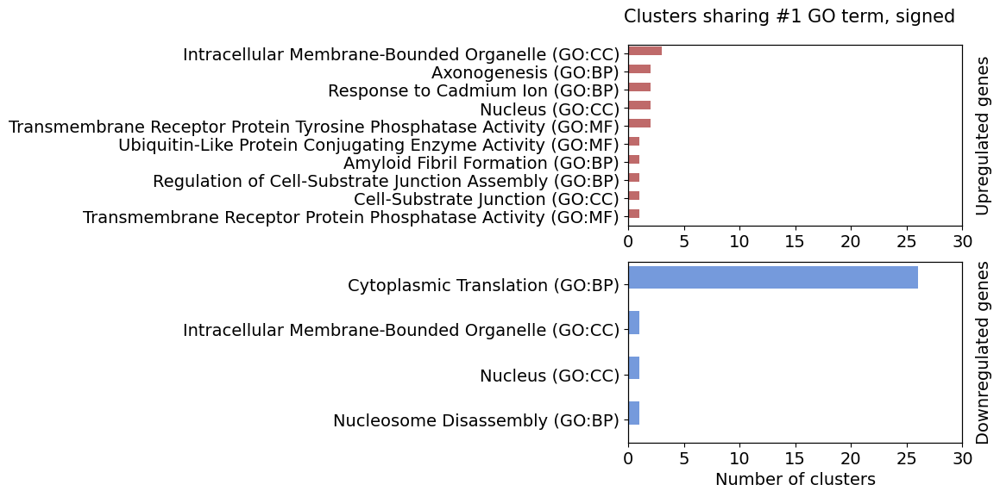

In [ ]:
plot_shared_top_terms_gseapy(signed_top_go_term_per_cluster8, 
                             "Clusters sharing #1 GO term, signed",
                             go=True, n_pathways=29)

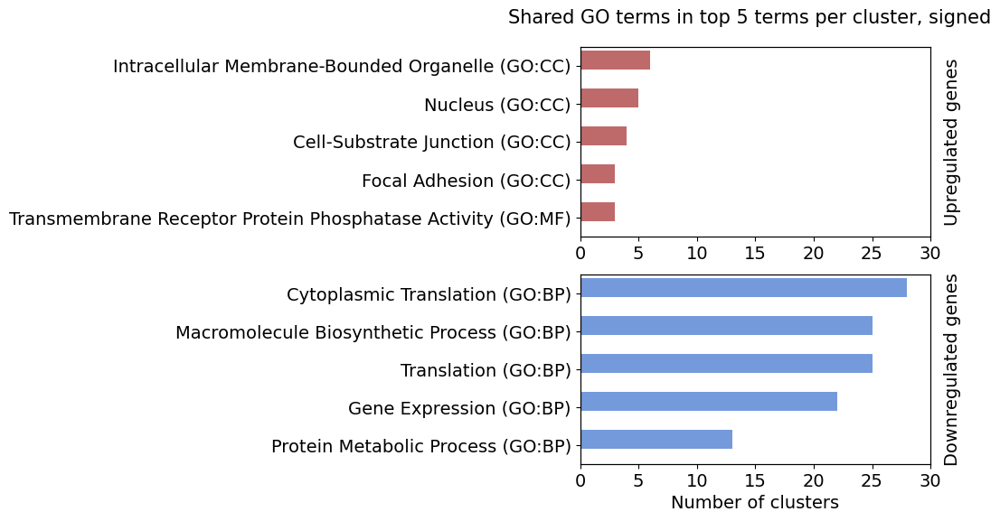

In [ ]:
plot_shared_top_terms_gseapy(signed_top_5_go_terms_per_cluster8, 
                                "Shared GO terms in top 5 terms per cluster, signed",
                                go=True, n_pathways=5)

In [ ]:
signed_top_gobp_term_per_cluster8 = filter_gseapy_results(signed_results_go8, 
                                                         gene_sets=["GO_Biological_Process_2025"], 
                                                         n_top_results=1, columns=cols)
signed_top_5_gobp_terms_per_cluster8 = filter_gseapy_results(signed_results_go8, 
                                                         gene_sets=["GO_Biological_Process_2025"], 
                                                         n_top_results=5, columns=cols)

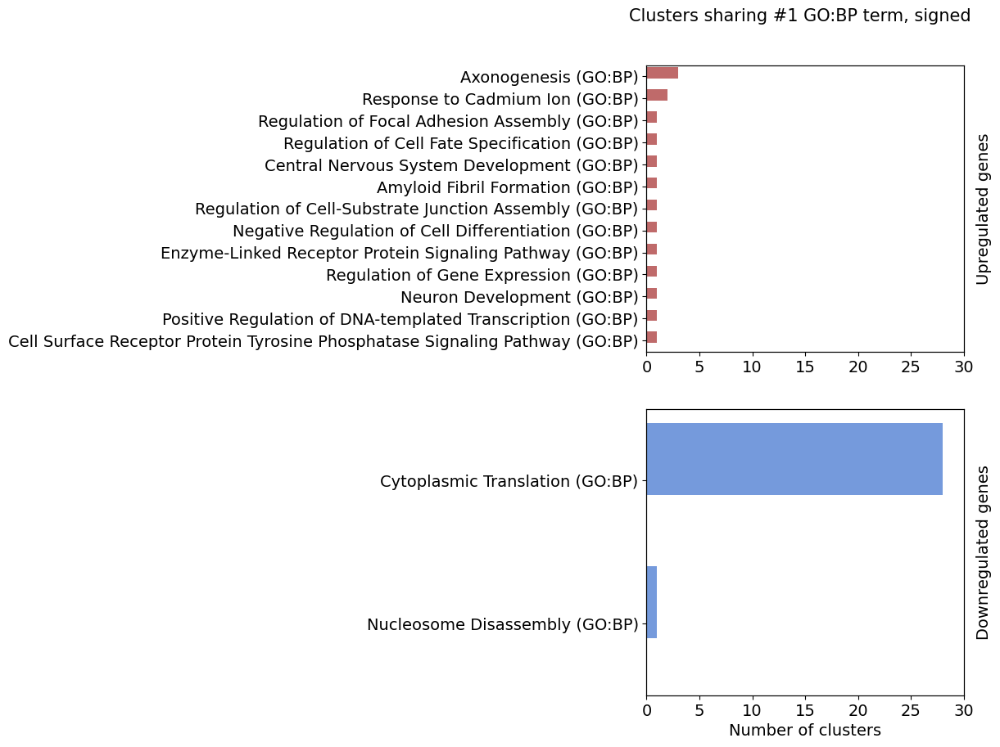

In [ ]:
plot_shared_top_terms_gseapy(signed_top_gobp_term_per_cluster8, 
                                "Clusters sharing #1 GO:BP term, signed",
                                go=True, n_pathways=29, fig_size=(5, 10))

In [ ]:
signed_top_gobp_term_per_cluster8.iloc[:,[0,1,2,3,4]]

,Cluster,UP/DOWN,Gene_set,Term,P-value
0,0,UP,GO:BP,Axonogenesis,5.289121e-06
0,0,DOWN,GO:BP,Cytoplasmic Translation,7.013054e-81
0,1,UP,GO:BP,Axonogenesis,8.322695e-07
0,1,DOWN,GO:BP,Cytoplasmic Translation,9.118647e-141
0,2,UP,GO:BP,Regulation of Focal Adhesion Assembly,6.558063e-07
0,2,DOWN,GO:BP,Cytoplasmic Translation,1.000293e-145
0,3,UP,GO:BP,Axonogenesis,9.851799e-10
0,3,DOWN,GO:BP,Cytoplasmic Translation,1.587029e-113
0,4,UP,GO:BP,Response to Cadmium Ion,4.279995e-05
0,4,DOWN,GO:BP,Cytoplasmic Translation,4.892124e-23


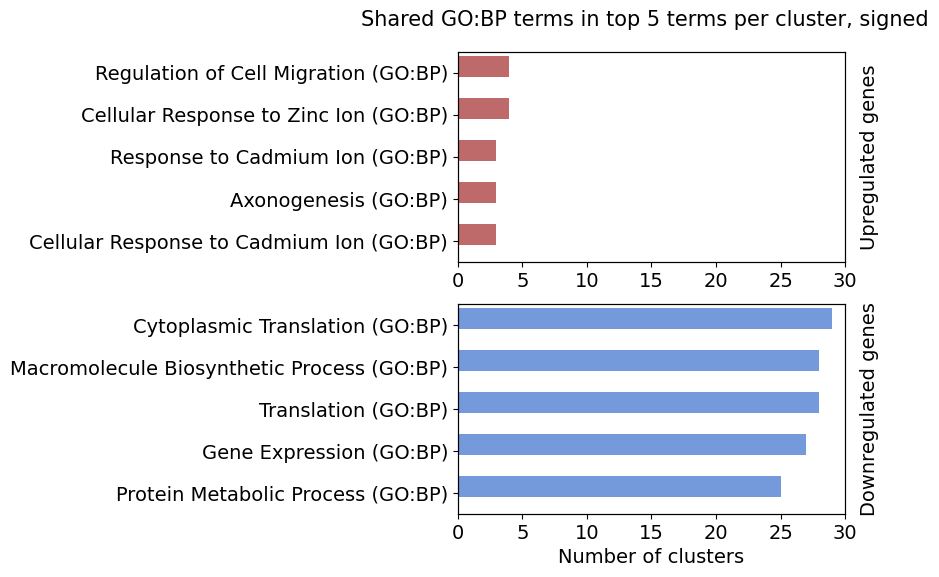

In [ ]:
plot_shared_top_terms_gseapy(signed_top_5_gobp_terms_per_cluster8, 
                                "Shared GO:BP terms in top 5 terms per cluster, signed",
                                go=True, n_pathways=5)

In [ ]:
signed_top_5_gobp_terms_per_cluster8

,Cluster,UP/DOWN,Gene_set,Term,P-value,Adjusted P-value,Combined Score,name and source
0,0,UP,GO:BP,Axonogenesis,5.289121e-06,1.286651e-03,514.495535,Axonogenesis (GO:BP)
1,0,UP,GO:BP,Dense Core Granule Cytoskeletal Transport,6.862141e-06,1.286651e-03,8926.629886,Dense Core Granule Cytoskeletal Transport (GO:BP)
2,0,UP,GO:BP,Retrograde Axonal Transport,3.908789e-05,4.070491e-03,2720.916515,Retrograde Axonal Transport (GO:BP)
3,0,UP,GO:BP,Modulation of Chemical Synaptic Transmission,4.341857e-05,4.070491e-03,520.748329,Modulation of Chemical Synaptic Transmission (GO:BP)
4,0,UP,GO:BP,Vesicle Transport Along Microtubule,8.964797e-05,6.723598e-03,1589.545908,Vesicle Transport Along Microtubule (GO:BP)
...,...,...,...,...,...,...,...,...
0,28,DOWN,GO:BP,Cytoplasmic Translation,8.891815e-39,2.062901e-36,48020.235017,Cytoplasmic Translation (GO:BP)
1,28,DOWN,GO:BP,Macromolecule Biosynthetic Process,5.844640e-36,6.779783e-34,24342.890481,Macromolecule Biosynthetic Process (GO:BP)
2,28,DOWN,GO:BP,Translation,3.452206e-34,2.669706e-32,18408.607626,Translation (GO:BP)
3,28,DOWN,GO:BP,Gene Expression,5.679513e-30,3.294117e-28,9410.734474,Gene Expression (GO:BP)


In [ ]:
signed_top_5_gobp_terms_per_cluster8.to_excel(
    "/home/ranwyl/results_tf_project/ora_gobp_top5_8nbrs_lfc0pt25.xlsx", index=False)

### MSigDB Hallmark

In [ ]:
signed_results_hallmark8 = ora_gseapy_full(signed_targets8_lfc0pt25, ["MSigDB_Hallmark_2020"])

Processing cluster number: 100%|██████████| 29/29 [01:52<00:00,  3.89s/it]


In [ ]:
signed_results_hallmark8.head()

,Cluster,UP/DOWN,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,0,UP,MSigDB_Hallmark_2020,Mitotic Spindle,0.000209,0.003140,0,0,30.087809,254.892555,TRIO;KIF5B;KIF1B
1,0,UP,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,0.005956,0.022556,0,0,19.055612,97.627104,HUWE1;IGF1R
2,0,UP,MSigDB_Hallmark_2020,Estrogen Response Early,0.005956,0.022556,0,0,19.055612,97.627104,NAV2;IGF1R
3,0,UP,MSigDB_Hallmark_2020,Myogenesis,0.006015,0.022556,0,0,18.958376,96.944130,APP;NAV2
4,0,UP,MSigDB_Hallmark_2020,Angiogenesis,0.020877,0.062632,0,0,51.034014,197.455647,APP


In [ ]:
signed_results_hallmark8 = signed_results_hallmark8.rename(columns={"cluster":"Cluster",
                                                                  "up/down":"UP/DOWN"})

In [ ]:
cols = ["Cluster", "UP/DOWN", "Gene_set", "Term", "P-value", "Adjusted P-value", "Combined Score"]
signed_top_hallmark_term_per_cluster8 = filter_gseapy_results(signed_results_hallmark8, n_top_results=1, columns=cols)
signed_top_5_hallmark_terms_per_cluster8 = filter_gseapy_results(signed_results_hallmark8, n_top_results=5, columns=cols)

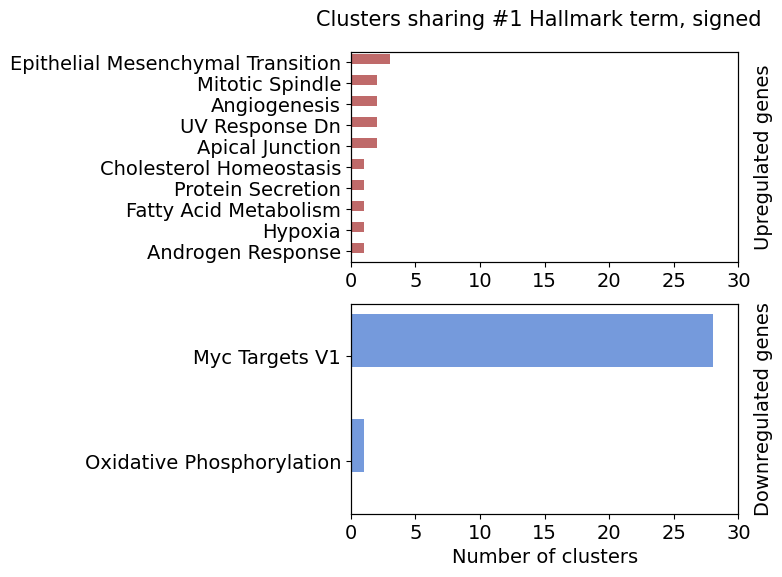

In [ ]:
plot_shared_top_terms_gseapy(signed_top_hallmark_term_per_cluster8, 
                                "Clusters sharing #1 Hallmark term, signed",
                                go=False, n_pathways=29)

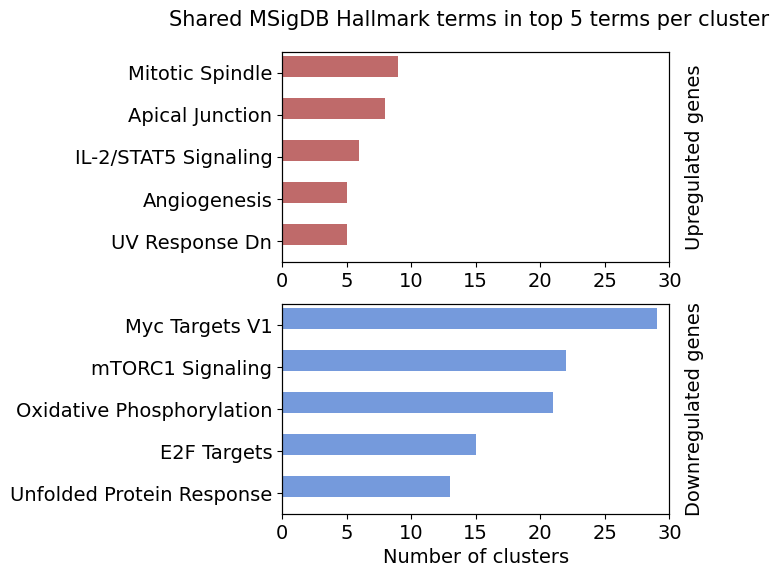

In [ ]:
plot_shared_top_terms_gseapy(signed_top_5_hallmark_terms_per_cluster8, 
                                "Shared MSigDB Hallmark terms in top 5 terms per cluster",
                                go=False, n_pathways=5)

In [ ]:
signed_top_hallmark_term_per_cluster8.head(20)

,Cluster,UP/DOWN,Gene_set,Term,P-value,Adjusted P-value,Combined Score
0,0,UP,MSigDB_Hallmark_2020,Mitotic Spindle,2.093250e-04,3.139875e-03,254.892555
0,0,DOWN,MSigDB_Hallmark_2020,Myc Targets V1,2.328317e-38,6.519287e-37,5812.266594
0,1,UP,MSigDB_Hallmark_2020,Angiogenesis,2.663275e-05,6.924515e-04,629.549386
0,1,DOWN,MSigDB_Hallmark_2020,Myc Targets V1,2.425411e-61,9.701645e-60,7769.704133
0,2,UP,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,5.782475e-06,9.830207e-05,268.427416
0,2,DOWN,MSigDB_Hallmark_2020,Myc Targets V1,1.353458e-82,5.143140e-81,13835.621127
0,3,UP,MSigDB_Hallmark_2020,UV Response Dn,1.532331e-03,2.231675e-02,92.011483
0,3,DOWN,MSigDB_Hallmark_2020,Myc Targets V1,2.123045e-69,8.704486e-68,9853.415665
0,4,UP,MSigDB_Hallmark_2020,Mitotic Spindle,6.250993e-06,8.751390e-05,483.178934
0,4,DOWN,MSigDB_Hallmark_2020,Oxidative Phosphorylation,5.945927e-12,9.513483e-11,1108.840220


### Reactome

In [ ]:
signed_results_reac8 = ora_gseapy_full(signed_targets8_lfc0pt25, ["Reactome_Pathways_2024"])

Processing cluster number: 100%|██████████| 29/29 [02:04<00:00,  4.30s/it]


In [ ]:
signed_results_reac8 = signed_results_reac8.rename(columns={"cluster":"Cluster",
                                                                  "up/down":"UP/DOWN"})

In [ ]:
cols = ["Cluster", "UP/DOWN", "Gene_set", "Term", "P-value", "Adjusted P-value", "Combined Score"]
signed_top_reac_term_per_cluster8 = filter_gseapy_results(signed_results_reac8, n_top_results=1, columns=cols)
signed_top_5_reac_terms_per_cluster8 = filter_gseapy_results(signed_results_reac8, n_top_results=5, columns=cols)

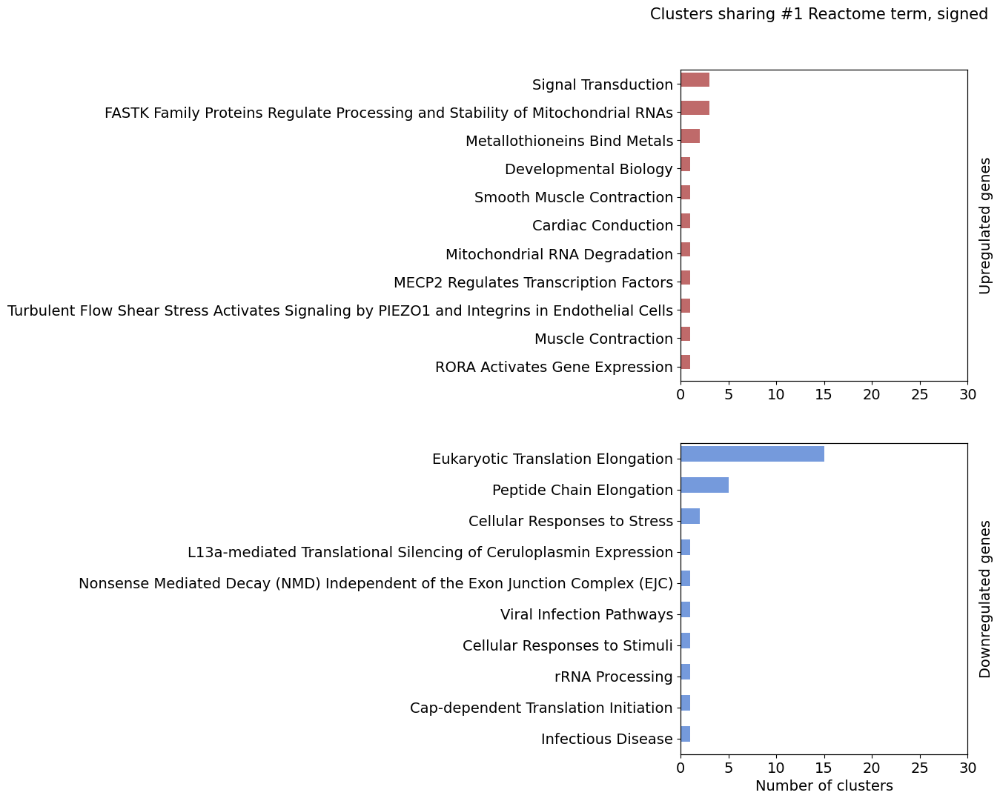

In [ ]:
plot_shared_top_terms_gseapy(signed_top_reac_term_per_cluster8, 
                                "Clusters sharing #1 Reactome term, signed",
                                go=False, n_pathways=29, fig_size=(5, 12))

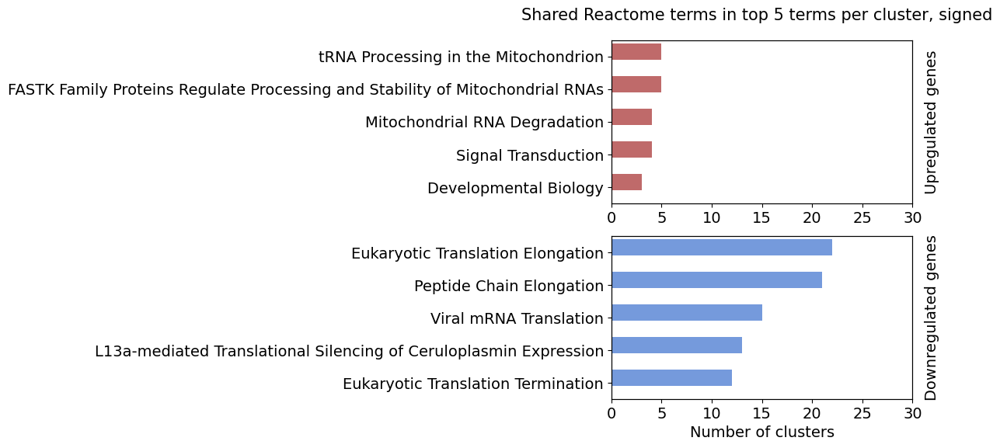

In [ ]:
plot_shared_top_terms_gseapy(signed_top_5_reac_terms_per_cluster8, 
                                "Shared Reactome terms in top 5 terms per cluster, signed",
                                go=False, n_pathways=5)

In [ ]:
signed_top_reac_term_per_cluster8.head(20)

,Cluster,UP/DOWN,Gene_set,Term,P-value,Adjusted P-value,Combined Score
1,0,UP,Reactome_Pathways_2024,Signal Transduction,6.572817e-06,7.788788e-04,113.993453
0,0,DOWN,Reactome_Pathways_2024,Peptide Chain Elongation,4.945564e-86,3.991070e-83,88437.078643
0,1,UP,Reactome_Pathways_2024,Signal Transduction,1.584121e-10,7.572098e-08,168.340683
0,1,DOWN,Reactome_Pathways_2024,Eukaryotic Translation Elongation,4.097232e-162,4.261121e-159,423400.872100
0,2,UP,Reactome_Pathways_2024,Smooth Muscle Contraction,2.293635e-07,7.179078e-05,1407.919488
0,2,DOWN,Reactome_Pathways_2024,Eukaryotic Translation Elongation,1.309275e-161,1.357718e-158,409567.936313
0,3,UP,Reactome_Pathways_2024,Developmental Biology,1.551162e-08,2.406608e-06,152.173356
0,3,DOWN,Reactome_Pathways_2024,Eukaryotic Translation Elongation,7.018562e-119,7.467750e-116,107686.750058
0,4,UP,Reactome_Pathways_2024,Mitochondrial RNA Degradation,3.521184e-07,7.394486e-05,4181.852348
0,4,DOWN,Reactome_Pathways_2024,L13a-mediated Translational Silencing of Ceruloplasmin Expression,5.746503e-29,2.108966e-26,11928.196208
